In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import tarfile

# Path to your .tgz file
file_path = '/content/drive/MyDrive/krishna/CUB_200_2011.tgz'

# Extract the .tgz file
with tarfile.open(file_path, 'r:gz') as tar:
    tar.extractall()

In [ ]:
import zipfile

#unzip the downloaded file
zip_ref = zipfile.ZipFile("/content/drive/MyDrive/krishna/birds.zip")
zip_ref.extractall()
zip_ref.close()

In [ ]:
text_path = '/content/birds/text_c10/001.Black_footed_Albatross/Black_Footed_Albatross_0001_796111.txt'

In [ ]:
file=open(text_path,"r")

print("read function: ")
print(file.read())
print()

read function: 
the medium sized bird has a dark grey color, a black downward curved beak, and long wings.
the bird is dark grey brown with a thick curved bill and a flat shaped tail.
bird has brown body feathers, white breast feathers and black beak
this bird has a dark brown overall body color, with a small white patch around the base of the bill.
the bird has very long and large brown wings, as well as a black body and a long black beak.
it is a type of albatross with black wings, tail, back and beak, and has a white ring at the base of its beak.
this bird has brown plumage and a white ring at the base of its long, curved brown beak.
the entire body is dark brown, as is the bill, with a white band encircling where the bill meets the head.
this bird is gray in color, with a large curved beak.
a large gray bird with a long wingspan and a long black beak.




# STACK I Implemntation

### Importing libraries

In [ ]:
import os
import pickle
import random
import time

import PIL
import numpy as np
import pandas as pd
import tensorflow as tf
from PIL import Image
from keras import Input, Model
from keras import backend as K
from keras.callbacks import TensorBoard
from keras.layers import Dense, LeakyReLU, BatchNormalization, ReLU, Reshape, UpSampling2D, Conv2D, Activation, \
    concatenate, Flatten, Lambda, Concatenate, ZeroPadding2D
from keras.layers import add
from keras.optimizers import Adam
from matplotlib import pyplot as plt

### Function to load the dataset

In [ ]:
def load_class_ids(class_info_file_path):
    """
    Load class ids from class_info.pickle file
    """
    with open(class_info_file_path, 'rb') as f:
        class_ids = pickle.load(f, encoding='latin1')
        return class_ids

In [ ]:
def load_embeddings(embeddings_file_path):
    """
    Load embeddings
    """
    with open(embeddings_file_path, 'rb') as f:
        embeddings = pickle.load(f, encoding='latin1')
        embeddings = np.array(embeddings)
        print('embeddings: ', embeddings.shape)
    return embeddings

In [ ]:
def load_filenames(filenames_file_path):
    """
    Load filenames.pickle file and return a list of all file names
    """
    with open(filenames_file_path, 'rb') as f:
        filenames = pickle.load(f, encoding='latin1')
    return filenames

In [ ]:
def load_bounding_boxes(dataset_dir):
    """
    Load bounding boxes and return a dictionary of file names and corresponding bounding boxes
    """
    # Paths
    bounding_boxes_path = os.path.join(dataset_dir, 'bounding_boxes.txt')
    file_paths_path = os.path.join(dataset_dir, 'images.txt')

    # Read bounding_boxes.txt and images.txt file
    df_bounding_boxes = pd.read_csv(bounding_boxes_path,
                                    delim_whitespace=True, header=None).astype(int)
    df_file_names = pd.read_csv(file_paths_path, delim_whitespace=True, header=None)

    # Create a list of file names
    file_names = df_file_names[1].tolist()

    # Create a dictionary of file_names and bounding boxes
    filename_boundingbox_dict = {img_file[:-4]: [] for img_file in file_names[:2]}

    # Assign a bounding box to the corresponding image
    for i in range(0, len(file_names)):
        # Get the bounding box
        bounding_box = df_bounding_boxes.iloc[i][1:].tolist()
        key = file_names[i][:-4]
        filename_boundingbox_dict[key] = bounding_box

    return filename_boundingbox_dict

In [ ]:
def get_img(img_path, bbox, image_size):
    """
    Load and resize image
    """
    img = Image.open(img_path).convert('RGB')
    width, height = img.size
    if bbox is not None:
        R = int(np.maximum(bbox[2], bbox[3]) * 0.75)
        center_x = int((2 * bbox[0] + bbox[2]) / 2)
        center_y = int((2 * bbox[1] + bbox[3]) / 2)
        y1 = np.maximum(0, center_y - R)
        y2 = np.minimum(height, center_y + R)
        x1 = np.maximum(0, center_x - R)
        x2 = np.minimum(width, center_x + R)
        img = img.crop([x1, y1, x2, y2])
    img = img.resize(image_size, PIL.Image.BILINEAR)
    return img

In [ ]:
def load_dataset(filenames_file_path, class_info_file_path, cub_dataset_dir, embeddings_file_path, image_size):
    """
    Load dataset
    """
    filenames = load_filenames(filenames_file_path)
    class_ids = load_class_ids(class_info_file_path)
    bounding_boxes = load_bounding_boxes(cub_dataset_dir)
    all_embeddings = load_embeddings(embeddings_file_path)

    X, y, embeddings = [], [], []

    print("Embeddings shape:", all_embeddings.shape)

    for index, filename in enumerate(filenames):
        bounding_box = bounding_boxes[filename]

        try:
            # Load images
            img_name = '{}/images/{}.jpg'.format(cub_dataset_dir, filename)
            img = get_img(img_name, bounding_box, image_size)

            all_embeddings1 = all_embeddings[index, :, :]

            embedding_ix = random.randint(0, all_embeddings1.shape[0] - 1)
            embedding = all_embeddings1[embedding_ix, :]

            X.append(np.array(img))
            y.append(class_ids[index])
            embeddings.append(embedding)
        except Exception as e:
            print(e)

    X = np.array(X)
    y = np.array(y)
    embeddings = np.array(embeddings)
    return X, y, embeddings

### Model Creation - Stage I architecture

In [ ]:
def generate_c(x):
    mean = x[:, :128]
    log_sigma = x[:, 128:]
    stddev = K.exp(log_sigma)
    epsilon = K.random_normal(shape=K.constant((mean.shape[1],), dtype='int32'))
    c = stddev * epsilon + mean
    return c

In [ ]:
def build_ca_model():
    """
    Get conditioning augmentation model.
    Takes an embedding of shape (1024,) and returns a tensor of shape (256,)
    """
    input_layer = Input(shape=(1024,))
    x = Dense(256)(input_layer)
    x = LeakyReLU(alpha=0.2)(x)
    model = Model(inputs=[input_layer], outputs=[x])
    return model

In [ ]:
def build_embedding_compressor_model():
    """
    Build embedding compressor model
    """
    input_layer = Input(shape=(1024,))
    x = Dense(128)(input_layer)
    x = ReLU()(x)

    model = Model(inputs=[input_layer], outputs=[x])
    return model

In [ ]:
def build_stage1_generator():
    """
    Builds a generator model used in Stage-I
    """
    input_layer = Input(shape=(1024,))
    x = Dense(256)(input_layer)
    mean_logsigma = LeakyReLU(alpha=0.2)(x)

    c = Lambda(generate_c)(mean_logsigma)

    input_layer2 = Input(shape=(100,))

    gen_input = Concatenate(axis=1)([c, input_layer2])

    x = Dense(128 * 8 * 4 * 4, use_bias=False)(gen_input)
    x = ReLU()(x)

    x = Reshape((4, 4, 128 * 8), input_shape=(128 * 8 * 4 * 4,))(x)

    x = UpSampling2D(size=(2, 2))(x)
    x = Conv2D(512, kernel_size=3, padding="same", strides=1, use_bias=False)(x)
    x = BatchNormalization()(x)
    x = ReLU()(x)

    x = UpSampling2D(size=(2, 2))(x)
    x = Conv2D(256, kernel_size=3, padding="same", strides=1, use_bias=False)(x)
    x = BatchNormalization()(x)
    x = ReLU()(x)

    x = UpSampling2D(size=(2, 2))(x)
    x = Conv2D(128, kernel_size=3, padding="same", strides=1, use_bias=False)(x)
    x = BatchNormalization()(x)
    x = ReLU()(x)

    x = UpSampling2D(size=(2, 2))(x)
    x = Conv2D(64, kernel_size=3, padding="same", strides=1, use_bias=False)(x)
    x = BatchNormalization()(x)
    x = ReLU()(x)

    x = Conv2D(3, kernel_size=3, padding="same", strides=1, use_bias=False)(x)
    x = Activation(activation='tanh')(x)

    stage1_gen = Model(inputs=[input_layer, input_layer2], outputs=[x, mean_logsigma])
    return stage1_gen

In [ ]:
def build_stage1_discriminator():
    """
    Create a model which takes two inputs
    1. One from above network
    2. One from the embedding layer
    3. Concatenate along the axis dimension and feed it to the last module which produces final logits
    """
    input_layer = Input(shape=(64, 64, 3))

    x = Conv2D(64, (4, 4),
               padding='same', strides=2,
               input_shape=(64, 64, 3), use_bias=False)(input_layer)
    x = LeakyReLU(alpha=0.2)(x)

    x = Conv2D(128, (4, 4), padding='same', strides=2, use_bias=False)(x)
    x = BatchNormalization()(x)
    x = LeakyReLU(alpha=0.2)(x)

    x = Conv2D(256, (4, 4), padding='same', strides=2, use_bias=False)(x)
    x = BatchNormalization()(x)
    x = LeakyReLU(alpha=0.2)(x)

    x = Conv2D(512, (4, 4), padding='same', strides=2, use_bias=False)(x)
    x = BatchNormalization()(x)
    x = LeakyReLU(alpha=0.2)(x)

    input_layer2 = Input(shape=(4, 4, 128))

    merged_input = concatenate([x, input_layer2])

    x2 = Conv2D(64 * 8, kernel_size=1,
                padding="same", strides=1)(merged_input)
    x2 = BatchNormalization()(x2)
    x2 = LeakyReLU(alpha=0.2)(x2)
    x2 = Flatten()(x2)
    x2 = Dense(1)(x2)
    x2 = Activation('sigmoid')(x2)

    stage1_dis = Model(inputs=[input_layer, input_layer2], outputs=[x2])
    return stage1_dis

In [ ]:
def build_adversarial_model(gen_model, dis_model):
    input_layer = Input(shape=(1024,))
    input_layer2 = Input(shape=(100,))
    input_layer3 = Input(shape=(4, 4, 128))

    x, mean_logsigma = gen_model([input_layer, input_layer2])

    dis_model.trainable = False
    valid = dis_model([x, input_layer3])

    model = Model(inputs=[input_layer, input_layer2, input_layer3], outputs=[valid, mean_logsigma])
    return model

### Defining Loss- function for our KL loss

In [ ]:
def KL_loss(y_true, y_pred):
    mean = y_pred[:, :128]
    logsigma = y_pred[:, :128]
    loss = -logsigma + .5 * (-1 + K.exp(2. * logsigma) + K.square(mean))
    loss = K.mean(loss)
    return loss

In [ ]:
def custom_generator_loss(y_true, y_pred):
    # Calculate binary cross entropy loss
    return K.binary_crossentropy(y_true, y_pred)

In [ ]:
def save_rgb_img(img, path):
    """
    Save an rgb image
    """
    fig = plt.figure()
    ax = fig.add_subplot(1, 1, 1)
    ax.imshow(img)
    ax.axis("off")
    ax.set_title("Image")

    plt.savefig(path)
    plt.close()

In [ ]:
def write_log(callback, name, loss, batch_no):
    """
    Write training summary to TensorBoard
    """
    summary = tf.summary()
    summary_value = summary.value.add()
    summary_value.simple_value = loss
    summary_value.tag = name
    callback.writer.add_summary(summary, batch_no)
    callback.writer.flush()

In [ ]:
if __name__ == '__main__':
    data_dir = "/content/birds/"
    train_dir = data_dir + "/train"
    test_dir = data_dir + "/test"
    image_size = 64
    batch_size = 64
    z_dim = 100
    stage1_generator_lr = 0.0002
    stage1_discriminator_lr = 0.0002
    stage1_lr_decay_step = 600
    #epochs = 1000
    epochs = 250
    condition_dim = 128

    embeddings_file_path_train = train_dir + "/char-CNN-RNN-embeddings.pickle"
    embeddings_file_path_test = test_dir + "/char-CNN-RNN-embeddings.pickle"

    filenames_file_path_train = train_dir + "/filenames.pickle"
    filenames_file_path_test = test_dir + "/filenames.pickle"

    class_info_file_path_train = train_dir + "/class_info.pickle"
    class_info_file_path_test = test_dir + "/class_info.pickle"

    cub_dataset_dir = "/content/CUB_200_2011"

    # Define optimizers
    dis_optimizer = Adam(lr=stage1_discriminator_lr, beta_1=0.5, beta_2=0.999)
    gen_optimizer = Adam(lr=stage1_generator_lr, beta_1=0.5, beta_2=0.999)

    """"
    Load datasets
    """
    X_train, y_train, embeddings_train = load_dataset(filenames_file_path=filenames_file_path_train,
                                                      class_info_file_path=class_info_file_path_train,
                                                      cub_dataset_dir=cub_dataset_dir,
                                                      embeddings_file_path=embeddings_file_path_train,
                                                      image_size=(64, 64))

    X_test, y_test, embeddings_test = load_dataset(filenames_file_path=filenames_file_path_test,
                                                   class_info_file_path=class_info_file_path_test,
                                                   cub_dataset_dir=cub_dataset_dir,
                                                   embeddings_file_path=embeddings_file_path_test,
                                                   image_size=(64, 64))

    """
    Build and compile networks
    """
    ca_model = build_ca_model()
    ca_model.compile(loss="binary_crossentropy", optimizer="adam")

    stage1_dis = build_stage1_discriminator()
    stage1_dis.compile(loss='binary_crossentropy', optimizer=dis_optimizer)

    stage1_gen = build_stage1_generator()
    stage1_gen.compile(loss="mse", optimizer=gen_optimizer)

    embedding_compressor_model = build_embedding_compressor_model()
    embedding_compressor_model.compile(loss="binary_crossentropy", optimizer="adam")

    adversarial_model = build_adversarial_model(gen_model=stage1_gen, dis_model=stage1_dis)
    adversarial_model.compile(loss=['binary_crossentropy', KL_loss], loss_weights=[1, 2.0],
                              optimizer=gen_optimizer, metrics=None)

    tensorboard = TensorBoard(log_dir="/content/drive/MyDrive/krishna/logs/".format(time.time()))


    tensorboard.set_model(stage1_gen)
    tensorboard.set_model(stage1_dis)
    tensorboard.set_model(ca_model)
    tensorboard.set_model(embedding_compressor_model)

    # Generate an array containing real and fake values
    # Apply label smoothing as well
    real_labels = np.ones((batch_size, 1), dtype=float) * 0.9
    fake_labels = np.zeros((batch_size, 1), dtype=float) * 0.1

    for epoch in range(epochs):
        print("========================================")
        print("Epoch is:", epoch)
        print("Number of batches", int(X_train.shape[0] / batch_size))

        gen_losses = []
        dis_losses = []

        # Load data and train model
        number_of_batches = int(X_train.shape[0] / batch_size)
        for index in range(number_of_batches):
            print("Batch:{}".format(index+1))

            """
            Train the discriminator network
            """
            # Sample a batch of data
            z_noise = np.random.normal(0, 1, size=(batch_size, z_dim))
            image_batch = X_train[index * batch_size:(index + 1) * batch_size]
            embedding_batch = embeddings_train[index * batch_size:(index + 1) * batch_size]
            image_batch = (image_batch - 127.5) / 127.5

            # Generate fake images
            fake_images, _ = stage1_gen.predict([embedding_batch, z_noise], verbose=3)

            # Generate compressed embeddings
            compressed_embedding = embedding_compressor_model.predict_on_batch(embedding_batch)
            compressed_embedding = np.reshape(compressed_embedding, (-1, 1, 1, condition_dim))
            compressed_embedding = np.tile(compressed_embedding, (1, 4, 4, 1))

            dis_loss_real = stage1_dis.train_on_batch([image_batch, compressed_embedding],
                                                      np.reshape(real_labels, (batch_size, 1)))
            dis_loss_fake = stage1_dis.train_on_batch([fake_images, compressed_embedding],
                                                      np.reshape(fake_labels, (batch_size, 1)))
            dis_loss_wrong = stage1_dis.train_on_batch([image_batch[:(batch_size - 1)], compressed_embedding[1:]],
                                                       np.reshape(fake_labels[1:], (batch_size-1, 1)))

            d_loss = 0.5 * np.add(dis_loss_real, 0.5 * np.add(dis_loss_wrong, dis_loss_fake))

            print("d_loss_real:{}".format(dis_loss_real))
            print("d_loss_fake:{}".format(dis_loss_fake))
            print("d_loss_wrong:{}".format(dis_loss_wrong))
            print("d_loss:{}".format(d_loss))

            """
            Train the generator network
            """
            g_loss = adversarial_model.train_on_batch([embedding_batch, z_noise, compressed_embedding],[K.ones((batch_size, 1)) * 0.9, K.ones((batch_size, 256)) * 0.9])
            print("g_loss:{}".format(g_loss))

            dis_losses.append(d_loss)
            gen_losses.append(g_loss)

        """
        Save losses to Tensorboard after each epoch
        """
        # write_log(tensorboard, 'discriminator_loss', np.mean(dis_losses), epoch)
        # write_log(tensorboard, 'generator_loss', np.mean(gen_losses[0]), epoch)

        # Generate and save images after every 2nd epoch
        if epoch % 2 == 0:
            # z_noise2 = np.random.uniform(-1, 1, size=(batch_size, z_dim))
            z_noise2 = np.random.normal(0, 1, size=(batch_size, z_dim))
            embedding_batch = embeddings_test[0:batch_size]
            fake_images, _ = stage1_gen.predict_on_batch([embedding_batch, z_noise2])

            # Save images
            for i, img in enumerate(fake_images[:10]):
                save_rgb_img(img, "/content/drive/MyDrive/krishna/results/gen_{}_{}.png".format(epoch, i))

    # Save models
    stage1_gen.save_weights("/content/drive/MyDrive/krishna/Model/stage1_gen.h5")
    stage1_dis.save_weights("/content/drive/MyDrive/krishna/Model/stage1_dis.h5")

    stage1_gen.save("/content/drive/MyDrive/krishna/Model/stage1_gen_model.h5")
    stage1_dis.save("/content/drive/MyDrive/krishna/Model/stage1_dis_model.h5")

/usr/local/lib/python3.10/dist-packages/keras/optimizers/legacy/adam.py:117: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


embeddings:  (8855, 10, 1024)
Embeddings shape: (8855, 10, 1024)
embeddings:  (2933, 10, 1024)
Embeddings shape: (2933, 10, 1024)
Epoch is: 0
Number of batches 138
Batch:1
d_loss_real:0.6423248648643494
d_loss_fake:3.805619478225708
d_loss_wrong:5.507665157318115
d_loss:2.6494835913181305
g_loss:[0.7530632615089417, 0.7171779870986938, 0.0179426446557045]
Batch:2
d_loss_real:1.2091000080108643
d_loss_fake:1.3218921422958374
d_loss_wrong:1.0391110181808472
d_loss:1.1948007941246033
g_loss:[0.7586366534233093, 0.7241529822349548, 0.017241839319467545]
Batch:3
d_loss_real:3.4291911125183105
d_loss_fake:0.028995031490921974
d_loss_wrong:1.1348036527633667
d_loss:2.0055452273227274
g_loss:[0.7679737210273743, 0.7340980768203735, 0.01693781092762947]
Batch:4
d_loss_real:2.4395132064819336
d_loss_fake:0.08151037245988846
d_loss_wrong:2.5226449966430664
d_loss:1.8707954455167055
g_loss:[0.7467103600502014, 0.7171797752380371, 0.014765283092856407]
Batch:5
d_loss_real:1.848398208618164
d_loss_f

Epoch is: 1
Number of batches 138
Batch:1
d_loss_real:0.9172744154930115
d_loss_fake:0.0017966961022466421
d_loss_wrong:0.7114679217338562
d_loss:0.6369533622055314
g_loss:[0.36558860540390015, 0.36123597621917725, 0.0021763169206678867]
Batch:2
d_loss_real:0.8971458077430725
d_loss_fake:0.002099936595186591
d_loss_wrong:0.7082492709159851
d_loss:0.6261602057493292
g_loss:[0.35551536083221436, 0.351263165473938, 0.0021260944195091724]
Batch:3
d_loss_real:0.852607250213623
d_loss_fake:0.002333402168005705
d_loss_wrong:0.7345457673072815
d_loss:0.6105234174756333
g_loss:[0.36177992820739746, 0.3577900528907776, 0.0019949430134147406]
Batch:4
d_loss_real:0.9577060341835022
d_loss_fake:0.0063309213146567345
d_loss_wrong:0.764380693435669
d_loss:0.6715309207793325
g_loss:[0.35077953338623047, 0.34682226181030273, 0.001978629268705845]
Batch:5
d_loss_real:0.8661900758743286
d_loss_fake:0.004136780276894569
d_loss_wrong:0.834583580493927
d_loss:0.6427751281298697
g_loss:[0.3501216173171997, 0

d_loss_real:0.8247175216674805
d_loss_fake:0.0005501661216840148
d_loss_wrong:0.6622485518455505
d_loss:0.5780584403255489
g_loss:[0.339900404214859, 0.32638978958129883, 0.006755301728844643]


Epoch is: 3
Number of batches 138
Batch:1
d_loss_real:0.8673039674758911
d_loss_fake:9.001061698654667e-05
d_loss_wrong:0.6879306435585022
d_loss:0.6056571472818177
g_loss:[0.3396942913532257, 0.3315715789794922, 0.004061361774802208]
Batch:2
d_loss_real:0.850739061832428
d_loss_fake:0.00018298177747055888
d_loss_wrong:0.6732984185218811
d_loss:0.5937398809910519
g_loss:[0.33394330739974976, 0.32583338022232056, 0.004054965917021036]
Batch:3
d_loss_real:0.834282398223877
d_loss_fake:0.00019356078701093793
d_loss_wrong:0.677523672580719
d_loss:0.586570507453871
g_loss:[0.33689749240875244, 0.33072078227996826, 0.003088360885158181]
Batch:4
d_loss_real:0.9044743776321411
d_loss_fake:7.9555124102626e-05
d_loss_wrong:0.700290858745575
d_loss:0.62732979228349
g_loss:[0.3940483331680298, 0.3872021436691284, 0.0034230914898216724]
Batch:5
d_loss_real:0.8409357070922852
d_loss_fake:0.00014010810991749167
d_loss_wrong:0.7404845952987671
d_loss:0.6056240293983137
g_loss:[0.3410533368587494, 0.32

Epoch is: 5
Number of batches 138
Batch:1
d_loss_real:0.8511812686920166
d_loss_fake:7.159169035730883e-05
d_loss_wrong:0.6773604154586792
d_loss:0.5949486361332674
g_loss:[0.3312850594520569, 0.32860204577445984, 0.0013415059074759483]
Batch:2
d_loss_real:0.8380883932113647
d_loss_fake:3.675761035992764e-05
d_loss_wrong:0.6672002673149109
d_loss:0.5858534528370001
g_loss:[0.33219441771507263, 0.32926902174949646, 0.001462695188820362]
Batch:3
d_loss_real:0.831687331199646
d_loss_fake:0.0002915014047175646
d_loss_wrong:0.6600342988967896
d_loss:0.5809251156751998
g_loss:[0.329886794090271, 0.3277600109577179, 0.0010633913334459066]
Batch:4
d_loss_real:0.8805755376815796
d_loss_fake:3.531113179633394e-05
d_loss_wrong:0.6855028867721558
d_loss:0.6116723183167778
g_loss:[0.3482913672924042, 0.3459444046020508, 0.0011734743602573872]
Batch:5
d_loss_real:0.8233105540275574
d_loss_fake:5.213454642216675e-05
d_loss_wrong:0.7130483388900757
d_loss:0.5899303953729031
g_loss:[0.3304019570350647,

Epoch is: 7
Number of batches 138
Batch:1
d_loss_real:0.847572922706604
d_loss_fake:0.004153852351009846
d_loss_wrong:0.6872931718826294
d_loss:0.5966482174117118
g_loss:[0.4138532876968384, 0.3987536132335663, 0.007549840025603771]
Batch:2
d_loss_real:0.8778483867645264
d_loss_fake:0.02202361449599266
d_loss_wrong:0.6615361571311951
d_loss:0.6098141362890601
g_loss:[0.4419327676296234, 0.42952847480773926, 0.006202146876603365]
Batch:3
d_loss_real:0.855308473110199
d_loss_fake:0.0008716058218851686
d_loss_wrong:0.6869102120399475
d_loss:0.5995996910205577
g_loss:[0.46953633427619934, 0.4579750895500183, 0.005780622363090515]
Batch:4
d_loss_real:0.9445266723632812
d_loss_fake:0.017154837027192116
d_loss_wrong:0.767795741558075
d_loss:0.6685009808279574
g_loss:[0.5109702348709106, 0.49964502453804016, 0.005662594921886921]
Batch:5
d_loss_real:0.8914557695388794
d_loss_fake:0.011647341772913933
d_loss_wrong:0.8572588562965393
d_loss:0.662954434286803
g_loss:[0.7245957255363464, 0.7124811

d_loss_real:0.8259983062744141
d_loss_fake:0.0003127670206595212
d_loss_wrong:0.6459954380989075
d_loss:0.5745762044170988
g_loss:[0.6264693737030029, 0.6199046969413757, 0.003282333491370082]


Epoch is: 9
Number of batches 138
Batch:1
d_loss_real:0.8356472849845886
d_loss_fake:0.0005451603210531175
d_loss_wrong:0.6658225655555725
d_loss:0.5844155739614507
g_loss:[0.6654601693153381, 0.6585268974304199, 0.0034666499122977257]
Batch:2
d_loss_real:0.8295800089836121
d_loss_fake:0.00014391186414286494
d_loss_wrong:0.6698581576347351
d_loss:0.5822905218665255
g_loss:[0.5792995095252991, 0.5724449157714844, 0.0034273075871169567]
Batch:3
d_loss_real:0.8206645250320435
d_loss_fake:0.00021518455469049513
d_loss_wrong:0.6644374132156372
d_loss:0.5764954119586037
g_loss:[0.5840432643890381, 0.5766145586967468, 0.0037143598310649395]
Batch:4
d_loss_real:0.8778734803199768
d_loss_fake:0.00023566768504679203
d_loss_wrong:0.6880232691764832
d_loss:0.6110014743753709
g_loss:[0.6076814532279968, 0.6018539667129517, 0.002913736505433917]
Batch:5
d_loss_real:0.8171629309654236
d_loss_fake:0.0005344509845599532
d_loss_wrong:0.7329920530319214
d_loss:0.5919630914868321
g_loss:[0.611919641494751

d_loss_real:0.8188306093215942
d_loss_fake:0.0002401520760031417
d_loss_wrong:0.6480164527893066
d_loss:0.5714794558771246
g_loss:[0.6643480658531189, 0.6603847742080688, 0.0019816490821540356]


Epoch is: 11
Number of batches 138
Batch:1
d_loss_real:0.8251559734344482
d_loss_fake:0.0010588477598503232
d_loss_wrong:0.6539998054504395
d_loss:0.5763426500197966
g_loss:[0.7456372380256653, 0.7419750094413757, 0.0018311003223061562]
Batch:2
d_loss_real:0.8235878944396973
d_loss_fake:0.00023299115127883852
d_loss_wrong:0.6563384532928467
d_loss:0.57593680833088
g_loss:[0.6593297123908997, 0.6557101011276245, 0.0018097939901053905]
Batch:3
d_loss_real:0.8183239698410034
d_loss_fake:0.00011328719847369939
d_loss_wrong:0.6541627049446106
d_loss:0.5727309829562728
g_loss:[0.6319065093994141, 0.6284580826759338, 0.0017242220928892493]
Batch:4
d_loss_real:0.8498882055282593
d_loss_fake:8.052412886172533e-05
d_loss_wrong:0.6639736294746399
d_loss:0.590957641165005
g_loss:[0.6404467821121216, 0.6373004913330078, 0.0015731567982584238]
Batch:5
d_loss_real:0.808813750743866
d_loss_fake:0.0002107032632920891
d_loss_wrong:0.692110002040863
d_loss:0.5774870516979718
g_loss:[0.6242026686668396, 0

d_loss_real:0.8187029361724854
d_loss_fake:4.5109329221304506e-05
d_loss_wrong:0.6424335241317749
d_loss:0.5699711264514917
g_loss:[0.5085123181343079, 0.507144033908844, 0.0006841382128186524]


Epoch is: 13
Number of batches 138
Batch:1
d_loss_real:0.8288301825523376
d_loss_fake:3.286116407252848e-05
d_loss_wrong:0.6514734625816345
d_loss:0.5772916722125956
g_loss:[0.5188292264938354, 0.5172246694564819, 0.0008022865513339639]
Batch:2
d_loss_real:0.8237618207931519
d_loss_fake:0.00011456740321591496
d_loss_wrong:0.6533625721931458
d_loss:0.5752501952956663
g_loss:[0.5097916126251221, 0.5085423588752747, 0.0006246227421797812]
Batch:3
d_loss_real:0.8184447288513184
d_loss_fake:3.5759247111855075e-05
d_loss_wrong:0.6517964005470276
d_loss:0.572180404374194
g_loss:[0.5191935300827026, 0.517970085144043, 0.0006117193261161447]
Batch:4
d_loss_real:0.8455054759979248
d_loss_fake:0.00011241409811191261
d_loss_wrong:0.6619743704795837
d_loss:0.5882744341433863
g_loss:[0.49560481309890747, 0.49452561140060425, 0.0005395965417847037]
Batch:5
d_loss_real:0.8133188486099243
d_loss_fake:0.0004064610693603754
d_loss_wrong:0.6813856363296509
d_loss:0.577107448654715
g_loss:[0.50893121957778

d_loss_real:0.8172533512115479
d_loss_fake:0.0004034191952086985
d_loss_wrong:0.6603864431381226
d_loss:0.5738241411891067
g_loss:[1.1383602619171143, 1.1377606391906738, 0.0002998110721819103]


Epoch is: 15
Number of batches 138
Batch:1
d_loss_real:0.9079697132110596
d_loss_fake:0.006011749617755413
d_loss_wrong:0.6796244382858276
d_loss:0.6253939035814255
g_loss:[0.8697435855865479, 0.8690762519836426, 0.0003336548979859799]
Batch:2
d_loss_real:0.8045598864555359
d_loss_fake:0.00015814363723620772
d_loss_wrong:0.6508349180221558
d_loss:0.5650282086426159
g_loss:[0.8804515600204468, 0.8798970580101013, 0.0002772581938188523]
Batch:3
d_loss_real:0.8026386499404907
d_loss_fake:0.00041002780199050903
d_loss_wrong:0.6592332124710083
d_loss:0.5662301350384951
g_loss:[0.884695291519165, 0.8840891122817993, 0.00030309148132801056]
Batch:4
d_loss_real:0.850315272808075
d_loss_fake:0.00029320205794647336
d_loss_wrong:0.6508665680885315
d_loss:0.587947578940657
g_loss:[0.8574450016021729, 0.8569175004959106, 0.00026374697335995734]
Batch:5
d_loss_real:0.8163732290267944
d_loss_fake:0.0003379725676495582
d_loss_wrong:0.6699106693267822
d_loss:0.5757487749870052
g_loss:[0.799432158470153

Epoch is: 17
Number of batches 138
Batch:1
d_loss_real:0.8121328353881836
d_loss_fake:0.000797899323515594
d_loss_wrong:0.6432040333747864
d_loss:0.5670669008686673
g_loss:[0.8136090636253357, 0.8131769299507141, 0.00021606162772513926]
Batch:2
d_loss_real:0.812277615070343
d_loss_fake:0.00012963026529178023
d_loss_wrong:0.6514003872871399
d_loss:0.5690213119232794
g_loss:[0.7922719717025757, 0.7918967008590698, 0.00018763801199384034]
Batch:3
d_loss_real:0.8064231276512146
d_loss_fake:3.461426967987791e-05
d_loss_wrong:0.6545668840408325
d_loss:0.5668619384032354
g_loss:[0.7359007596969604, 0.7354496717453003, 0.00022552981681656092]
Batch:4
d_loss_real:0.8273471593856812
d_loss_fake:5.735976810683496e-05
d_loss_wrong:0.6499738693237305
d_loss:0.5761813869657999
g_loss:[0.6763432621955872, 0.6759510040283203, 0.00019611543393693864]
Batch:5
d_loss_real:0.8124828934669495
d_loss_fake:0.00016212539048865438
d_loss_wrong:0.6627456545829773
d_loss:0.5719683917268412
g_loss:[0.658060729503

d_loss_real:0.8064572811126709
d_loss_fake:0.00019067173707298934
d_loss_wrong:0.6343663334846497
d_loss:0.5618678918617661
g_loss:[0.7484759092330933, 0.7437125444412231, 0.002381677273660898]


Epoch is: 19
Number of batches 138
Batch:1
d_loss_real:0.8308050632476807
d_loss_fake:0.00016345016774721444
d_loss_wrong:0.7215949296951294
d_loss:0.5958421265895595
g_loss:[0.7349585294723511, 0.7306490540504456, 0.002154740272089839]
Batch:2
d_loss_real:0.8053019046783447
d_loss_fake:0.000528739532455802
d_loss_wrong:0.6644711494445801
d_loss:0.5689009245834313
g_loss:[0.7312175035476685, 0.7260326743125916, 0.002592424163594842]
Batch:3
d_loss_real:0.8348225355148315
d_loss_fake:0.0003770248149521649
d_loss_wrong:0.6499380469322205
d_loss:0.5799900356942089
g_loss:[0.7041235566139221, 0.6948785185813904, 0.004622516222298145]
Batch:4
d_loss_real:0.8389151096343994
d_loss_fake:0.0001499033096479252
d_loss_wrong:0.6447965502738953
d_loss:0.5806941682130855
g_loss:[0.6850276589393616, 0.6759718656539917, 0.004527896177023649]
Batch:5
d_loss_real:0.8254231214523315
d_loss_fake:0.0007036079186946154
d_loss_wrong:0.636342465877533
d_loss:0.5719730791752227
g_loss:[0.646696925163269, 0.63

d_loss_real:0.8063512444496155
d_loss_fake:0.00013964992831461132
d_loss_wrong:0.6134966015815735
d_loss:0.5565846851022798
g_loss:[0.6249061822891235, 0.6234495043754578, 0.0007283492013812065]


Epoch is: 21
Number of batches 138
Batch:1
d_loss_real:0.8359462022781372
d_loss_fake:1.5266326954588294e-05
d_loss_wrong:0.686299741268158
d_loss:0.5895518530378467
g_loss:[0.635158896446228, 0.6339560747146606, 0.0006014240207150578]
Batch:2
d_loss_real:0.8001796007156372
d_loss_fake:4.386865475680679e-05
d_loss_wrong:0.6637095808982849
d_loss:0.566028162746079
g_loss:[0.6176205277442932, 0.6161749362945557, 0.0007227903697639704]
Batch:3
d_loss_real:0.8084623217582703
d_loss_fake:0.00012468357454054058
d_loss_wrong:0.6477504968643188
d_loss:0.56619995598885
g_loss:[0.7050141096115112, 0.7027204036712646, 0.0011468459852039814]
Batch:4
d_loss_real:0.8071736693382263
d_loss_fake:5.098154360894114e-05
d_loss_wrong:0.6234405636787415
d_loss:0.5594597209747008
g_loss:[0.6938859224319458, 0.69117271900177, 0.0013566032284870744]
Batch:5
d_loss_real:0.808343768119812
d_loss_fake:9.830508497543633e-05
d_loss_wrong:0.6191878914833069
d_loss:0.5589934332019766
g_loss:[0.6928138732910156, 0.69

Epoch is: 23
Number of batches 138
Batch:1
d_loss_real:0.8202811479568481
d_loss_fake:8.696655640960671e-06
d_loss_wrong:0.6743708848953247
d_loss:0.5787354693661655
g_loss:[0.6816161274909973, 0.68099045753479, 0.0003128208336420357]
Batch:2
d_loss_real:0.7972385287284851
d_loss_fake:0.00012949817755725235
d_loss_wrong:0.6629887223243713
d_loss:0.5643988194897247
g_loss:[0.688854455947876, 0.6881406307220459, 0.00035692111123353243]
Batch:3
d_loss_real:0.8043055534362793
d_loss_fake:2.518205474189017e-05
d_loss_wrong:0.6552263498306274
d_loss:0.565965659689482
g_loss:[0.7152302265167236, 0.7141367793083191, 0.0005467341979965568]
Batch:4
d_loss_real:0.8123781085014343
d_loss_fake:5.737195351684932e-06
d_loss_wrong:0.6134397983551025
d_loss:0.5595504381383307
g_loss:[0.7725079655647278, 0.7711653113365173, 0.0006713290931656957]
Batch:5
d_loss_real:0.8116973042488098
d_loss_fake:8.274272659036797e-06
d_loss_wrong:0.6049410104751587
d_loss:0.5570859733113593
g_loss:[0.7484618425369263, 

d_loss_real:0.8053203225135803
d_loss_fake:0.00018550705863162875
d_loss_wrong:0.6207752823829651
d_loss:0.5579003586171893
g_loss:[0.7167455554008484, 0.716066837310791, 0.00033934653038159013]


Epoch is: 25
Number of batches 138
Batch:1
d_loss_real:0.835685133934021
d_loss_fake:0.011538960039615631
d_loss_wrong:0.6797131299972534
d_loss:0.5906555894762278
g_loss:[0.8552618622779846, 0.8547298312187195, 0.00026600310229696333]
Batch:2
d_loss_real:0.7879739999771118
d_loss_fake:0.00011817915947176516
d_loss_wrong:0.7082682847976685
d_loss:0.571083615977841
g_loss:[0.8917924761772156, 0.8912255167961121, 0.0002834725601132959]
Batch:3
d_loss_real:0.8183000683784485
d_loss_fake:0.00038235337706282735
d_loss_wrong:0.6084593534469604
d_loss:0.5613604608952301
g_loss:[1.0525985956192017, 1.0519211292266846, 0.0003387236502021551]
Batch:4
d_loss_real:0.8344140648841858
d_loss_fake:2.6911398890661076e-05
d_loss_wrong:0.5902724266052246
d_loss:0.5647818669431217
g_loss:[0.906739354133606, 0.9059650897979736, 0.000387138978112489]
Batch:5
d_loss_real:0.8346132040023804
d_loss_fake:6.661524821538478e-06
d_loss_wrong:0.5961813926696777
d_loss:0.566353615549815
g_loss:[0.9525454044342041, 

d_loss_real:0.8056268692016602
d_loss_fake:9.448482160223648e-06
d_loss_wrong:0.6118512749671936
d_loss:0.5557786154631685
g_loss:[0.5229893922805786, 0.5224258303642273, 0.00028178567299619317]


Epoch is: 27
Number of batches 138
Batch:1
d_loss_real:0.8083840012550354
d_loss_fake:0.00041071849409490824
d_loss_wrong:0.6729603409767151
d_loss:0.5725347654952202
g_loss:[0.6068524122238159, 0.606304407119751, 0.0002739952178671956]
Batch:2
d_loss_real:0.8052569627761841
d_loss_fake:0.00012893718667328358
d_loss_wrong:0.6540349125862122
d_loss:0.5661694438313134
g_loss:[0.6131527423858643, 0.612573504447937, 0.00028962979558855295]
Batch:3
d_loss_real:0.8030633926391602
d_loss_fake:6.644451059401035e-05
d_loss_wrong:0.6537274718284607
d_loss:0.5649801754043438
g_loss:[0.6054090261459351, 0.604809045791626, 0.000299975392408669]
Batch:4
d_loss_real:0.8064113855361938
d_loss_fake:0.0009891606168821454
d_loss_wrong:0.6176659464836121
d_loss:0.5578694695432205
g_loss:[0.6042661070823669, 0.6036499738693237, 0.0003080710885114968]
Batch:5
d_loss_real:0.8115758895874023
d_loss_fake:1.3355494957068004e-05
d_loss_wrong:0.6037768125534058
d_loss:0.5567354868057919
g_loss:[0.58956378698349, 

d_loss_real:0.7996855974197388
d_loss_fake:8.88784124981612e-05
d_loss_wrong:0.6106334924697876
d_loss:0.5525233914304408
g_loss:[0.618094801902771, 0.6177619099617004, 0.00016644530114717782]


Epoch is: 29
Number of batches 138
Batch:1
d_loss_real:0.8029096126556396
d_loss_fake:1.4575780369341373e-05
d_loss_wrong:0.6640414595603943
d_loss:0.5674688151630107
g_loss:[0.6433683633804321, 0.643028974533081, 0.00016969454009085894]
Batch:2
d_loss_real:0.807891845703125
d_loss_fake:3.659439244074747e-05
d_loss_wrong:0.6396302580833435
d_loss:0.5638626359705086
g_loss:[0.619581937789917, 0.6192606687545776, 0.00016063069051597267]
Batch:3
d_loss_real:0.8075010180473328
d_loss_fake:3.9917980757309124e-05
d_loss_wrong:0.6494956612586975
d_loss:0.5661344038335301
g_loss:[0.6427505612373352, 0.6423726677894592, 0.0001889420091174543]
Batch:4
d_loss_real:0.8088193535804749
d_loss_fake:2.869624222512357e-05
d_loss_wrong:0.617457389831543
d_loss:0.5587811983086794
g_loss:[0.660517692565918, 0.6601002216339111, 0.00020874860638286918]
Batch:5
d_loss_real:0.8033074140548706
d_loss_fake:8.10156052466482e-06
d_loss_wrong:0.600325345993042
d_loss:0.551737068915827
g_loss:[0.6099786758422852, 0

d_loss_real:0.7955398559570312
d_loss_fake:6.437356660171645e-06
d_loss_wrong:0.611853837966919
d_loss:0.5507349968094104
g_loss:[0.7153584361076355, 0.715100884437561, 0.00012878613779321313]


Epoch is: 31
Number of batches 138
Batch:1
d_loss_real:0.8065005540847778
d_loss_fake:7.812672265572473e-06
d_loss_wrong:0.6689378023147583
d_loss:0.5704866807891449
g_loss:[0.7817786931991577, 0.7815049290657043, 0.00013689437764696777]
Batch:2
d_loss_real:0.7828174829483032
d_loss_fake:0.0002068064350169152
d_loss_wrong:0.6801577210426331
d_loss:0.5614998733435641
g_loss:[0.7708109021186829, 0.7705618143081665, 0.00012454691750463098]
Batch:3
d_loss_real:0.7764952182769775
d_loss_fake:0.00012662107474170625
d_loss_wrong:0.6684664487838745
d_loss:0.5553958766031428
g_loss:[0.8051186203956604, 0.8048197031021118, 0.00014946913870517164]
Batch:4
d_loss_real:0.7936933040618896
d_loss_fake:0.00011565243767108768
d_loss_wrong:0.6268292665481567
d_loss:0.5535828817774018
g_loss:[0.8200244903564453, 0.8197108507156372, 0.00015680797514505684]
Batch:5
d_loss_real:0.8006973266601562
d_loss_fake:4.2344690882600844e-05
d_loss_wrong:0.6002830862998962
d_loss:0.5504300210777728
g_loss:[0.807916820

d_loss_real:0.7966023683547974
d_loss_fake:3.8057638448663056e-05
d_loss_wrong:0.6086187362670898
d_loss:0.5504653826537833
g_loss:[0.7272263765335083, 0.72705078125, 8.77893908182159e-05]
Batch:138
d_loss_real:0.7965891361236572
d_loss_fake:4.803714546142146e-05
d_loss_wrong:0.61480313539505
d_loss:0.5520073611969565
g_loss:[0.7069592475891113, 0.706720232963562, 0.0001195199802168645]


Epoch is: 33
Number of batches 138
Batch:1
d_loss_real:0.8022038340568542
d_loss_fake:5.8451114455237985e-05
d_loss_wrong:0.6441274881362915
d_loss:0.5621484018411138
g_loss:[0.7299908995628357, 0.7297122478485107, 0.00013932531874161214]
Batch:2
d_loss_real:0.794562816619873
d_loss_fake:0.0002334706368856132
d_loss_wrong:0.6561485528945923
d_loss:0.561376914192806
g_loss:[0.7025797963142395, 0.7023298740386963, 0.00012496425188146532]
Batch:3
d_loss_real:0.7874792218208313
d_loss_fake:7.593487680424005e-05
d_loss_wrong:0.641787588596344
d_loss:0.5542054917787027
g_loss:[0.730314314365387, 0.7300305366516113, 0.00014187509077601135]
Batch:4
d_loss_real:0.7976342439651489
d_loss_fake:0.0005912820342928171
d_loss_wrong:0.6231668591499329
d_loss:0.5547566572786309
g_loss:[0.7777640223503113, 0.777489185333252, 0.00013741437578573823]
Batch:5
d_loss_real:0.7939132452011108
d_loss_fake:0.00011902386177098379
d_loss_wrong:0.605188250541687
d_loss:0.5482834412014199
g_loss:[0.7997161746025085

Epoch is: 35
Number of batches 138
Batch:1
d_loss_real:0.8031022548675537
d_loss_fake:1.820763645810075e-05
d_loss_wrong:0.6474648118019104
d_loss:0.563421882293369
g_loss:[0.7478059530258179, 0.7475655674934387, 0.00012020405847579241]
Batch:2
d_loss_real:0.799270749092102
d_loss_fake:2.0872539607807994e-05
d_loss_wrong:0.6403849720954895
d_loss:0.5597368357048254
g_loss:[0.7251904606819153, 0.7249614596366882, 0.00011449684097897261]
Batch:3
d_loss_real:0.7917104959487915
d_loss_fake:2.2552620066562667e-05
d_loss_wrong:0.6287658214569092
d_loss:0.5530523414936397
g_loss:[0.86075758934021, 0.8605026602745056, 0.0001274772803299129]
Batch:4
d_loss_real:0.7918148040771484
d_loss_fake:1.5398221876239404e-05
d_loss_wrong:0.6246160864830017
d_loss:0.5520652732147937
g_loss:[0.8702511787414551, 0.8700122833251953, 0.00011945598089369014]
Batch:5
d_loss_real:0.7889515161514282
d_loss_fake:1.6856454749358818e-05
d_loss_wrong:0.6071993112564087
d_loss:0.5462798000035036
g_loss:[0.8691880702972

d_loss_real:0.8040850162506104
d_loss_fake:0.0002156722330255434
d_loss_wrong:0.602633535861969
d_loss:0.5527548101490538
g_loss:[0.5609052181243896, 0.5600976347923279, 0.0004037955077365041]


Epoch is: 37
Number of batches 138
Batch:1
d_loss_real:0.8073800802230835
d_loss_fake:0.00038719031726941466
d_loss_wrong:0.6291035413742065
d_loss:0.5610627230344107
g_loss:[0.5529237985610962, 0.5518439412117004, 0.0005399147048592567]
Batch:2
d_loss_real:0.804229736328125
d_loss_fake:0.00034551334101706743
d_loss_wrong:0.6349577903747559
d_loss:0.5609406940930057
g_loss:[0.5848236083984375, 0.5839095115661621, 0.0004570561577565968]
Batch:3
d_loss_real:0.7987276315689087
d_loss_fake:0.0002727247483562678
d_loss_wrong:0.6270689964294434
d_loss:0.5561992460789043
g_loss:[0.611526608467102, 0.6102662086486816, 0.0006302030524238944]
Batch:4
d_loss_real:0.7983094453811646
d_loss_fake:0.00028142196242697537
d_loss_wrong:0.6252801418304443
d_loss:0.5555451136388001
g_loss:[0.5988574028015137, 0.5979717969894409, 0.0004428084648679942]
Batch:5
d_loss_real:0.7900583744049072
d_loss_fake:0.00026105711003765464
d_loss_wrong:0.6055853962898254
d_loss:0.5464908005524194
g_loss:[0.58087760210037

Epoch is: 39
Number of batches 138
Batch:1
d_loss_real:0.8009495735168457
d_loss_fake:0.0003172882425133139
d_loss_wrong:0.6395828127861023
d_loss:0.5604498120155768
g_loss:[0.7303769588470459, 0.7300288081169128, 0.00017408601706847548]
Batch:2
d_loss_real:0.7944464087486267
d_loss_fake:0.0003140377812087536
d_loss_wrong:0.6460821628570557
d_loss:0.5588222545338795
g_loss:[0.7166879773139954, 0.7163771390914917, 0.00015542478649877012]
Batch:3
d_loss_real:0.784868597984314
d_loss_fake:0.0002561529981903732
d_loss_wrong:0.6328222751617432
d_loss:0.5507039060321404
g_loss:[0.6952382922172546, 0.6948756575584412, 0.00018131629622075707]
Batch:4
d_loss_real:0.7869750261306763
d_loss_fake:0.0007107974961400032
d_loss_wrong:0.6224094033241272
d_loss:0.5492675632704049
g_loss:[0.732646107673645, 0.7323222756385803, 0.0001619276008568704]
Batch:5
d_loss_real:0.7856141924858093
d_loss_fake:0.000282239489024505
d_loss_wrong:0.6067062616348267
d_loss:0.5445542215238675
g_loss:[0.7105492353439331

d_loss_real:0.7953517436981201
d_loss_fake:3.6967729101888835e-05
d_loss_wrong:0.6057506203651428
d_loss:0.5491227688726212
g_loss:[0.6695449948310852, 0.6693238019943237, 0.00011059171811211854]


Epoch is: 41
Number of batches 138
Batch:1
d_loss_real:0.7953193187713623
d_loss_fake:3.0561015591956675e-05
d_loss_wrong:0.6417019963264465
d_loss:0.5580927987211908
g_loss:[0.6904821991920471, 0.6902438402175903, 0.00011917841038666666]
Batch:2
d_loss_real:0.7966050505638123
d_loss_fake:6.186311657074839e-05
d_loss_wrong:0.6436032652854919
d_loss:0.5592188073824218
g_loss:[0.71756511926651, 0.7173420786857605, 0.00011151660146424547]
Batch:3
d_loss_real:0.7910863161087036
d_loss_fake:2.125194441759959e-05
d_loss_wrong:0.6260309219360352
d_loss:0.552056201524465
g_loss:[0.7083706259727478, 0.7081186771392822, 0.00012598131434060633]
Batch:4
d_loss_real:0.7916386127471924
d_loss_fake:2.885050889744889e-05
d_loss_wrong:0.6212285161018372
d_loss:0.5511336480262798
g_loss:[0.7126131653785706, 0.7123702764511108, 0.00012143327330704778]
Batch:5
d_loss_real:0.789625346660614
d_loss_fake:4.474492743611336e-05
d_loss_wrong:0.6028451919555664
d_loss:0.5455351575510576
g_loss:[0.741648375988006

d_loss_real:0.7951437830924988
d_loss_fake:3.4132939617848024e-05
d_loss_wrong:0.604512631893158
d_loss:0.5487085827544433
g_loss:[0.6912113428115845, 0.6910144686698914, 9.842853614827618e-05]


Epoch is: 43
Number of batches 138
Batch:1
d_loss_real:0.7944324016571045
d_loss_fake:4.6481280151056126e-05
d_loss_wrong:0.6596055030822754
d_loss:0.5621291969191589
g_loss:[0.8405553698539734, 0.8403521776199341, 0.00010160132660530508]
Batch:2
d_loss_real:0.8017653226852417
d_loss_fake:5.277492164168507e-05
d_loss_wrong:0.6456518173217773
d_loss:0.5623088094034756
g_loss:[0.8917009234428406, 0.8915073275566101, 9.679239883553237e-05]
Batch:3
d_loss_real:0.7989362478256226
d_loss_fake:5.145774775883183e-05
d_loss_wrong:0.6184105277061462
d_loss:0.5540836202762875
g_loss:[0.8511059880256653, 0.8508966565132141, 0.00010465149534866214]
Batch:4
d_loss_real:0.8030741214752197
d_loss_fake:0.000445253390353173
d_loss_wrong:0.6174577474594116
d_loss:0.5560128109500511
g_loss:[0.8244906067848206, 0.8243016600608826, 9.448555647395551e-05]
Batch:5
d_loss_real:0.7955608367919922
d_loss_fake:0.00017186861077789217
d_loss_wrong:0.5967079997062683
d_loss:0.5470003854752576
g_loss:[0.8174284696578

d_loss_real:0.7909027338027954
d_loss_fake:8.020572568057105e-05
d_loss_wrong:0.6086803674697876
d_loss:0.5476415102002647
g_loss:[0.7671289443969727, 0.7668776512145996, 0.0001256407704204321]


Epoch is: 45
Number of batches 138
Batch:1
d_loss_real:0.793573796749115
d_loss_fake:8.429821173194796e-05
d_loss_wrong:0.6370559930801392
d_loss:0.5560719711975253
g_loss:[0.7430824637413025, 0.7428447604179382, 0.00011884162813657895]
Batch:2
d_loss_real:0.7996921539306641
d_loss_fake:0.00011233979603275657
d_loss_wrong:0.6333678960800171
d_loss:0.5582161359343445
g_loss:[0.790620744228363, 0.7904125452041626, 0.00010408622620161623]
Batch:3
d_loss_real:0.7899147272109985
d_loss_fake:0.00020312625565566123
d_loss_wrong:0.617268443107605
d_loss:0.5493252559463144
g_loss:[0.8043445944786072, 0.8040933012962341, 0.00012563751079142094]
Batch:4
d_loss_real:0.7921885251998901
d_loss_fake:9.170341218123212e-05
d_loss_wrong:0.6250211596488953
d_loss:0.5523724783652142
g_loss:[0.7899152040481567, 0.7896963357925415, 0.00010942704830085859]
Batch:5
d_loss_real:0.7837128639221191
d_loss_fake:9.142783528659493e-05
d_loss_wrong:0.6044012904167175
d_loss:0.5429796115240606
g_loss:[0.7896500825881

d_loss_real:0.7960360646247864
d_loss_fake:1.81181967491284e-05
d_loss_wrong:0.6018562912940979
d_loss:0.548486634685105
g_loss:[0.6775763630867004, 0.6773545145988464, 0.00011093151988461614]


Epoch is: 47
Number of batches 138
Batch:1
d_loss_real:0.7979313135147095
d_loss_fake:2.122107252944261e-05
d_loss_wrong:0.6298101544380188
d_loss:0.5564235006349918
g_loss:[0.6433405876159668, 0.6431349515914917, 0.00010281956929247826]
Batch:2
d_loss_real:0.7977620959281921
d_loss_fake:1.2408838301780634e-05
d_loss_wrong:0.6332941055297852
d_loss:0.5572076765561178
g_loss:[0.6751055121421814, 0.6749210953712463, 9.22072067623958e-05]
Batch:3
d_loss_real:0.7909776568412781
d_loss_fake:1.2075113772880286e-05
d_loss_wrong:0.6057891845703125
d_loss:0.5469391433416604
g_loss:[0.7430700063705444, 0.7428665161132812, 0.00010174433555221185]
Batch:4
d_loss_real:0.7961052656173706
d_loss_fake:1.888427505036816e-05
d_loss_wrong:0.6194706559181213
d_loss:0.5529250178569782
g_loss:[0.7871830463409424, 0.7870033383369446, 8.986862667370588e-05]
Batch:5
d_loss_real:0.7839987874031067
d_loss_fake:1.474237251386512e-05
d_loss_wrong:0.6002857089042664
d_loss:0.5420745065207484
g_loss:[0.8149173259735

d_loss_real:0.7919460535049438
d_loss_fake:3.9556918636662886e-05
d_loss_wrong:0.6042782068252563
d_loss:0.5470524676884452
g_loss:[0.7629738450050354, 0.7627929449081421, 9.044482430908829e-05]


Epoch is: 49
Number of batches 138
Batch:1
d_loss_real:0.7928686141967773
d_loss_fake:8.618553692940623e-05
d_loss_wrong:0.6296696662902832
d_loss:0.5538732700551918
g_loss:[0.7241154909133911, 0.7239288091659546, 9.334333299193531e-05]
Batch:2
d_loss_real:0.7981629967689514
d_loss_fake:2.16549560718704e-05
d_loss_wrong:0.6320874691009521
d_loss:0.5571087793987317
g_loss:[0.8493533730506897, 0.8491783142089844, 8.75349942361936e-05]
Batch:3
d_loss_real:0.7899461984634399
d_loss_fake:2.1199597540544346e-05
d_loss_wrong:0.6092456579208374
d_loss:0.5472898136113145
g_loss:[0.907610297203064, 0.9074103236198425, 9.997353481594473e-05]
Batch:4
d_loss_real:0.7901707291603088
d_loss_fake:2.0417164705577306e-05
d_loss_wrong:0.6225137114524841
d_loss:0.5507188967344518
g_loss:[0.861011266708374, 0.8607968091964722, 0.00010721475700847805]
Batch:5
d_loss_real:0.7808529138565063
d_loss_fake:3.9278329495573416e-05
d_loss_wrong:0.5996888279914856
d_loss:0.5403584835084985
g_loss:[0.8849035501480103

d_loss_real:0.7931510210037231
d_loss_fake:8.291190169984475e-06
d_loss_wrong:0.6039292812347412
d_loss:0.5475599036080894
g_loss:[0.70899498462677, 0.7088165283203125, 8.922000415623188e-05]


Epoch is: 51
Number of batches 138
Batch:1
d_loss_real:0.7918816804885864
d_loss_fake:9.445159776078071e-06
d_loss_wrong:0.6239838600158691
d_loss:0.5519391665382045
g_loss:[0.6635123491287231, 0.6633063554763794, 0.00010299185669282451]
Batch:2
d_loss_real:0.7873830795288086
d_loss_fake:1.8777769582811743e-05
d_loss_wrong:0.6388649344444275
d_loss:0.5534124678179069
g_loss:[0.7644376158714294, 0.7642074227333069, 0.00011508839088492095]
Batch:3
d_loss_real:0.786231279373169
d_loss_fake:2.5679970349301584e-05
d_loss_wrong:0.6097511053085327
d_loss:0.545559836006305
g_loss:[0.8232336044311523, 0.8229963779449463, 0.00011861397069878876]
Batch:4
d_loss_real:0.7942110896110535
d_loss_fake:2.3048527509672567e-05
d_loss_wrong:0.6167069673538208
d_loss:0.5512880487758594
g_loss:[0.7310014963150024, 0.7308176755905151, 9.191012213705108e-05]
Batch:5
d_loss_real:0.7832615375518799
d_loss_fake:1.748529393807985e-05
d_loss_wrong:0.5959779024124146
d_loss:0.5406296157025281
g_loss:[0.764693319797

d_loss_real:0.791027307510376
d_loss_fake:2.441551987431012e-05
d_loss_wrong:0.6050034761428833
d_loss:0.5467706266708774
g_loss:[0.7083360552787781, 0.708153247833252, 9.14016054593958e-05]


Epoch is: 53
Number of batches 138
Batch:1
d_loss_real:0.785132646560669
d_loss_fake:2.345052780583501e-05
d_loss_wrong:0.621508777141571
d_loss:0.5479493801976787
g_loss:[0.648326575756073, 0.6481417417526245, 9.241831867257133e-05]
Batch:2
d_loss_real:0.7788859605789185
d_loss_fake:2.4385404685745016e-05
d_loss_wrong:0.6426401138305664
d_loss:0.5501091050982723
g_loss:[0.6780785918235779, 0.6778712272644043, 0.00010367822687840089]
Batch:3
d_loss_real:0.7846842408180237
d_loss_fake:1.0408881280454807e-05
d_loss_wrong:0.5965843200683594
d_loss:0.5414908026464218
g_loss:[0.7480126619338989, 0.747821569442749, 9.555244469083846e-05]
Batch:4
d_loss_real:0.7971194982528687
d_loss_fake:1.818254531826824e-05
d_loss_wrong:0.613596498966217
d_loss:0.5519634195043182
g_loss:[0.707004189491272, 0.7068392038345337, 8.248925587395206e-05]
Batch:5
d_loss_real:0.7810510396957397
d_loss_fake:1.1424075637478381e-05
d_loss_wrong:0.5918563008308411
d_loss:0.5384924510744895
g_loss:[0.7437298893928528, 

d_loss_real:0.7954165935516357
d_loss_fake:5.891627733944915e-05
d_loss_wrong:0.6026131510734558
d_loss:0.5483763136135167
g_loss:[0.6073915362358093, 0.6071652173995972, 0.00011316205200273544]


Epoch is: 55
Number of batches 138
Batch:1
d_loss_real:0.7817199230194092
d_loss_fake:8.059693936957046e-05
d_loss_wrong:0.6172609925270081
d_loss:0.545195358876299
g_loss:[0.6027121543884277, 0.6024629473686218, 0.0001246072060894221]
Batch:2
d_loss_real:0.7767605781555176
d_loss_fake:5.828717621625401e-05
d_loss_wrong:0.6371745467185974
d_loss:0.5476884975514622
g_loss:[0.6388552188873291, 0.6386349201202393, 0.00011016405915142968]
Batch:3
d_loss_real:0.7832484841346741
d_loss_fake:7.865521911298856e-05
d_loss_wrong:0.5913513898849487
d_loss:0.5394817533433525
g_loss:[0.6314218044281006, 0.6311664581298828, 0.00012767809676006436]
Batch:4
d_loss_real:0.7907542586326599
d_loss_fake:4.084456304553896e-05
d_loss_wrong:0.6274270415306091
d_loss:0.5522441008397436
g_loss:[0.6694023609161377, 0.6691735982894897, 0.00011439017544034868]
Batch:5
d_loss_real:0.776015043258667
d_loss_fake:3.9158207073342055e-05
d_loss_wrong:0.5895953178405762
d_loss:0.5354161406412459
g_loss:[0.70385718345642

Epoch is: 57
Number of batches 138
Batch:1
d_loss_real:0.7750833630561829
d_loss_fake:7.552748138550669e-05
d_loss_wrong:0.6039594411849976
d_loss:0.5385504236946872
g_loss:[0.5795838236808777, 0.5792821645736694, 0.00015082539175637066]
Batch:2
d_loss_real:0.7733268737792969
d_loss_fake:7.451785495504737e-05
d_loss_wrong:0.6205033659934998
d_loss:0.5418079078517621
g_loss:[0.6317920684814453, 0.631495475769043, 0.00014828951680101454]
Batch:3
d_loss_real:0.7733051776885986
d_loss_fake:6.09860617259983e-05
d_loss_wrong:0.5868942141532898
d_loss:0.5333913888980533
g_loss:[0.7285462617874146, 0.7282053232192993, 0.0001704756577964872]
Batch:4
d_loss_real:0.7808142900466919
d_loss_fake:0.00010223258868791163
d_loss_wrong:0.6286128759384155
d_loss:0.5475859221551218
g_loss:[0.7208848595619202, 0.7205907106399536, 0.000147087819641456]
Batch:5
d_loss_real:0.7623788118362427
d_loss_fake:0.00011311989510431886
d_loss_wrong:0.5859742164611816
d_loss:0.5277112400071928
g_loss:[0.691685497760772

d_loss_real:0.7879178524017334
d_loss_fake:2.5998215278377756e-06
d_loss_wrong:0.6012161374092102
d_loss:0.5442636105085512
g_loss:[0.6228542327880859, 0.6224983334541321, 0.00017793881124816835]


Epoch is: 59
Number of batches 138
Batch:1
d_loss_real:0.7678836584091187
d_loss_fake:2.3655065888306126e-06
d_loss_wrong:0.5815925002098083
d_loss:0.5293405456336586
g_loss:[0.5223739147186279, 0.5220953226089478, 0.00013930143904872239]
Batch:2
d_loss_real:0.7599027156829834
d_loss_fake:2.525103127481998e-06
d_loss_wrong:0.6087921857833862
d_loss:0.5321500355631201
g_loss:[0.5535178184509277, 0.5531871318817139, 0.0001653441140661016]
Batch:3
d_loss_real:0.76915043592453
d_loss_fake:2.325474497411051e-06
d_loss_wrong:0.5677770376205444
d_loss:0.5265200587360255
g_loss:[0.6211786866188049, 0.6207715272903442, 0.00020357538596726954]
Batch:4
d_loss_real:0.7745653390884399
d_loss_fake:2.410051365586696e-06
d_loss_wrong:0.6333783864974976
d_loss:0.5456278686814358
g_loss:[0.6031560301780701, 0.6027828454971313, 0.00018658478802535683]
Batch:5
d_loss_real:0.7472378611564636
d_loss_fake:2.304383542650612e-06
d_loss_wrong:0.577915608882904
d_loss:0.5180984088948435
g_loss:[0.693612575531005

d_loss_real:0.7875679731369019
d_loss_fake:1.4747054592589848e-05
d_loss_wrong:0.5976670980453491
d_loss:0.5432044478434364
g_loss:[0.5028427839279175, 0.5024861097335815, 0.00017833057790994644]


Epoch is: 61
Number of batches 138
Batch:1
d_loss_real:0.7412847876548767
d_loss_fake:2.311074422323145e-05
d_loss_wrong:0.5490661859512329
d_loss:0.5079147180013024
g_loss:[0.4394500255584717, 0.4391472339630127, 0.00015140172035899013]
Batch:2
d_loss_real:0.7347701787948608
d_loss_fake:2.7104673790745437e-05
d_loss_wrong:0.5934969186782837
d_loss:0.515766095235449
g_loss:[0.4915643036365509, 0.4911843538284302, 0.0001899819471873343]
Batch:3
d_loss_real:0.7393908500671387
d_loss_fake:3.0877705285092816e-05
d_loss_wrong:0.5322555303573608
d_loss:0.5027670270492308
g_loss:[0.596599817276001, 0.5961161255836487, 0.0002418445365037769]
Batch:4
d_loss_real:0.7648476958274841
d_loss_fake:1.8609012840897776e-05
d_loss_wrong:0.6517221927642822
d_loss:0.5453590483580228
g_loss:[0.4376522898674011, 0.4373058080673218, 0.00017324471264146268]
Batch:5
d_loss_real:0.7304974794387817
d_loss_fake:1.568094376125373e-05
d_loss_wrong:0.5586733222007751
d_loss:0.504920990505525
g_loss:[0.57545697689056

d_loss_real:0.7722216844558716
d_loss_fake:2.0770034097949974e-05
d_loss_wrong:0.5980345606803894
d_loss:0.5356246749065576
g_loss:[0.4165235459804535, 0.4157620668411255, 0.00038074550684541464]


Epoch is: 63
Number of batches 138
Batch:1
d_loss_real:0.7218593955039978
d_loss_fake:6.091612158343196e-05
d_loss_wrong:0.5023330450057983
d_loss:0.48652818803384434
g_loss:[0.3731755316257477, 0.3726051449775696, 0.0002851939934771508]
Batch:2
d_loss_real:0.6907593607902527
d_loss_fake:4.013921716250479e-05
d_loss_wrong:0.5637978315353394
d_loss:0.4863391730832518
g_loss:[0.43232211470603943, 0.4316737651824951, 0.0003241723752580583]
Batch:3
d_loss_real:0.7160232663154602
d_loss_fake:4.8952249926514924e-05
d_loss_wrong:0.49032843112945557
d_loss:0.4806059790025756
g_loss:[0.5686350464820862, 0.5679069757461548, 0.0003640230861492455]
Batch:4
d_loss_real:0.7287804484367371
d_loss_fake:2.9342911147978157e-05
d_loss_wrong:0.6627510786056519
d_loss:0.5300853295975685
g_loss:[0.4277723729610443, 0.4272182881832123, 0.0002770455612335354]
Batch:5
d_loss_real:0.7104132175445557
d_loss_fake:2.225370189989917e-05
d_loss_wrong:0.536525309085846
d_loss:0.4893434994692143
g_loss:[0.533232569694

Epoch is: 65
Number of batches 138
Batch:1
d_loss_real:0.6488451957702637
d_loss_fake:3.650963481049985e-05
d_loss_wrong:0.45672717690467834
d_loss:0.43861351952000405
g_loss:[0.33043158054351807, 0.3299708366394043, 0.00023036994389258325]
Batch:2
d_loss_real:0.6320168972015381
d_loss_fake:3.052748797927052e-05
d_loss_wrong:0.5077472925186157
d_loss:0.4429529036024178
g_loss:[0.35434690117836, 0.35365399718284607, 0.00034645741106942296]
Batch:3
d_loss_real:0.6658382415771484
d_loss_fake:3.846451727440581e-05
d_loss_wrong:0.4385664761066437
d_loss:0.44257035594455374
g_loss:[0.39786291122436523, 0.3965528607368469, 0.0006550317048095167]
Batch:4
d_loss_real:0.7140493392944336
d_loss_fake:3.206948531442322e-05
d_loss_wrong:0.6515500545501709
d_loss:0.5199202006560881
g_loss:[0.34108129143714905, 0.3401988744735718, 0.0004412156995385885]
Batch:5
d_loss_real:0.6945949792861938
d_loss_fake:2.4115826818160713e-05
d_loss_wrong:0.4879063367843628
d_loss:0.46928010279589216
g_loss:[0.4370384

d_loss_real:0.6639614105224609
d_loss_fake:6.958820449654013e-05
d_loss_wrong:0.4656980633735657
d_loss:0.448422618155746
g_loss:[0.33002766966819763, 0.3296435475349426, 0.00019206615979783237]


Epoch is: 67
Number of batches 138
Batch:1
d_loss_real:0.5755478143692017
d_loss_fake:7.749473297735676e-05
d_loss_wrong:0.394589364528656
d_loss:0.38644062200000917
g_loss:[0.3283229172229767, 0.3279670476913452, 0.00017793462029658258]
Batch:2
d_loss_real:0.5780805349349976
d_loss_fake:9.621500794310123e-05
d_loss_wrong:0.41789916157722473
d_loss:0.39353911161379074
g_loss:[0.3283766806125641, 0.32772648334503174, 0.00032510346500203013]
Batch:3
d_loss_real:0.6048554182052612
d_loss_fake:9.809711627895012e-05
d_loss_wrong:0.3596956729888916
d_loss:0.39237615162892325
g_loss:[0.3346564769744873, 0.333615243434906, 0.0005206193309277296]
Batch:4
d_loss_real:0.6761907339096069
d_loss_fake:8.408349094679579e-05
d_loss_wrong:0.6102443933486938
d_loss:0.4906774861647136
g_loss:[0.3328261375427246, 0.3323288559913635, 0.0002486459561623633]
Batch:5
d_loss_real:0.6402857303619385
d_loss_fake:9.367383609060198e-05
d_loss_wrong:0.4520089030265808
d_loss:0.4331685093966371
g_loss:[0.35485127568

d_loss_real:0.5735750198364258
d_loss_fake:7.15892601874657e-05
d_loss_wrong:0.36415621638298035
d_loss:0.37784446132900484
g_loss:[0.33015456795692444, 0.3300345242023468, 6.001870133331977e-05]


Epoch is: 69
Number of batches 138
Batch:1
d_loss_real:0.5155210494995117
d_loss_fake:7.168338197516277e-05
d_loss_wrong:0.3107500374317169
d_loss:0.3354659549531789
g_loss:[0.3273991346359253, 0.3272716999053955, 6.372100324369967e-05]
Batch:2
d_loss_real:0.5098497271537781
d_loss_fake:9.256360499421135e-05
d_loss_wrong:0.32858502864837646
d_loss:0.3370942616402317
g_loss:[0.32907968759536743, 0.3289153575897217, 8.216457354137674e-05]
Batch:3
d_loss_real:0.5042728781700134
d_loss_fake:7.781417662044987e-05
d_loss_wrong:0.2775597870349884
d_loss:0.3215458393879089
g_loss:[0.3300216495990753, 0.3298405408859253, 9.055269765667617e-05]
Batch:4
d_loss_real:0.6502712965011597
d_loss_fake:5.196696292841807e-05
d_loss_wrong:0.5242778062820435
d_loss:0.4562180915618228
g_loss:[0.3305922746658325, 0.330449640750885, 7.131770689738914e-05]
Batch:5
d_loss_real:0.5743781328201294
d_loss_fake:3.82307443942409e-05
d_loss_wrong:0.3792364299297333
d_loss:0.3820077315785966
g_loss:[0.3350779712200165

d_loss_real:0.49998363852500916
d_loss_fake:4.2409661546116695e-05
d_loss_wrong:0.26782462000846863
d_loss:0.31695857668000826
g_loss:[0.3268947899341583, 0.32678645849227905, 5.416643762146123e-05]


Epoch is: 71
Number of batches 138
Batch:1
d_loss_real:0.45666104555130005
d_loss_fake:4.2623076296877116e-05
d_loss_wrong:0.20941370725631714
d_loss:0.28069460535880353
g_loss:[0.32927197217941284, 0.3291577100753784, 5.713469727197662e-05]
Batch:2
d_loss_real:0.4675161838531494
d_loss_fake:8.136012911563739e-05
d_loss_wrong:0.26659759879112244
d_loss:0.3004278316566342
g_loss:[0.33479049801826477, 0.33467429876327515, 5.809861613670364e-05]
Batch:3
d_loss_real:0.4362594485282898
d_loss_fake:5.432360921986401e-05
d_loss_wrong:0.20203429460525513
d_loss:0.26865187881776365
g_loss:[0.33184415102005005, 0.3317071497440338, 6.85035774949938e-05]
Batch:4
d_loss_real:0.5914869904518127
d_loss_fake:3.194566670572385e-05
d_loss_wrong:0.4292508363723755
d_loss:0.4030641907356767
g_loss:[0.3333144783973694, 0.33319607377052307, 5.919756949879229e-05]
Batch:5
d_loss_real:0.49847620725631714
d_loss_fake:2.481371848261915e-05
d_loss_wrong:0.2956860363483429
d_loss:0.32316581614486495
g_loss:[0.330

d_loss_real:0.45541685819625854
d_loss_fake:3.609582199715078e-05
d_loss_wrong:0.1989516317844391
d_loss:0.27745536099973833
g_loss:[0.3291117250919342, 0.329010009765625, 5.0861272029578686e-05]


Epoch is: 73
Number of batches 138
Batch:1
d_loss_real:0.41128531098365784
d_loss_fake:4.5342560042627156e-05
d_loss_wrong:0.14637157320976257
d_loss:0.24224688443428022
g_loss:[0.3299311101436615, 0.3298216462135315, 5.4737476602895185e-05]
Batch:2
d_loss_real:0.4363331198692322
d_loss_fake:6.632915028603747e-05
d_loss_wrong:0.2030211091041565
d_loss:0.2689384194982267
g_loss:[0.33163902163505554, 0.33151933550834656, 5.984027302474715e-05]
Batch:3
d_loss_real:0.39694803953170776
d_loss_fake:5.6776734709274024e-05
d_loss_wrong:0.1365070641040802
d_loss:0.23261497997555125
g_loss:[0.3306313753128052, 0.3305034935474396, 6.394762021955103e-05]
Batch:4
d_loss_real:0.5244922637939453
d_loss_fake:4.634785727830604e-05
d_loss_wrong:0.3293251693248749
d_loss:0.34458901119251095
g_loss:[0.3334125280380249, 0.33329832553863525, 5.7104807638097554e-05]
Batch:5
d_loss_real:0.43887096643447876
d_loss_fake:2.9007132980041206e-05
d_loss_wrong:0.23052415251731873
d_loss:0.27707377312981407
g_loss:[0

d_loss_real:0.41150155663490295
d_loss_fake:2.3485121346311644e-05
d_loss_wrong:0.14494149386882782
d_loss:0.241992023064995
g_loss:[0.32997503876686096, 0.3298768997192383, 4.9072121328208596e-05]


Epoch is: 75
Number of batches 138
Batch:1
d_loss_real:0.3779918849468231
d_loss_fake:2.1440435375552624e-05
d_loss_wrong:0.09644584357738495
d_loss:0.21311276347660169
g_loss:[0.32846274971961975, 0.3283632695674896, 4.9738300731405616e-05]
Batch:2
d_loss_real:0.4152489900588989
d_loss_fake:4.4580225221579894e-05
d_loss_wrong:0.16055543720722198
d_loss:0.24777449938756035
g_loss:[0.3354721665382385, 0.3353668451309204, 5.2667412091977894e-05]
Batch:3
d_loss_real:0.3725079596042633
d_loss_fake:4.224500298732892e-05
d_loss_wrong:0.0990094542503357
d_loss:0.2110169046154624
g_loss:[0.32993608713150024, 0.32981759309768677, 5.9253554354654625e-05]
Batch:4
d_loss_real:0.4791821837425232
d_loss_fake:4.683930455939844e-05
d_loss_wrong:0.2476734220981598
d_loss:0.3015211572219414
g_loss:[0.3398081064224243, 0.33970656991004944, 5.076104571344331e-05]
Batch:5
d_loss_real:0.40522661805152893
d_loss_fake:3.0050374334678054e-05
d_loss_wrong:0.20558315515518188
d_loss:0.2540166104081436
g_loss:[0.

Epoch is: 77
Number of batches 138
Batch:1
d_loss_real:0.35600408911705017
d_loss_fake:1.4197570635587908e-05
d_loss_wrong:0.06946837157011032
d_loss:0.19537268684371156
g_loss:[0.32855725288391113, 0.3284596800804138, 4.878760228166357e-05]
Batch:2
d_loss_real:0.38740605115890503
d_loss_fake:2.0906023564748466e-05
d_loss_wrong:0.11863740533590317
d_loss:0.2233676034193195
g_loss:[0.3325667977333069, 0.3324679732322693, 4.940564394928515e-05]
Batch:3
d_loss_real:0.36082351207733154
d_loss_fake:1.4610736798204016e-05
d_loss_wrong:0.07197210192680359
d_loss:0.19840843420456622
g_loss:[0.3323350250720978, 0.33223065733909607, 5.219083686824888e-05]
Batch:4
d_loss_real:0.43754589557647705
d_loss_fake:1.9886552763637155e-05
d_loss_wrong:0.20035865902900696
d_loss:0.2688675841836812
g_loss:[0.3418925702571869, 0.3417949676513672, 4.880609048996121e-05]
Batch:5
d_loss_real:0.397744357585907
d_loss_fake:1.1741447451640852e-05
d_loss_wrong:0.15538430213928223
d_loss:0.23772118968963696
g_loss:[

d_loss_real:0.3661775290966034
d_loss_fake:1.532531314296648e-05
d_loss_wrong:0.06922748684883118
d_loss:0.20039946758879523
g_loss:[0.3291440010070801, 0.3290557265281677, 4.4137981603853405e-05]


Epoch is: 79
Number of batches 138
Batch:1
d_loss_real:0.34559500217437744
d_loss_fake:9.747054718900472e-06
d_loss_wrong:0.04510560631752014
d_loss:0.18407633943024848
g_loss:[0.33049148321151733, 0.33039891719818115, 4.6290031605167314e-05]
Batch:2
d_loss_real:0.3666444420814514
d_loss_fake:1.3272223441163078e-05
d_loss_wrong:0.08512873947620392
d_loss:0.20460772396563698
g_loss:[0.3342600464820862, 0.3341757357120514, 4.215308581478894e-05]
Batch:3
d_loss_real:0.3473353683948517
d_loss_fake:1.1044037819374353e-05
d_loss_wrong:0.04921337962150574
d_loss:0.18597379011225712
g_loss:[0.33059900999069214, 0.33049219846725464, 5.340257484931499e-05]
Batch:4
d_loss_real:0.4211356043815613
d_loss_fake:7.716051186434925e-06
d_loss_wrong:0.15533001720905304
d_loss:0.2494022355058405
g_loss:[0.3327547311782837, 0.3326569199562073, 4.890742275165394e-05]
Batch:5
d_loss_real:0.37582069635391235
d_loss_fake:9.663544915383682e-06
d_loss_wrong:0.0973220020532608
d_loss:0.21224326457650022
g_loss:[0

d_loss_real:0.3597131073474884
d_loss_fake:9.601120837032795e-06
d_loss_wrong:0.0536496601998806
d_loss:0.1932713690039236
g_loss:[0.3279007375240326, 0.3278157413005829, 4.249648191034794e-05]


Epoch is: 81
Number of batches 138
Batch:1
d_loss_real:0.3413327634334564
d_loss_fake:1.3899499208491761e-05
d_loss_wrong:0.035729605704545975
d_loss:0.17960225801766683
g_loss:[0.3294721245765686, 0.32937610149383545, 4.800912938662805e-05]
Batch:2
d_loss_real:0.3628043830394745
d_loss_fake:1.9215618522139266e-05
d_loss_wrong:0.06810855865478516
d_loss:0.19843413508806407
g_loss:[0.3315187692642212, 0.33143049478530884, 4.413950227899477e-05]
Batch:3
d_loss_real:0.344551682472229
d_loss_fake:9.638497431296855e-06
d_loss_wrong:0.036287497729063034
d_loss:0.18135012529273808
g_loss:[0.3349390923976898, 0.33483219146728516, 5.344451346900314e-05]
Batch:4
d_loss_real:0.3794470727443695
d_loss_fake:7.084910066623706e-06
d_loss_wrong:0.07399987429380417
d_loss:0.20822527617315245
g_loss:[0.3395432233810425, 0.33944714069366455, 4.80400885862764e-05]
Batch:5
d_loss_real:0.363057017326355
d_loss_fake:5.602896635537036e-06
d_loss_wrong:0.05054228752851486
d_loss:0.1941654812694651
g_loss:[0.32

d_loss_real:0.37252140045166016
d_loss_fake:3.0179704481270164e-05
d_loss_wrong:0.08859159797430038
d_loss:0.2084161446455255
g_loss:[0.32922491431236267, 0.32914650440216064, 3.9212194678839296e-05]


Epoch is: 83
Number of batches 138
Batch:1
d_loss_real:0.36049574613571167
d_loss_fake:1.8267248378833756e-05
d_loss_wrong:0.04381132125854492
d_loss:0.19120527019458677
g_loss:[0.33114537596702576, 0.33105751872062683, 4.3925203499384224e-05]
Batch:2
d_loss_real:0.38462406396865845
d_loss_fake:4.160222306381911e-05
d_loss_wrong:0.05784299597144127
d_loss:0.2067831815329555
g_loss:[0.33085617423057556, 0.33077576756477356, 4.0202397940447554e-05]
Batch:3
d_loss_real:0.371907502412796
d_loss_fake:2.3420243451255374e-05
d_loss_wrong:0.04684660956263542
d_loss:0.19767125865791968
g_loss:[0.3340250551700592, 0.333924800157547, 5.012610199628398e-05]
Batch:4
d_loss_real:0.3695254623889923
d_loss_fake:1.8849179468816146e-05
d_loss_wrong:0.08005858212709427
d_loss:0.20478208902113693
g_loss:[0.3321325182914734, 0.33203843235969543, 4.7049354179762304e-05]
Batch:5
d_loss_real:0.3515433669090271
d_loss_fake:1.4315157386590727e-05
d_loss_wrong:0.042136300355196
d_loss:0.1863093373326592
g_loss:[

d_loss_real:0.37914711236953735
d_loss_fake:8.175627954187803e-06
d_loss_wrong:0.04423006996512413
d_loss:0.20063311758303826
g_loss:[0.33271780610084534, 0.332634299993515, 4.1757077269721776e-05]


Epoch is: 85
Number of batches 138
Batch:1
d_loss_real:0.3752560615539551
d_loss_fake:9.150655387202278e-06
d_loss_wrong:0.11133935302495956
d_loss:0.21546515669706423
g_loss:[0.3317943513393402, 0.3317052125930786, 4.4569467718247324e-05]
Batch:2
d_loss_real:0.3921900987625122
d_loss_fake:1.3669387953996193e-05
d_loss_wrong:0.0662267655134201
d_loss:0.21265515810659963
g_loss:[0.3355288505554199, 0.33544790744781494, 4.047274705953896e-05]
Batch:3
d_loss_real:0.36644449830055237
d_loss_fake:6.98493022355251e-06
d_loss_wrong:0.034077271819114685
d_loss:0.19174331333761074
g_loss:[0.33620020747184753, 0.33609792590141296, 5.1146191253792495e-05]
Batch:4
d_loss_real:0.38299065828323364
d_loss_fake:7.617079063493293e-06
d_loss_wrong:0.09359350800514221
d_loss:0.21489561041266825
g_loss:[0.3370998501777649, 0.33698734641075134, 5.624913319479674e-05]
Batch:5
d_loss_real:0.36222565174102783
d_loss_fake:6.9062521106388886e-06
d_loss_wrong:0.03483871743083
d_loss:0.18982423179124908
g_loss:[0

d_loss_real:0.3700752258300781
d_loss_fake:1.6943280570558272e-05
d_loss_wrong:0.03711691498756409
d_loss:0.19432107748207272
g_loss:[0.32809099555015564, 0.3279786705970764, 5.616568887489848e-05]


Epoch is: 87
Number of batches 138
Batch:1
d_loss_real:0.3751673698425293
d_loss_fake:1.5852372598601505e-05
d_loss_wrong:0.05445566773414612
d_loss:0.20120156494795083
g_loss:[0.33551493287086487, 0.3354269564151764, 4.398287637741305e-05]
Batch:2
d_loss_real:0.36126840114593506
d_loss_fake:2.809122634062078e-05
d_loss_wrong:0.032627880573272705
d_loss:0.18879819352287086
g_loss:[0.33114925026893616, 0.3310648500919342, 4.21972363255918e-05]
Batch:3
d_loss_real:0.37364423274993896
d_loss_fake:1.3909702829550952e-05
d_loss_wrong:0.030826477333903313
d_loss:0.1945322131341527
g_loss:[0.3320964276790619, 0.33199846744537354, 4.897536928183399e-05]
Batch:4
d_loss_real:0.380560040473938
d_loss_fake:1.104590410250239e-05
d_loss_wrong:0.04177936911582947
d_loss:0.200727623991952
g_loss:[0.3441399335861206, 0.3440513014793396, 4.431240085978061e-05]
Batch:5
d_loss_real:0.36227571964263916
d_loss_fake:1.4356674000737257e-05
d_loss_wrong:0.04389689490199089
d_loss:0.1921156727153175
g_loss:[0.3

d_loss_real:0.3701419532299042
d_loss_fake:1.086476731870789e-05
d_loss_wrong:0.03492255136370659
d_loss:0.1938043306477084
g_loss:[0.3282599151134491, 0.3281634449958801, 4.822919436264783e-05]


Epoch is: 89
Number of batches 138
Batch:1
d_loss_real:0.3882492780685425
d_loss_fake:1.4134942830423824e-05
d_loss_wrong:0.03943794593214989
d_loss:0.20398765925301632
g_loss:[0.3321123421192169, 0.3320036232471466, 5.435654747998342e-05]
Batch:2
d_loss_real:0.3769947290420532
d_loss_fake:3.0440580303547904e-05
d_loss_wrong:0.025881145149469376
d_loss:0.19497526095346984
g_loss:[0.3343830108642578, 0.33429020643234253, 4.64039076177869e-05]
Batch:3
d_loss_real:0.39443886280059814
d_loss_fake:1.1588984307309147e-05
d_loss_wrong:0.025652561336755753
d_loss:0.20363546898056484
g_loss:[0.34197840094566345, 0.3418683707714081, 5.502084968611598e-05]
Batch:4
d_loss_real:0.39429450035095215
d_loss_fake:5.104769115860108e-06
d_loss_wrong:0.03205883875489235
d_loss:0.20516323605647813
g_loss:[0.3407595157623291, 0.34065115451812744, 5.4186617489904165e-05]
Batch:5
d_loss_real:0.3741230368614197
d_loss_fake:6.316005055850837e-06
d_loss_wrong:0.0409386046230793
d_loss:0.19729774858774363
g_loss:

d_loss_real:0.38373738527297974
d_loss_fake:1.778724617906846e-05
d_loss_wrong:0.03671080619096756
d_loss:0.20105084099577653
g_loss:[0.32935619354248047, 0.3292684555053711, 4.386397995403968e-05]


Epoch is: 91
Number of batches 138
Batch:1
d_loss_real:0.36905020475387573
d_loss_fake:1.7422004020772874e-05
d_loss_wrong:0.017739545553922653
d_loss:0.18896434426642372
g_loss:[0.33769527077674866, 0.3376004099845886, 4.743772660731338e-05]
Batch:2
d_loss_real:0.3744494915008545
d_loss_fake:2.875061909435317e-05
d_loss_wrong:0.027082690969109535
d_loss:0.19400260614747822
g_loss:[0.3353099822998047, 0.3352210521697998, 4.447067476576194e-05]
Batch:3
d_loss_real:0.39049506187438965
d_loss_fake:2.2237054508877918e-05
d_loss_wrong:0.05222487822175026
d_loss:0.2083093097562596
g_loss:[0.33475056290626526, 0.3346545398235321, 4.801735849468969e-05]
Batch:4
d_loss_real:0.36987704038619995
d_loss_fake:1.7214326362591237e-05
d_loss_wrong:0.018499447032809258
d_loss:0.18956768553289294
g_loss:[0.3379667103290558, 0.33788174390792847, 4.2476658563828096e-05]
Batch:5
d_loss_real:0.3833109736442566
d_loss_fake:1.7000598745653406e-05
d_loss_wrong:0.03446152061223984
d_loss:0.20027511712487467
g_l

d_loss_real:0.3876882791519165
d_loss_fake:2.3764065190334804e-05
d_loss_wrong:0.027611019089818
d_loss:0.20075283536471034
g_loss:[0.33125966787338257, 0.33117133378982544, 4.417029413161799e-05]


Epoch is: 93
Number of batches 138
Batch:1
d_loss_real:0.3598385453224182
d_loss_fake:1.693862213869579e-05
d_loss_wrong:0.01598510332405567
d_loss:0.1839197831477577
g_loss:[0.3352874517440796, 0.3352052867412567, 4.1087019781116396e-05]
Batch:2
d_loss_real:0.3745650351047516
d_loss_fake:6.672153540421277e-05
d_loss_wrong:0.029903734102845192
d_loss:0.19477513146193814
g_loss:[0.34190136194229126, 0.34180372953414917, 4.881702261627652e-05]
Batch:3
d_loss_real:0.39454779028892517
d_loss_fake:3.4946999221574515e-05
d_loss_wrong:0.022386377677321434
d_loss:0.20287922631359834
g_loss:[0.34152093529701233, 0.3414095938205719, 5.567813786910847e-05]
Batch:4
d_loss_real:0.38732537627220154
d_loss_fake:1.274808164453134e-05
d_loss_wrong:0.026844123378396034
d_loss:0.2003769060011109
g_loss:[0.3350071310997009, 0.33485478162765503, 7.61815463192761e-05]
Batch:5
d_loss_real:0.35342156887054443
d_loss_fake:1.723350396787282e-05
d_loss_wrong:0.023482462391257286
d_loss:0.1825857084090785
g_loss:

d_loss_real:0.3608202040195465
d_loss_fake:6.999131983320694e-06
d_loss_wrong:0.016756322234869003
d_loss:0.18460093235148634
g_loss:[0.3287166357040405, 0.32861751317977905, 4.955463737132959e-05]


Epoch is: 95
Number of batches 138
Batch:1
d_loss_real:0.3696936368942261
d_loss_fake:7.749246833554935e-06
d_loss_wrong:0.020947778597474098
d_loss:0.19008570040818995
g_loss:[0.3375999927520752, 0.3374437689781189, 7.811370596755296e-05]
Batch:2
d_loss_real:0.36173054575920105
d_loss_fake:1.661586429690942e-05
d_loss_wrong:0.025242578238248825
d_loss:0.18718007140523696
g_loss:[0.3398226201534271, 0.33969658613204956, 6.301574467215687e-05]
Batch:3
d_loss_real:0.4001637399196625
d_loss_fake:7.026893399597611e-06
d_loss_wrong:0.021299591287970543
d_loss:0.20540852450517377
g_loss:[0.33783525228500366, 0.3376563787460327, 8.944293949753046e-05]
Batch:4
d_loss_real:0.37236255407333374
d_loss_fake:3.779437292905641e-06
d_loss_wrong:0.025075381621718407
d_loss:0.1924510673014197
g_loss:[0.3585056960582733, 0.35836780071258545, 6.895215483382344e-05]
Batch:5
d_loss_real:0.3790145516395569
d_loss_fake:4.762363914778689e-06
d_loss_wrong:0.020987793803215027
d_loss:0.1947554148615609
g_loss:[

d_loss_real:0.35047447681427
d_loss_fake:8.813183740130626e-06
d_loss_wrong:0.017081502825021744
d_loss:0.17950981740932548
g_loss:[0.3377304971218109, 0.33763521909713745, 4.763902325066738e-05]


Epoch is: 97
Number of batches 138
Batch:1
d_loss_real:0.38185232877731323
d_loss_fake:7.278699740709271e-06
d_loss_wrong:0.016593078151345253
d_loss:0.1950762536014281
g_loss:[0.33493542671203613, 0.33483001589775085, 5.2698360377689824e-05]
Batch:2
d_loss_real:0.3700019121170044
d_loss_fake:2.0467334252316505e-05
d_loss_wrong:0.02564423903822899
d_loss:0.19141713265162252
g_loss:[0.3445853292942047, 0.34448719024658203, 4.9071109970100224e-05]
Batch:3
d_loss_real:0.3638787269592285
d_loss_fake:1.4012843166710809e-05
d_loss_wrong:0.008965053595602512
d_loss:0.18418413008930656
g_loss:[0.3355683982372284, 0.3354477286338806, 6.034217949490994e-05]
Batch:4
d_loss_real:0.36363765597343445
d_loss_fake:5.15111332788365e-06
d_loss_wrong:0.01778527721762657
d_loss:0.18626643506945584
g_loss:[0.33816391229629517, 0.338054895401001, 5.4511263442691416e-05]
Batch:5
d_loss_real:0.38299328088760376
d_loss_fake:6.9838511080888566e-06
d_loss_wrong:0.03437410667538643
d_loss:0.2000919130754255
g_los

d_loss_real:0.36617523431777954
d_loss_fake:2.9286532026162604e-06
d_loss_wrong:0.020234879106283188
d_loss:0.18814706909876122
g_loss:[0.32781001925468445, 0.32773879170417786, 3.560713957995176e-05]


Epoch is: 99
Number of batches 138
Batch:1
d_loss_real:0.3804590702056885
d_loss_fake:4.709966560767498e-06
d_loss_wrong:0.05152573063969612
d_loss:0.20311214525440846
g_loss:[0.33500975370407104, 0.33494657278060913, 3.159561310894787e-05]
Batch:2
d_loss_real:0.39236506819725037
d_loss_fake:8.686464752827305e-06
d_loss_wrong:0.019527727738022804
d_loss:0.2010666376493191
g_loss:[0.3358537554740906, 0.3357866704463959, 3.354438376845792e-05]
Batch:3
d_loss_real:0.3950996994972229
d_loss_fake:9.189558113575913e-06
d_loss_wrong:0.031094441190361977
d_loss:0.20532575743573034
g_loss:[0.33513838052749634, 0.3350657820701599, 3.630499850260094e-05]
Batch:4
d_loss_real:0.37776294350624084
d_loss_fake:3.6321339393907692e-06
d_loss_wrong:0.022152772173285484
d_loss:0.19442057282992664
g_loss:[0.3321973383426666, 0.3321359157562256, 3.0716677429154515e-05]
Batch:5
d_loss_real:0.38195914030075073
d_loss_fake:2.6306865947844926e-06
d_loss_wrong:0.011669492349028587
d_loss:0.1938976009092812
g_los

d_loss_real:0.36729371547698975
d_loss_fake:5.829815563629381e-06
d_loss_wrong:0.022148290649056435
d_loss:0.1891853878546499
g_loss:[0.3325461447238922, 0.3324701488018036, 3.799716796493158e-05]


Epoch is: 101
Number of batches 138
Batch:1
d_loss_real:0.3736341893672943
d_loss_fake:6.970747563173063e-06
d_loss_wrong:0.02854410745203495
d_loss:0.1939548642335467
g_loss:[0.33324840664863586, 0.33318114280700684, 3.362580173416063e-05]
Batch:2
d_loss_real:0.36855971813201904
d_loss_fake:1.8828453903552145e-05
d_loss_wrong:0.020932601764798164
d_loss:0.18951771662068495
g_loss:[0.3366386592388153, 0.33657240867614746, 3.3122210879810154e-05]
Batch:3
d_loss_real:0.37447357177734375
d_loss_fake:8.912088560464326e-06
d_loss_wrong:0.011119505390524864
d_loss:0.1900188902584432
g_loss:[0.3319827914237976, 0.33190977573394775, 3.6501282011158764e-05]
Batch:4
d_loss_real:0.3763449192047119
d_loss_fake:5.943519681750331e-06
d_loss_wrong:0.01747100241482258
d_loss:0.19254169608598204
g_loss:[0.3330473303794861, 0.3329794406890869, 3.3944146707654e-05]
Batch:5
d_loss_real:0.38950759172439575
d_loss_fake:8.40398388390895e-06
d_loss_wrong:0.10192770510911942
d_loss:0.2202378231354487
g_loss:[0

Epoch is: 103
Number of batches 138
Batch:1
d_loss_real:0.3691413402557373
d_loss_fake:2.3504580894950777e-05
d_loss_wrong:0.017484156414866447
d_loss:0.188947585376809
g_loss:[0.34167006611824036, 0.34159910678863525, 3.54808616975788e-05]
Batch:2
d_loss_real:0.3965618908405304
d_loss_fake:0.00012692493328358978
d_loss_wrong:0.049138907343149185
d_loss:0.2105974034893734
g_loss:[0.34301868081092834, 0.342937171459198, 4.0749579056864604e-05]
Batch:3
d_loss_real:0.39259999990463257
d_loss_fake:5.475363286677748e-05
d_loss_wrong:0.027896178886294365
d_loss:0.20328773308210657
g_loss:[0.3361262083053589, 0.3360329270362854, 4.6639870561193675e-05]
Batch:4
d_loss_real:0.381986528635025
d_loss_fake:1.7595724784769118e-05
d_loss_wrong:0.03357900306582451
d_loss:0.19939241401516483
g_loss:[0.3387516736984253, 0.3386763632297516, 3.766242662095465e-05]
Batch:5
d_loss_real:0.37882208824157715
d_loss_fake:1.611419065739028e-05
d_loss_wrong:0.013852883130311966
d_loss:0.1928782934510309
g_loss:[

d_loss_real:0.3681063652038574
d_loss_fake:7.533298230555374e-06
d_loss_wrong:0.020603002980351448
d_loss:0.1892058166715742
g_loss:[0.3313564658164978, 0.3312797546386719, 3.8354715798050165e-05]


Epoch is: 105
Number of batches 138
Batch:1
d_loss_real:0.36268067359924316
d_loss_fake:8.093706128420308e-06
d_loss_wrong:0.014947368763387203
d_loss:0.1850792024170005
g_loss:[0.33146730065345764, 0.33139896392822266, 3.416483014007099e-05]
Batch:2
d_loss_real:0.3651913106441498
d_loss_fake:1.7621312508708797e-05
d_loss_wrong:0.014305958524346352
d_loss:0.18617655028128866
g_loss:[0.3311088979244232, 0.3310145139694214, 4.718889613286592e-05]
Batch:3
d_loss_real:0.36560261249542236
d_loss_fake:1.0484927770448849e-05
d_loss_wrong:0.01247873529791832
d_loss:0.18592361130413337
g_loss:[0.3411937355995178, 0.3411099314689636, 4.1900082578649744e-05]
Batch:4
d_loss_real:0.3595994710922241
d_loss_fake:4.723995516542345e-06
d_loss_wrong:0.013636632822453976
d_loss:0.1832100747506047
g_loss:[0.33862242102622986, 0.33853083848953247, 4.579215601552278e-05]
Batch:5
d_loss_real:0.3709338903427124
d_loss_fake:4.210187398712151e-06
d_loss_wrong:0.026348348706960678
d_loss:0.19205508489494605
g_lo

d_loss_real:0.3858024477958679
d_loss_fake:1.1423275282140821e-05
d_loss_wrong:0.03248656913638115
d_loss:0.20102572200084978
g_loss:[0.3280452787876129, 0.32798993587493896, 2.7666843379847705e-05]


Epoch is: 107
Number of batches 138
Batch:1
d_loss_real:0.3689975142478943
d_loss_fake:1.1820027793874033e-05
d_loss_wrong:0.013394253328442574
d_loss:0.18785027546300626
g_loss:[0.33193689584732056, 0.33188268542289734, 2.7100870283902623e-05]
Batch:2
d_loss_real:0.387472927570343
d_loss_fake:3.73829752788879e-05
d_loss_wrong:0.043562766164541245
d_loss:0.20463650107012654
g_loss:[0.33159032464027405, 0.33153653144836426, 2.6901205274043605e-05]
Batch:3
d_loss_real:0.3678573966026306
d_loss_fake:1.5637571777915582e-05
d_loss_wrong:0.007162442430853844
d_loss:0.18572321830197325
g_loss:[0.33214789628982544, 0.3320838212966919, 3.2044896215666085e-05]
Batch:4
d_loss_real:0.38011595606803894
d_loss_fake:1.4608169294660911e-05
d_loss_wrong:0.04807861149311066
d_loss:0.2020812829496208
g_loss:[0.34514108300209045, 0.3450852632522583, 2.7905907700187527e-05]
Batch:5
d_loss_real:0.35679104924201965
d_loss_fake:6.043417215551017e-06
d_loss_wrong:0.009056060574948788
d_loss:0.1806610506190509


d_loss_real:0.3671720027923584
d_loss_fake:7.388549420284107e-06
d_loss_wrong:0.00890162494033575
d_loss:0.1858132547686182
g_loss:[0.33298972249031067, 0.33292263746261597, 3.354275759193115e-05]


Epoch is: 109
Number of batches 138
Batch:1
d_loss_real:0.3713064193725586
d_loss_fake:5.341305950423703e-06
d_loss_wrong:0.013137082569301128
d_loss:0.18893881565509218
g_loss:[0.3331531286239624, 0.3330918252468109, 3.0644350772490725e-05]
Batch:2
d_loss_real:0.3534110188484192
d_loss_fake:8.455697752651758e-06
d_loss_wrong:0.016602540388703346
d_loss:0.1808582584458236
g_loss:[0.3357529044151306, 0.335684597492218, 3.414661478018388e-05]
Batch:3
d_loss_real:0.4159941077232361
d_loss_fake:7.59546537665301e-06
d_loss_wrong:0.018431182950735092
d_loss:0.21260674846564598
g_loss:[0.3321962058544159, 0.3321155309677124, 4.033755976706743e-05]
Batch:4
d_loss_real:0.3608670234680176
d_loss_fake:8.789032108325046e-06
d_loss_wrong:0.016869688406586647
d_loss:0.18465313109368253
g_loss:[0.33515164256095886, 0.33507633209228516, 3.764922439586371e-05]
Batch:5
d_loss_real:0.3661133944988251
d_loss_fake:5.162656634638552e-06
d_loss_wrong:0.012148157693445683
d_loss:0.18609502733693262
g_loss:[0.

d_loss_real:0.36133503913879395
d_loss_fake:1.0427984307170846e-05
d_loss_wrong:0.020647116005420685
d_loss:0.18583190556682894
g_loss:[0.33020269870758057, 0.3300788104534149, 6.195027526700869e-05]


Epoch is: 111
Number of batches 138
Batch:1
d_loss_real:0.3696210980415344
d_loss_fake:1.1009771696990356e-05
d_loss_wrong:0.008962389081716537
d_loss:0.1870538987341206
g_loss:[0.34389227628707886, 0.3437315821647644, 8.0348108895123e-05]
Batch:2
d_loss_real:0.3775252103805542
d_loss_fake:1.815540781535674e-05
d_loss_wrong:0.022120142355561256
d_loss:0.19429717963112125
g_loss:[0.35445886850357056, 0.3543277382850647, 6.556072185048833e-05]
Batch:3
d_loss_real:0.38157331943511963
d_loss_fake:1.4159511920297518e-05
d_loss_wrong:0.009318124502897263
d_loss:0.1931197307212642
g_loss:[0.33586594462394714, 0.3356998562812805, 8.303685171995312e-05]
Batch:4
d_loss_real:0.37612384557724
d_loss_fake:4.967084350937512e-06
d_loss_wrong:0.011156975291669369
d_loss:0.19085240838262507
g_loss:[0.3617410957813263, 0.3615938127040863, 7.364562770817429e-05]
Batch:5
d_loss_real:0.38921985030174255
d_loss_fake:6.1794553403160535e-06
d_loss_wrong:0.030691150575876236
d_loss:0.20228425765867541
g_loss:[

d_loss_real:0.3632095158100128
d_loss_fake:1.0235831723548472e-05
d_loss_wrong:0.010411194525659084
d_loss:0.18421011549435207
g_loss:[0.3327292501926422, 0.3326568007469177, 3.622357326094061e-05]


Epoch is: 113
Number of batches 138
Batch:1
d_loss_real:0.386057049036026
d_loss_fake:2.512195351300761e-05
d_loss_wrong:0.032744668424129486
d_loss:0.20122097211242362
g_loss:[0.33352574706077576, 0.3334566354751587, 3.456238118815236e-05]
Batch:2
d_loss_real:0.36343494057655334
d_loss_fake:5.447828152682632e-05
d_loss_wrong:0.01854986697435379
d_loss:0.18636855660224683
g_loss:[0.33604881167411804, 0.33596980571746826, 3.95068054785952e-05]
Batch:3
d_loss_real:0.3784448504447937
d_loss_fake:3.387573815416545e-05
d_loss_wrong:0.024465160444378853
d_loss:0.1953471842680301
g_loss:[0.3328665792942047, 0.3327634930610657, 5.154996324563399e-05]
Batch:4
d_loss_real:0.3636038303375244
d_loss_fake:2.6600311684887856e-05
d_loss_wrong:0.022390201687812805
d_loss:0.18740611566863663
g_loss:[0.33874568343162537, 0.33862680196762085, 5.944292206550017e-05]
Batch:5
d_loss_real:0.36765825748443604
d_loss_fake:8.297021850012243e-06
d_loss_wrong:0.007347412873059511
d_loss:0.1856680562159454
g_loss:

d_loss_real:0.3767097592353821
d_loss_fake:1.5127201322684414e-06
d_loss_wrong:0.019345711916685104
d_loss:0.19319168577689538
g_loss:[0.33385464549064636, 0.3337514400482178, 5.160915316082537e-05]


Epoch is: 115
Number of batches 138
Batch:1
d_loss_real:0.3717142343521118
d_loss_fake:2.214800588262733e-06
d_loss_wrong:0.013790427707135677
d_loss:0.1893052778029869
g_loss:[0.3394249975681305, 0.33932504057884216, 4.9981088523054495e-05]
Batch:2
d_loss_real:0.3672151267528534
d_loss_fake:9.736123502079863e-06
d_loss_wrong:0.02920328639447689
d_loss:0.19091081900592144
g_loss:[0.341665118932724, 0.34146609902381897, 9.951535321306437e-05]
Batch:3
d_loss_real:0.35206785798072815
d_loss_fake:4.214620275888592e-06
d_loss_wrong:0.008218521252274513
d_loss:0.17808961295850168
g_loss:[0.3455858528614044, 0.34544533491134644, 7.025525701465085e-05]
Batch:4
d_loss_real:0.36486950516700745
d_loss_fake:2.2002448076818837e-06
d_loss_wrong:0.012485058046877384
d_loss:0.185556567156425
g_loss:[0.3311605751514435, 0.33104610443115234, 5.724258517147973e-05]
Batch:5
d_loss_real:0.36440718173980713
d_loss_fake:1.9861472537741065e-06
d_loss_wrong:0.020055687054991722
d_loss:0.18721800917046494
g_los

Epoch is: 117
Number of batches 138
Batch:1
d_loss_real:0.380545437335968
d_loss_fake:3.0414253160415683e-06
d_loss_wrong:0.012583312578499317
d_loss:0.19341930716893785
g_loss:[0.332651287317276, 0.33255088329315186, 5.0204049330204725e-05]
Batch:2
d_loss_real:0.3550802171230316
d_loss_fake:1.1582078514038585e-05
d_loss_wrong:0.011865547858178616
d_loss:0.18050939104568897
g_loss:[0.33091217279434204, 0.3307918906211853, 6.013657548464835e-05]
Batch:3
d_loss_real:0.3478105962276459
d_loss_fake:4.337392510933569e-06
d_loss_wrong:0.006648956798017025
d_loss:0.17556862166145493
g_loss:[0.33277204632759094, 0.33265307545661926, 5.948045873083174e-05]
Batch:4
d_loss_real:0.35966548323631287
d_loss_fake:4.345073648437392e-06
d_loss_wrong:0.01802806742489338
d_loss:0.1843408447427919
g_loss:[0.33110228180885315, 0.3309696316719055, 6.632371514569968e-05]
Batch:5
d_loss_real:0.3548775315284729
d_loss_fake:1.2543550838017836e-06
d_loss_wrong:0.006935208570212126
d_loss:0.17917288149556043
g_lo

d_loss_real:0.35578376054763794
d_loss_fake:4.600473403115757e-06
d_loss_wrong:0.011991728097200394
d_loss:0.18089096241646985
g_loss:[0.3304406702518463, 0.3303869962692261, 2.6843790692510083e-05]


Epoch is: 119
Number of batches 138
Batch:1
d_loss_real:0.3800855875015259
d_loss_fake:2.9309437650226755e-06
d_loss_wrong:0.007112828083336353
d_loss:0.19182173350753828
g_loss:[0.33573561906814575, 0.3356740474700928, 3.0784161936026067e-05]
Batch:2
d_loss_real:0.4375176727771759
d_loss_fake:3.342076524859294e-05
d_loss_wrong:0.08409224450588226
d_loss:0.23979025270637067
g_loss:[0.3449997007846832, 0.34493911266326904, 3.0287696063169278e-05]
Batch:3
d_loss_real:0.3819519281387329
d_loss_fake:2.880818283301778e-05
d_loss_wrong:0.006985876243561506
d_loss:0.19272963517596509
g_loss:[0.3339698910713196, 0.33389705419540405, 3.642165393102914e-05]
Batch:4
d_loss_real:0.3631936311721802
d_loss_fake:6.772023425583029e-06
d_loss_wrong:0.014705894514918327
d_loss:0.18527498222067607
g_loss:[0.3388996422290802, 0.3388277292251587, 3.595578164095059e-05]
Batch:5
d_loss_real:0.3696746826171875
d_loss_fake:3.6254380120226415e-06
d_loss_wrong:0.023327535018324852
d_loss:0.19067013142267797
g_lo

d_loss_real:0.36608532071113586
d_loss_fake:2.727309492911445e-06
d_loss_wrong:0.010160757228732109
d_loss:0.1855835314901242
g_loss:[0.32879525423049927, 0.3287324905395508, 3.137936073471792e-05]


Epoch is: 121
Number of batches 138
Batch:1
d_loss_real:0.36028024554252625
d_loss_fake:1.8919080275736633e-06
d_loss_wrong:0.006297552492469549
d_loss:0.1817149838713874
g_loss:[0.33025309443473816, 0.3301965594291687, 2.8263133572181687e-05]
Batch:2
d_loss_real:0.3621484041213989
d_loss_fake:1.2153510397183709e-05
d_loss_wrong:0.011133487336337566
d_loss:0.18386061227238315
g_loss:[0.3318291902542114, 0.33176854252815247, 3.032500717381481e-05]
Batch:3
d_loss_real:0.3815320134162903
d_loss_fake:2.558362439231132e-06
d_loss_wrong:0.006000478286296129
d_loss:0.19226676587032898
g_loss:[0.33742013573646545, 0.3373488187789917, 3.5665580071508884e-05]
Batch:4
d_loss_real:0.4855290353298187
d_loss_fake:1.1243830158491619e-05
d_loss_wrong:0.21658022701740265
d_loss:0.29691238537679965
g_loss:[0.3363552987575531, 0.33628541231155396, 3.4938519092975184e-05]
Batch:5
d_loss_real:0.3893444836139679
d_loss_fake:1.6321474731739727e-06
d_loss_wrong:0.004365995991975069
d_loss:0.195764148841846
g_

d_loss_real:0.367276668548584
d_loss_fake:5.176182639843319e-06
d_loss_wrong:0.012915768660604954
d_loss:0.1868685704851032
g_loss:[0.3290588855743408, 0.3289988040924072, 3.0047891414142214e-05]


Epoch is: 123
Number of batches 138
Batch:1
d_loss_real:0.3637407124042511
d_loss_fake:7.760481821605936e-06
d_loss_wrong:0.012052974663674831
d_loss:0.18488553998849966
g_loss:[0.3294576108455658, 0.3294064402580261, 2.5580629881005734e-05]
Batch:2
d_loss_real:0.35486769676208496
d_loss_fake:1.140858785220189e-05
d_loss_wrong:0.010519023053348064
d_loss:0.18006645629134255
g_loss:[0.3328091502189636, 0.3327593207359314, 2.4916966140153818e-05]
Batch:3
d_loss_real:0.37238752841949463
d_loss_fake:5.219711056270171e-06
d_loss_wrong:0.008030223660171032
d_loss:0.18820262505255414
g_loss:[0.3359526991844177, 0.33588606119155884, 3.331610423629172e-05]
Batch:4
d_loss_real:0.37274450063705444
d_loss_fake:4.734186859423062e-06
d_loss_wrong:0.012533079832792282
d_loss:0.18950670382344015
g_loss:[0.3294924795627594, 0.3294277489185333, 3.236121847294271e-05]
Batch:5
d_loss_real:0.3646219074726105
d_loss_fake:3.0638045700470684e-06
d_loss_wrong:0.013155731372535229
d_loss:0.18560065253058156
g_l

d_loss_real:0.35983210802078247
d_loss_fake:1.0952073353109881e-05
d_loss_wrong:0.011802904307842255
d_loss:0.18286951810569008
g_loss:[0.3331058621406555, 0.3330010771751404, 5.2390649216249585e-05]


Epoch is: 125
Number of batches 138
Batch:1
d_loss_real:0.3563854694366455
d_loss_fake:1.3059603588772006e-05
d_loss_wrong:0.010133868083357811
d_loss:0.1807294666400594
g_loss:[0.3341720402240753, 0.33408206701278687, 4.4981377868680283e-05]
Batch:2
d_loss_real:0.3616660237312317
d_loss_fake:5.768047412857413e-05
d_loss_wrong:0.01985878497362137
d_loss:0.18581212822755333
g_loss:[0.33444342017173767, 0.3343624770641327, 4.047606125823222e-05]
Batch:3
d_loss_real:0.3565185070037842
d_loss_fake:2.095650415867567e-05
d_loss_wrong:0.005672386847436428
d_loss:0.17968258933979087
g_loss:[0.3349005877971649, 0.3348045349121094, 4.8025882279034704e-05]
Batch:4
d_loss_real:0.3524927496910095
d_loss_fake:7.943330274429172e-06
d_loss_wrong:0.007320210803300142
d_loss:0.1780784133788984
g_loss:[0.33422327041625977, 0.33410918712615967, 5.7040710089495406e-05]
Batch:5
d_loss_real:0.3855621814727783
d_loss_fake:6.179244337545242e-06
d_loss_wrong:0.024022098630666733
d_loss:0.19878816020514023
g_los

d_loss_real:0.36883544921875
d_loss_fake:6.325297817966202e-06
d_loss_wrong:0.01547146961092949
d_loss:0.18828717333656186
g_loss:[0.32899564504623413, 0.32892143726348877, 3.710584496730007e-05]


Epoch is: 127
Number of batches 138
Batch:1
d_loss_real:0.3711851239204407
d_loss_fake:6.975428732403088e-06
d_loss_wrong:0.021748555824160576
d_loss:0.19103144477344358
g_loss:[0.32979679107666016, 0.32973015308380127, 3.331240441184491e-05]
Batch:2
d_loss_real:0.3656312823295593
d_loss_fake:1.7857990314951167e-05
d_loss_wrong:0.010703198611736298
d_loss:0.18549590531529248
g_loss:[0.3292471468448639, 0.3291533589363098, 4.690036439569667e-05]
Batch:3
d_loss_real:0.3780810236930847
d_loss_fake:8.267551493190695e-06
d_loss_wrong:0.010792163200676441
d_loss:0.19174061953458477
g_loss:[0.3308428227901459, 0.3307614028453827, 4.0709910535952076e-05]
Batch:4
d_loss_real:0.36124610900878906
d_loss_fake:3.848319465760142e-06
d_loss_wrong:0.011892563663423061
d_loss:0.18359715750011674
g_loss:[0.33084654808044434, 0.33076322078704834, 4.166227881796658e-05]
Batch:5
d_loss_real:0.365054190158844
d_loss_fake:2.3105974378268e-06
d_loss_wrong:0.005956253968179226
d_loss:0.18401673622082626
g_loss

d_loss_real:0.35351306200027466
d_loss_fake:6.304259386524791e-06
d_loss_wrong:0.015308286994695663
d_loss:0.18058517881365788
g_loss:[0.32981276512145996, 0.32975536584854126, 2.8695700166281313e-05]


Epoch is: 129
Number of batches 138
Batch:1
d_loss_real:0.3597003221511841
d_loss_fake:5.267198503133841e-06
d_loss_wrong:0.01270978432148695
d_loss:0.18302892395558956
g_loss:[0.32950106263160706, 0.3294450640678406, 2.7991864044452086e-05]
Batch:2
d_loss_real:0.3510361909866333
d_loss_fake:2.5696257580420934e-05
d_loss_wrong:0.013216921128332615
d_loss:0.1788287498397949
g_loss:[0.33013302087783813, 0.33008259534835815, 2.5218521841452457e-05]
Batch:3
d_loss_real:0.36248838901519775
d_loss_fake:9.029756256495602e-06
d_loss_wrong:0.00838786642998457
d_loss:0.18334341855415914
g_loss:[0.3370482921600342, 0.33697864413261414, 3.481772364466451e-05]
Batch:4
d_loss_real:0.35796570777893066
d_loss_fake:5.558336852118373e-06
d_loss_wrong:0.007675231900066137
d_loss:0.1809030514486949
g_loss:[0.32953134179115295, 0.3294462263584137, 4.2554853280307725e-05]
Batch:5
d_loss_real:0.3710951805114746
d_loss_fake:4.560934939945582e-06
d_loss_wrong:0.020128032192587852
d_loss:0.19058073853761925
g_l

d_loss_real:0.3455263674259186
d_loss_fake:2.8251031380932545e-06
d_loss_wrong:0.007827835157513618
d_loss:0.17472084877812222
g_loss:[0.32942456007003784, 0.329378217458725, 2.3164215235738084e-05]


Epoch is: 131
Number of batches 138
Batch:1
d_loss_real:0.3535298705101013
d_loss_fake:3.939648195228074e-06
d_loss_wrong:0.010026104748249054
d_loss:0.17927244635416173
g_loss:[0.3310915231704712, 0.3310394883155823, 2.602312815724872e-05]
Batch:2
d_loss_real:0.3588353991508484
d_loss_fake:4.871542114415206e-05
d_loss_wrong:0.011608507484197617
d_loss:0.18233200530175964
g_loss:[0.3337796926498413, 0.33373016119003296, 2.4766432034084573e-05]
Batch:3
d_loss_real:0.3603282570838928
d_loss_fake:1.379736204398796e-05
d_loss_wrong:0.013476292602717876
d_loss:0.18353665103313688
g_loss:[0.3307593762874603, 0.3307051658630371, 2.7102390959043987e-05]
Batch:4
d_loss_real:0.36593055725097656
d_loss_fake:3.4147931273764698e-06
d_loss_wrong:0.00589097011834383
d_loss:0.18443887485335608
g_loss:[0.3315279483795166, 0.33148086071014404, 2.3536829758086242e-05]
Batch:5
d_loss_real:0.36467882990837097
d_loss_fake:3.3830999655037886e-06
d_loss_wrong:0.013948457315564156
d_loss:0.1858273750580679
g_l

d_loss_real:0.348131388425827
d_loss_fake:3.3860178518807516e-06
d_loss_wrong:0.012526135891675949
d_loss:0.17719807469029547
g_loss:[0.3398846983909607, 0.3398354947566986, 2.4597453375463374e-05]


Epoch is: 133
Number of batches 138
Batch:1
d_loss_real:0.35245582461357117
d_loss_fake:3.0384853744180873e-06
d_loss_wrong:0.00790565088391304
d_loss:0.17820508464910745
g_loss:[0.3301701843738556, 0.33012494444847107, 2.2622345568379387e-05]
Batch:2
d_loss_real:0.3473871648311615
d_loss_fake:7.590804216306424e-06
d_loss_wrong:0.010257016867399216
d_loss:0.17625973433348463
g_loss:[0.3332632780075073, 0.3332197070121765, 2.1784504497190937e-05]
Batch:3
d_loss_real:0.36204347014427185
d_loss_fake:5.479669198393822e-06
d_loss_wrong:0.010475089773535728
d_loss:0.18364187743281946
g_loss:[0.3327394127845764, 0.3326825201511383, 2.844718619599007e-05]
Batch:4
d_loss_real:0.34807485342025757
d_loss_fake:4.625549536285689e-06
d_loss_wrong:0.009122833609580994
d_loss:0.1763192914999081
g_loss:[0.33308714628219604, 0.3330315947532654, 2.777225017780438e-05]
Batch:5
d_loss_real:0.3487403392791748
d_loss_fake:5.278820026433095e-06
d_loss_wrong:0.005370281171053648
d_loss:0.17571405963735742
g_lo

Epoch is: 135
Number of batches 138
Batch:1
d_loss_real:0.3636680245399475
d_loss_fake:5.374316060624551e-06
d_loss_wrong:0.018607575446367264
d_loss:0.18648724971058073
g_loss:[0.34119370579719543, 0.3411257266998291, 3.398917760932818e-05]
Batch:2
d_loss_real:0.35199350118637085
d_loss_fake:3.0155921194818802e-05
d_loss_wrong:0.01133096031844616
d_loss:0.17883702965309567
g_loss:[0.3354858458042145, 0.33542609214782715, 2.987827974720858e-05]
Batch:3
d_loss_real:0.3553234338760376
d_loss_fake:8.856606655172072e-06
d_loss_wrong:0.010508960112929344
d_loss:0.18029117111791493
g_loss:[0.33544519543647766, 0.3353816866874695, 3.175155143253505e-05]
Batch:4
d_loss_real:0.35032278299331665
d_loss_fake:5.709573542844737e-06
d_loss_wrong:0.00988072995096445
d_loss:0.17763300137778515
g_loss:[0.3333100974559784, 0.3332429826259613, 3.356419620104134e-05]
Batch:5
d_loss_real:0.35165074467658997
d_loss_fake:2.2901112970430404e-06
d_loss_wrong:0.007125478237867355
d_loss:0.17760731442558608
g_lo

d_loss_real:0.35014092922210693
d_loss_fake:2.8806059617636492e-06
d_loss_wrong:0.009652474895119667
d_loss:0.17748430348632382
g_loss:[0.3274931013584137, 0.32739025354385376, 5.1420825911918655e-05]


Epoch is: 137
Number of batches 138
Batch:1
d_loss_real:0.3761725425720215
d_loss_fake:2.9765151339233853e-06
d_loss_wrong:0.014195582829415798
d_loss:0.19163591112214817
g_loss:[0.33484795689582825, 0.3347858786582947, 3.103194467257708e-05]
Batch:2
d_loss_real:0.34991544485092163
d_loss_fake:7.465385351679288e-06
d_loss_wrong:0.013629795983433723
d_loss:0.17836703776765717
g_loss:[0.3403702676296234, 0.34026336669921875, 5.34504433744587e-05]
Batch:3
d_loss_real:0.37902212142944336
d_loss_fake:6.214530912984628e-06
d_loss_wrong:0.021084535866975784
d_loss:0.19478374831419387
g_loss:[0.3347632884979248, 0.3345499634742737, 0.00010665884474292397]
Batch:4
d_loss_real:0.352961003780365
d_loss_fake:5.285564839141443e-06
d_loss_wrong:0.008581696078181267
d_loss:0.1786272473009376
g_loss:[0.33168014883995056, 0.3316154479980469, 3.2347976230084896e-05]
Batch:5
d_loss_real:0.35145998001098633
d_loss_fake:2.4829726044117706e-06
d_loss_wrong:0.009739642962813377
d_loss:0.1781655214893476
g_lo

d_loss_real:0.4059751033782959
d_loss_fake:5.05881644130568e-06
d_loss_wrong:0.05567019432783127
d_loss:0.2169063649752161
g_loss:[0.33562663197517395, 0.33551475405693054, 5.5940541642485186e-05]


Epoch is: 139
Number of batches 138
Batch:1
d_loss_real:0.36311522126197815
d_loss_fake:4.34305638918886e-06
d_loss_wrong:0.009598002769052982
d_loss:0.18395819708734962
g_loss:[0.3329786956310272, 0.3328877389431, 4.5480359403882176e-05]
Batch:2
d_loss_real:0.3618180751800537
d_loss_fake:2.0036533896927722e-05
d_loss_wrong:0.010022282600402832
d_loss:0.1834196173736018
g_loss:[0.33866679668426514, 0.3385407328605652, 6.303082773229107e-05]
Batch:3
d_loss_real:0.371255487203598
d_loss_fake:1.0407432455394883e-05
d_loss_wrong:0.013725381344556808
d_loss:0.18906169079605206
g_loss:[0.3292114734649658, 0.3290932774543762, 5.9100442740600556e-05]
Batch:4
d_loss_real:0.36881589889526367
d_loss_fake:1.5161755982262548e-05
d_loss_wrong:0.008541472256183624
d_loss:0.1865471079506733
g_loss:[0.32899531722068787, 0.32888826727867126, 5.3529271099250764e-05]
Batch:5
d_loss_real:0.35967785120010376
d_loss_fake:3.764625944313593e-06
d_loss_wrong:0.011166911572217941
d_loss:0.18263159464959244
g_los

d_loss_real:0.35009944438934326
d_loss_fake:1.237649257745943e-06
d_loss_wrong:0.009279856458306313
d_loss:0.17736999572156265
g_loss:[0.3280063271522522, 0.3278527855873108, 7.677381654502824e-05]


Epoch is: 141
Number of batches 138
Batch:1
d_loss_real:0.3541806638240814
d_loss_fake:2.6777970560942777e-06
d_loss_wrong:0.006995723582804203
d_loss:0.17883993225700578
g_loss:[0.32872486114501953, 0.3286319375038147, 4.646481102099642e-05]
Batch:2
d_loss_real:0.36644893884658813
d_loss_fake:2.203597432526294e-05
d_loss_wrong:0.02104816399514675
d_loss:0.18849201941566207
g_loss:[0.3467610478401184, 0.34658098220825195, 9.003981540445238e-05]
Batch:3
d_loss_real:0.36946526169776917
d_loss_fake:1.0732893315434922e-05
d_loss_wrong:0.004869371186941862
d_loss:0.1859526568689489
g_loss:[0.3304554224014282, 0.33035385608673096, 5.0788694352377206e-05]
Batch:4
d_loss_real:0.35463765263557434
d_loss_fake:2.406590056125424e-06
d_loss_wrong:0.006990213878452778
d_loss:0.1790669814349144
g_loss:[0.33670559525489807, 0.3365840017795563, 6.079958257032558e-05]
Batch:5
d_loss_real:0.3867345452308655
d_loss_fake:2.9295247259142343e-06
d_loss_wrong:0.043742675334215164
d_loss:0.204303673830168
g_lo

d_loss_real:0.34597063064575195
d_loss_fake:5.689799763786141e-06
d_loss_wrong:0.0071620759554207325
d_loss:0.1747772567616721
g_loss:[0.32813751697540283, 0.32808637619018555, 2.5573244784027338e-05]


Epoch is: 143
Number of batches 138
Batch:1
d_loss_real:0.36218321323394775
d_loss_fake:6.418639713956509e-06
d_loss_wrong:0.009841730818152428
d_loss:0.18355364398144047
g_loss:[0.3305375874042511, 0.33048442006111145, 2.6589994376990944e-05]
Batch:2
d_loss_real:0.36233943700790405
d_loss_fake:1.1804025234596338e-05
d_loss_wrong:0.010360355488955975
d_loss:0.18376275838249967
g_loss:[0.33231669664382935, 0.33226674795150757, 2.497796231182292e-05]
Batch:3
d_loss_real:0.3633255660533905
d_loss_fake:1.3417069567367435e-05
d_loss_wrong:0.009385637007653713
d_loss:0.18401254654600052
g_loss:[0.3299860656261444, 0.3299226760864258, 3.169927731505595e-05]
Batch:4
d_loss_real:0.34187573194503784
d_loss_fake:7.86342570791021e-06
d_loss_wrong:0.008730513975024223
d_loss:0.17312246032270195
g_loss:[0.3289851248264313, 0.32891812920570374, 3.349329199409112e-05]
Batch:5
d_loss_real:0.35803815722465515
d_loss_fake:4.689482921094168e-06
d_loss_wrong:0.004544086754322052
d_loss:0.18015627267163836


d_loss_real:0.35625559091567993
d_loss_fake:6.794879936933285e-06
d_loss_wrong:0.007689561229199171
d_loss:0.180051884485124
g_loss:[0.32758399844169617, 0.3275175094604492, 3.3239542972296476e-05]


Epoch is: 145
Number of batches 138
Batch:1
d_loss_real:0.35290688276290894
d_loss_fake:1.229149529535789e-05
d_loss_wrong:0.007902899757027626
d_loss:0.1784322391945352
g_loss:[0.33039745688438416, 0.33033955097198486, 2.895478974096477e-05]
Batch:2
d_loss_real:0.3491467237472534
d_loss_fake:3.3891952625708655e-05
d_loss_wrong:0.009987435303628445
d_loss:0.17707869368769025
g_loss:[0.3313989043235779, 0.3312983214855194, 5.0291600928176194e-05]
Batch:3
d_loss_real:0.3894374370574951
d_loss_fake:3.0184926799847744e-05
d_loss_wrong:0.011743122711777687
d_loss:0.19766204543839194
g_loss:[0.33593448996543884, 0.3358580470085144, 3.8219681300688535e-05]
Batch:4
d_loss_real:0.3600424528121948
d_loss_fake:8.681541658006608e-06
d_loss_wrong:0.011214795522391796
d_loss:0.18282709567210986
g_loss:[0.33178526163101196, 0.3317139744758606, 3.56372693204321e-05]
Batch:5
d_loss_real:0.35366886854171753
d_loss_fake:1.045819135470083e-05
d_loss_wrong:0.009980454109609127
d_loss:0.17933216234609972
g_

d_loss_real:0.34870123863220215
d_loss_fake:7.00521377439145e-06
d_loss_wrong:0.01145995780825615
d_loss:0.1772173600716087
g_loss:[0.3314487338066101, 0.3313477039337158, 5.0519513024482876e-05]


Epoch is: 147
Number of batches 138
Batch:1
d_loss_real:0.3571123778820038
d_loss_fake:6.259801011765376e-06
d_loss_wrong:0.007611595094203949
d_loss:0.18046065266480582
g_loss:[0.3325813412666321, 0.33247852325439453, 5.141632937011309e-05]
Batch:2
d_loss_real:0.3501070737838745
d_loss_fake:1.716636870696675e-05
d_loss_wrong:0.00939798355102539
d_loss:0.17740732437187035
g_loss:[0.33175233006477356, 0.33167070150375366, 4.081588122062385e-05]
Batch:3
d_loss_real:0.3659108281135559
d_loss_fake:8.600457476859447e-06
d_loss_wrong:0.010915414430201054
d_loss:0.18568641777869743
g_loss:[0.33343109488487244, 0.3333284854888916, 5.1307793910382316e-05]
Batch:4
d_loss_real:0.36557358503341675
d_loss_fake:3.5333537198312115e-06
d_loss_wrong:0.007381765637546778
d_loss:0.18463311726452503
g_loss:[0.3359132409095764, 0.3358321189880371, 4.0557890315540135e-05]
Batch:5
d_loss_real:0.39585956931114197
d_loss_fake:5.086562396172667e-06
d_loss_wrong:0.028433626517653465
d_loss:0.2050394629255834
g_l

Epoch is: 149
Number of batches 138
Batch:1
d_loss_real:0.3910200595855713
d_loss_fake:1.3962946468382142e-05
d_loss_wrong:0.03419283404946327
d_loss:0.20406172904176856
g_loss:[0.3329876959323883, 0.3329249620437622, 3.136013765470125e-05]
Batch:2
d_loss_real:0.364959180355072
d_loss_fake:4.891041317023337e-05
d_loss_wrong:0.010572736151516438
d_loss:0.18513500181870768
g_loss:[0.3284043073654175, 0.3283471167087555, 2.8590387955773622e-05]
Batch:3
d_loss_real:0.3530491292476654
d_loss_fake:9.033673450176138e-06
d_loss_wrong:0.007571098394691944
d_loss:0.17841959764086823
g_loss:[0.33809947967529297, 0.33802783489227295, 3.5828335967380553e-05]
Batch:4
d_loss_real:0.359943151473999
d_loss_fake:4.409890152601292e-06
d_loss_wrong:0.011819429695606232
d_loss:0.18292753563343922
g_loss:[0.3369777798652649, 0.33691179752349854, 3.2995118090184405e-05]
Batch:5
d_loss_real:0.34873533248901367
d_loss_fake:2.3810084712749813e-06
d_loss_wrong:0.04526464641094208
d_loss:0.18568442309936017
g_los

Epoch is: 151
Number of batches 138
Batch:1
d_loss_real:0.3515700101852417
d_loss_fake:2.2878389245306607e-06
d_loss_wrong:0.005375290755182505
d_loss:0.1771293997411476
g_loss:[0.3279527723789215, 0.32791393995285034, 1.941946175065823e-05]
Batch:2
d_loss_real:0.3709958791732788
d_loss_fake:1.269074527954217e-05
d_loss_wrong:0.01663660630583763
d_loss:0.1896602638494187
g_loss:[0.33227959275245667, 0.3322412371635437, 1.918420457514003e-05]
Batch:3
d_loss_real:0.3460921347141266
d_loss_fake:1.1882235412485898e-05
d_loss_wrong:0.0063775042071938515
d_loss:0.17464341396771488
g_loss:[0.33012810349464417, 0.33008384704589844, 2.2128062482806854e-05]
Batch:4
d_loss_real:0.3517865240573883
d_loss_fake:4.123237886233255e-06
d_loss_wrong:0.007543474901467562
d_loss:0.1777801615635326
g_loss:[0.33372777700424194, 0.3336874842643738, 2.0151712305960245e-05]
Batch:5
d_loss_real:0.346232146024704
d_loss_fake:3.3028709367499687e-06
d_loss_wrong:0.005071015562862158
d_loss:0.17438465262080172
g_lo

d_loss_real:0.34877270460128784
d_loss_fake:3.81998597731581e-06
d_loss_wrong:0.0061327749863266945
d_loss:0.17592050104371992
g_loss:[0.32991737127304077, 0.3298817574977875, 1.7807340555009432e-05]


Epoch is: 153
Number of batches 138
Batch:1
d_loss_real:0.37072330713272095
d_loss_fake:5.180538209970109e-06
d_loss_wrong:0.01640794798731804
d_loss:0.18946493569774248
g_loss:[0.3356238603591919, 0.3355849087238312, 1.9470026018097997e-05]
Batch:2
d_loss_real:0.36914342641830444
d_loss_fake:1.5398843970615417e-05
d_loss_wrong:0.009467601776123047
d_loss:0.18694246336417564
g_loss:[0.33311933279037476, 0.3330599069595337, 2.971873982460238e-05]
Batch:3
d_loss_real:0.3775060772895813
d_loss_fake:6.129695975687355e-06
d_loss_wrong:0.0098034106194973
d_loss:0.1912054237236589
g_loss:[0.33343470096588135, 0.3333401679992676, 4.726920451503247e-05]
Batch:4
d_loss_real:0.3500281274318695
d_loss_fake:4.729776264866814e-06
d_loss_wrong:0.014073298312723637
d_loss:0.17853357073818188
g_loss:[0.3360106945037842, 0.3358747959136963, 6.79525692248717e-05]
Batch:5
d_loss_real:0.35539764165878296
d_loss_fake:3.5727703107113484e-06
d_loss_wrong:0.007066886406391859
d_loss:0.17946643562356712
g_loss:

d_loss_real:0.356120765209198
d_loss_fake:3.0435824101004982e-06
d_loss_wrong:0.006250160746276379
d_loss:0.17962368368677062
g_loss:[0.33152201771736145, 0.3314875364303589, 1.7244488844880834e-05]


Epoch is: 155
Number of batches 138
Batch:1
d_loss_real:0.3589043915271759
d_loss_fake:6.124837000243133e-06
d_loss_wrong:0.006885926704853773
d_loss:0.18117520864905146
g_loss:[0.339474618434906, 0.33944079279899597, 1.6910269550862722e-05]
Batch:2
d_loss_real:0.35948747396469116
d_loss_fake:1.1430305676185526e-05
d_loss_wrong:0.012644012458622456
d_loss:0.18290759767342024
g_loss:[0.3325049579143524, 0.33246952295303345, 1.7721133190207183e-05]
Batch:3
d_loss_real:0.36713191866874695
d_loss_fake:8.597799933340866e-06
d_loss_wrong:0.01191340945661068
d_loss:0.18654646114850948
g_loss:[0.3547319173812866, 0.3546854555606842, 2.3228338250191882e-05]
Batch:4
d_loss_real:0.36000698804855347
d_loss_fake:5.727950792788761e-06
d_loss_wrong:0.008527697063982487
d_loss:0.18213685027797055
g_loss:[0.33305850625038147, 0.33285656571388245, 0.00010097410995513201]
Batch:5
d_loss_real:0.3521650731563568
d_loss_fake:2.910690682256245e-06
d_loss_wrong:0.007400444708764553
d_loss:0.1779333754280401
g

d_loss_real:0.35791319608688354
d_loss_fake:7.436845862685004e-06
d_loss_wrong:0.008887656033039093
d_loss:0.18118037126316722
g_loss:[0.33001095056533813, 0.3299451470375061, 3.289704181952402e-05]


Epoch is: 157
Number of batches 138
Batch:1
d_loss_real:0.35524362325668335
d_loss_fake:8.925144356908277e-06
d_loss_wrong:0.007260923273861408
d_loss:0.17943927373289625
g_loss:[0.33516013622283936, 0.335100382566452, 2.987122024933342e-05]
Batch:2
d_loss_real:0.35815054178237915
d_loss_fake:3.467622082098387e-05
d_loss_wrong:0.011587913148105145
d_loss:0.1819809182334211
g_loss:[0.3286605477333069, 0.3285669684410095, 4.6791556087555364e-05]
Batch:3
d_loss_real:0.36049818992614746
d_loss_fake:1.4171923794492614e-05
d_loss_wrong:0.004474818706512451
d_loss:0.18137134262065047
g_loss:[0.3301481306552887, 0.3300720453262329, 3.804777952609584e-05]
Batch:4
d_loss_real:0.3583872318267822
d_loss_fake:5.484337179950671e-06
d_loss_wrong:0.008063696324825287
d_loss:0.18121091107889242
g_loss:[0.3284315764904022, 0.3283497989177704, 4.0882638131733984e-05]
Batch:5
d_loss_real:0.355228066444397
d_loss_fake:6.113758900028188e-06
d_loss_wrong:0.012913621962070465
d_loss:0.1808439671524411
g_loss:

d_loss_real:0.35447776317596436
d_loss_fake:9.852932635112666e-06
d_loss_wrong:0.011948000639677048
d_loss:0.18022834498106022
g_loss:[0.32944586873054504, 0.3293968141078949, 2.4520250008208677e-05]


Epoch is: 159
Number of batches 138
Batch:1
d_loss_real:0.35806503891944885
d_loss_fake:7.598152478749398e-06
d_loss_wrong:0.009981168434023857
d_loss:0.18152971110635008
g_loss:[0.32885676622390747, 0.3287995457649231, 2.8609856599359773e-05]
Batch:2
d_loss_real:0.3596140742301941
d_loss_fake:3.5114993806928396e-05
d_loss_wrong:0.0096144312992692
d_loss:0.18221942368836608
g_loss:[0.3297214210033417, 0.32965096831321716, 3.522373299347237e-05]
Batch:3
d_loss_real:0.35662326216697693
d_loss_fake:1.3050883353571407e-05
d_loss_wrong:0.006705348379909992
d_loss:0.17999123089930436
g_loss:[0.32962533831596375, 0.32956764101982117, 2.8846940040239133e-05]
Batch:4
d_loss_real:0.35869738459587097
d_loss_fake:9.404771844856441e-06
d_loss_wrong:0.009139062836766243
d_loss:0.18163580920008826
g_loss:[0.329190731048584, 0.32914209365844727, 2.431563552818261e-05]
Batch:5
d_loss_real:0.3517419099807739
d_loss_fake:4.597423867380712e-06
d_loss_wrong:0.0069724018685519695
d_loss:0.1776152048134918
g

d_loss_real:0.3548606038093567
d_loss_fake:1.1907886801054701e-06
d_loss_wrong:0.004458542913198471
d_loss:0.178545235330148
g_loss:[0.32868024706840515, 0.32864832878112793, 1.5962310499162413e-05]


Epoch is: 161
Number of batches 138
Batch:1
d_loss_real:0.39253073930740356
d_loss_fake:2.73464274869184e-06
d_loss_wrong:0.024570096284151077
d_loss:0.20240857738542672
g_loss:[0.33196231722831726, 0.3319357633590698, 1.3275803212309256e-05]
Batch:2
d_loss_real:0.3522047698497772
d_loss_fake:1.6751033399486914e-05
d_loss_wrong:0.011855407617986202
d_loss:0.17907042458773503
g_loss:[0.33029627799987793, 0.3302687704563141, 1.3748388482781593e-05]
Batch:3
d_loss_real:0.36377713084220886
d_loss_fake:2.9029315555817448e-06
d_loss_wrong:0.008031655102968216
d_loss:0.18389720492973538
g_loss:[0.3418404459953308, 0.3418055772781372, 1.7441807358409278e-05]
Batch:4
d_loss_real:0.3537978529930115
d_loss_fake:1.6138784530994599e-06
d_loss_wrong:0.009324752725660801
d_loss:0.1792305181475342
g_loss:[0.3274444043636322, 0.32736459374427795, 3.9904218283481896e-05]
Batch:5
d_loss_real:0.363471657037735
d_loss_fake:1.1594927400437882e-06
d_loss_wrong:0.014425200410187244
d_loss:0.18534241849459931


d_loss_real:0.366439551115036
d_loss_fake:9.75759576249402e-06
d_loss_wrong:0.011193362064659595
d_loss:0.18602055547262353
g_loss:[0.3429793417453766, 0.3429367244243622, 2.1312762328307144e-05]


Epoch is: 163
Number of batches 138
Batch:1
d_loss_real:0.3553829491138458
d_loss_fake:7.764216206851415e-06
d_loss_wrong:0.005538859870284796
d_loss:0.17907813057854582
g_loss:[0.32822269201278687, 0.32817772030830383, 2.2492833522846922e-05]
Batch:2
d_loss_real:0.35925769805908203
d_loss_fake:3.441096123424359e-05
d_loss_wrong:0.007490249816328287
d_loss:0.18151001422393165
g_loss:[0.3303237855434418, 0.33028823137283325, 1.7773527360986918e-05]
Batch:3
d_loss_real:0.4094979763031006
d_loss_fake:2.0651230443036184e-05
d_loss_wrong:0.022467734292149544
d_loss:0.21037108453219844
g_loss:[0.33893975615501404, 0.3388998508453369, 1.995971251744777e-05]
Batch:4
d_loss_real:0.37030744552612305
d_loss_fake:2.6125744625460356e-05
d_loss_wrong:0.013349966146051884
d_loss:0.18849774573573086
g_loss:[0.3290656805038452, 0.3290121257305145, 2.6774749130709097e-05]
Batch:5
d_loss_real:0.35364413261413574
d_loss_fake:7.9936171459849e-06
d_loss_wrong:0.005811802111566067
d_loss:0.17827701523924588


d_loss_real:0.37066423892974854
d_loss_fake:4.7546473069814965e-06
d_loss_wrong:0.007191731594502926
d_loss:0.18713124102532674
g_loss:[0.3318329155445099, 0.33173587918281555, 4.851279663853347e-05]


Epoch is: 165
Number of batches 138
Batch:1
d_loss_real:0.36278533935546875
d_loss_fake:4.0476647882314865e-06
d_loss_wrong:0.01031478215008974
d_loss:0.18397237713145387
g_loss:[0.33416518568992615, 0.3341076374053955, 2.877058432204649e-05]
Batch:2
d_loss_real:0.3600926399230957
d_loss_fake:1.4177006960380822e-05
d_loss_wrong:0.01334505807608366
d_loss:0.18338612873230886
g_loss:[0.3380940854549408, 0.3379998505115509, 4.7114437620621175e-05]
Batch:3
d_loss_real:0.36839479207992554
d_loss_fake:8.644828994874842e-06
d_loss_wrong:0.008260669186711311
d_loss:0.18626472454388932
g_loss:[0.33098074793815613, 0.33086758852005005, 5.658098962157965e-05]
Batch:4
d_loss_real:0.4172431528568268
d_loss_fake:1.9608443835750222e-05
d_loss_wrong:0.045074447989463806
d_loss:0.21989509053673828
g_loss:[0.3354945480823517, 0.33540642261505127, 4.4057211198378354e-05]
Batch:5
d_loss_real:0.37216460704803467
d_loss_fake:8.618718311481643e-06
d_loss_wrong:0.019237322732806206
d_loss:0.19089378888679676


g_loss:[0.3270516097545624, 0.3270323574542999, 9.62424928729888e-06]
Batch:138
d_loss_real:0.4919472932815552
d_loss_fake:3.971186288254103e-06
d_loss_wrong:0.04461950808763504
d_loss:0.2571295164592584
g_loss:[0.331763356924057, 0.33173668384552, 1.333491218247218e-05]


Epoch is: 167
Number of batches 138
Batch:1
d_loss_real:0.3738265037536621
d_loss_fake:6.373368250933709e-06
d_loss_wrong:0.010900605469942093
d_loss:0.1896399965863793
g_loss:[0.3305574357509613, 0.3305283188819885, 1.4556601854565088e-05]
Batch:2
d_loss_real:0.35672008991241455
d_loss_fake:1.7861502783489414e-05
d_loss_wrong:0.008123722858726978
d_loss:0.1803954410465849
g_loss:[0.32999253273010254, 0.32995980978012085, 1.6364550901926123e-05]
Batch:3
d_loss_real:0.3725302815437317
d_loss_fake:6.111085895099677e-06
d_loss_wrong:0.009749181568622589
d_loss:0.18870396393549527
g_loss:[0.33225205540657043, 0.332216739654541, 1.766485729604028e-05]
Batch:4
d_loss_real:0.3699118494987488
d_loss_fake:4.778359198098769e-06
d_loss_wrong:0.008847150020301342
d_loss:0.18716890684424925
g_loss:[0.3279503285884857, 0.32791414856910706, 1.8091050151269883e-05]
Batch:5
d_loss_real:0.37938839197158813
d_loss_fake:4.1221073843189515e-06
d_loss_wrong:0.019651738926768303
d_loss:0.19460816124433222
g_

Epoch is: 169
Number of batches 138
Batch:1
d_loss_real:0.36775869131088257
d_loss_fake:2.1716275568905985e-06
d_loss_wrong:0.0018200267804786563
d_loss:0.18433489525745017
g_loss:[0.34313178062438965, 0.34307342767715454, 2.9179394914535806e-05]
Batch:2
d_loss_real:0.522667407989502
d_loss_fake:4.4008389522787184e-05
d_loss_wrong:0.0799730122089386
d_loss:0.2813379591443663
g_loss:[0.3601706027984619, 0.36010146141052246, 3.4572629374451935e-05]
Batch:3
d_loss_real:0.3631664514541626
d_loss_fake:3.624156306614168e-05
d_loss_wrong:0.006786854472011328
d_loss:0.18328899973585067
g_loss:[0.3412984609603882, 0.34123194217681885, 3.3259497286053374e-05]
Batch:4
d_loss_real:0.358814001083374
d_loss_fake:9.852125003817491e-06
d_loss_wrong:0.0058721816167235374
d_loss:0.18087750897711885
g_loss:[0.33005663752555847, 0.32997557520866394, 4.052564690937288e-05]
Batch:5
d_loss_real:0.3794742226600647
d_loss_fake:5.8941486713592894e-06
d_loss_wrong:0.009800966829061508
d_loss:0.19218882657446557


d_loss_real:0.3553990125656128
d_loss_fake:9.806371963350102e-06
d_loss_wrong:0.004189824219793081
d_loss:0.1787494139307455
g_loss:[0.3269662857055664, 0.326937735080719, 1.42724120451021e-05]


Epoch is: 171
Number of batches 138
Batch:1
d_loss_real:0.35895633697509766
d_loss_fake:5.1759870984824374e-06
d_loss_wrong:0.0031322352588176727
d_loss:0.18026252129902787
g_loss:[0.32900187373161316, 0.3289744555950165, 1.3712129657506011e-05]
Batch:2
d_loss_real:0.3482590615749359
d_loss_fake:1.1899003766302485e-05
d_loss_wrong:0.0038686615880578756
d_loss:0.175099670935424
g_loss:[0.3297679126262665, 0.3297414183616638, 1.3240036423667334e-05]
Batch:3
d_loss_real:0.3802582323551178
d_loss_fake:3.566528448573081e-06
d_loss_wrong:0.002361566759645939
d_loss:0.19072039949958253
g_loss:[0.32964104413986206, 0.32960885763168335, 1.6096133549581282e-05]
Batch:4
d_loss_real:0.5467203259468079
d_loss_fake:3.722782275872305e-05
d_loss_wrong:0.22602133452892303
d_loss:0.32987480356132437
g_loss:[0.3675699830055237, 0.36754441261291504, 1.2786222214344889e-05]
Batch:5
d_loss_real:0.380503386259079
d_loss_fake:6.780614967283327e-06
d_loss_wrong:0.00541129382327199
d_loss:0.1916062117390993
g_l

d_loss_real:0.34585797786712646
d_loss_fake:9.349409424430632e-07
d_loss_wrong:0.00526932068169117
d_loss:0.17424655283922164
g_loss:[0.32992926239967346, 0.32984665036201477, 4.130592060391791e-05]


Epoch is: 173
Number of batches 138
Batch:1
d_loss_real:0.34876126050949097
d_loss_fake:1.0037269930762704e-06
d_loss_wrong:0.004839706234633923
d_loss:0.17559080774515223
g_loss:[0.3300755023956299, 0.3300120234489441, 3.1734060030430555e-05]
Batch:2
d_loss_real:0.3432157635688782
d_loss_fake:3.356959723532782e-06
d_loss_wrong:0.006298799067735672
d_loss:0.1731834207913039
g_loss:[0.33070868253707886, 0.3305981755256653, 5.524737571249716e-05]
Batch:3
d_loss_real:0.34839844703674316
d_loss_fake:1.3309871746969293e-06
d_loss_wrong:0.002770607825368643
d_loss:0.17489220822150742
g_loss:[0.33256039023399353, 0.3324744403362274, 4.297200939618051e-05]
Batch:4
d_loss_real:0.3643830120563507
d_loss_fake:8.601118111073447e-07
d_loss_wrong:0.00407537491992116
d_loss:0.18321056478610842
g_loss:[0.3298617899417877, 0.3297468423843384, 5.746708848164417e-05]
Batch:5
d_loss_real:0.3604220449924469
d_loss_fake:4.083850342340156e-07
d_loss_wrong:0.0035248904023319483
d_loss:0.181092347193065
g_loss

d_loss_real:0.3575569689273834
d_loss_fake:8.26524046715349e-06
d_loss_wrong:0.009854006581008434
d_loss:0.1812440524190606
g_loss:[0.32901689410209656, 0.3289894461631775, 1.3719741218665149e-05]


Epoch is: 175
Number of batches 138
Batch:1
d_loss_real:0.3561922311782837
d_loss_fake:8.936674930737354e-06
d_loss_wrong:0.004507738631218672
d_loss:0.1792252844156792
g_loss:[0.32883283495903015, 0.32878708839416504, 2.2879090465721674e-05]
Batch:2
d_loss_real:0.35538649559020996
d_loss_fake:1.9546307157725096e-05
d_loss_wrong:0.007294190116226673
d_loss:0.17952168190095108
g_loss:[0.3319329023361206, 0.3318985104560852, 1.7196678527398035e-05]
Batch:3
d_loss_real:0.35111430287361145
d_loss_fake:8.17844284028979e-06
d_loss_wrong:0.0037408722564578056
d_loss:0.17649441411163025
g_loss:[0.3316270112991333, 0.3315766453742981, 2.518069595680572e-05]
Batch:4
d_loss_real:0.35066458582878113
d_loss_fake:5.3260177992342506e-06
d_loss_wrong:0.005120504647493362
d_loss:0.1766137505807137
g_loss:[0.32969674468040466, 0.32966017723083496, 1.828838503570296e-05]
Batch:5
d_loss_real:0.34287577867507935
d_loss_fake:3.2470795758854365e-06
d_loss_wrong:0.0038020533975213766
d_loss:0.172389214456814


d_loss_real:0.3550785779953003
d_loss_fake:3.381614533282118e-06
d_loss_wrong:0.006196260452270508
d_loss:0.1790891995143511
g_loss:[0.32769158482551575, 0.3276493549346924, 2.1119738448760472e-05]


Epoch is: 177
Number of batches 138
Batch:1
d_loss_real:0.34496158361434937
d_loss_fake:8.160917786881328e-06
d_loss_wrong:0.0064848922193050385
d_loss:0.17410405509144766
g_loss:[0.3278932571411133, 0.3278566598892212, 1.829951725085266e-05]
Batch:2
d_loss_real:0.34684520959854126
d_loss_fake:1.6160041923285462e-05
d_loss_wrong:0.008319158107042313
d_loss:0.17550643433651203
g_loss:[0.32962101697921753, 0.32958313822746277, 1.8933140381705016e-05]
Batch:3
d_loss_real:0.361160010099411
d_loss_fake:6.05018522037426e-06
d_loss_wrong:0.0037693281192332506
d_loss:0.1815238496258189
g_loss:[0.32961368560791016, 0.3295687437057495, 2.2477213860838674e-05]
Batch:4
d_loss_real:0.3491608500480652
d_loss_fake:1.9497065295581706e-06
d_loss_wrong:0.00601691659539938
d_loss:0.17608514159951483
g_loss:[0.328837513923645, 0.3287885785102844, 2.446140570100397e-05]
Batch:5
d_loss_real:0.3420819044113159
d_loss_fake:1.2571190382004716e-06
d_loss_wrong:0.003152509918436408
d_loss:0.1718293939650266
g_lo

d_loss_real:0.3732457756996155
d_loss_fake:1.8497703422326595e-06
d_loss_wrong:0.013111895881593227
d_loss:0.1899013242627916
g_loss:[0.3340868353843689, 0.33405008912086487, 1.8377057131147012e-05]


Epoch is: 179
Number of batches 138
Batch:1
d_loss_real:0.35179752111434937
d_loss_fake:5.1476449698384386e-06
d_loss_wrong:0.006352438125759363
d_loss:0.17748815699985698
g_loss:[0.3287160098552704, 0.3286817669868469, 1.7126869352068752e-05]
Batch:2
d_loss_real:0.3430393636226654
d_loss_fake:1.1950322914344724e-05
d_loss_wrong:0.006851394195109606
d_loss:0.1732355179408387
g_loss:[0.33376526832580566, 0.33373722434043884, 1.4024946722202003e-05]
Batch:3
d_loss_real:0.3474625051021576
d_loss_fake:3.932867002731655e-06
d_loss_wrong:0.0037645467091351748
d_loss:0.17467337244511327
g_loss:[0.3323988616466522, 0.33235201239585876, 2.343110099900514e-05]
Batch:4
d_loss_real:0.3355775475502014
d_loss_fake:3.1997979021980427e-06
d_loss_wrong:0.004801105707883835
d_loss:0.16898985015154722
g_loss:[0.32832998037338257, 0.328280508518219, 2.4739409127505496e-05]
Batch:5
d_loss_real:0.34267914295196533
d_loss_fake:8.668852160553797e-07
d_loss_wrong:0.003996544983237982
d_loss:0.17233892444309618

d_loss_real:0.3573337197303772
d_loss_fake:1.0527248377911747e-05
d_loss_wrong:0.015712251886725426
d_loss:0.18259755464896443
g_loss:[0.33470290899276733, 0.3345677852630615, 6.755984213668853e-05]


Epoch is: 181
Number of batches 138
Batch:1
d_loss_real:0.351632297039032
d_loss_fake:9.038289135787636e-06
d_loss_wrong:0.003876506118103862
d_loss:0.1767875346213259
g_loss:[0.3315269947052002, 0.33143576979637146, 4.561917739920318e-05]
Batch:2
d_loss_real:0.39698994159698486
d_loss_fake:2.3226530174724758e-05
d_loss_wrong:0.02303539589047432
d_loss:0.2042596264036547
g_loss:[0.3305564820766449, 0.33042430877685547, 6.608558032894507e-05]
Batch:3
d_loss_real:0.35249465703964233
d_loss_fake:1.2564238204504363e-05
d_loss_wrong:0.00796176865696907
d_loss:0.17824091174361456
g_loss:[0.32907217741012573, 0.3289528489112854, 5.966248136246577e-05]
Batch:4
d_loss_real:0.3476713299751282
d_loss_fake:7.956629815453198e-06
d_loss_wrong:0.007212002761662006
d_loss:0.17564065483543345
g_loss:[0.32959234714508057, 0.32949525117874146, 4.854501457884908e-05]
Batch:5
d_loss_real:0.347825288772583
d_loss_fake:3.290525455668103e-06
d_loss_wrong:0.01461218111217022
d_loss:0.17756651229569798
g_loss:[

d_loss_real:0.3519004285335541
d_loss_fake:9.762929039425217e-06
d_loss_wrong:0.007843644358217716
d_loss:0.17791356608859132
g_loss:[0.3328041136264801, 0.3326165974140167, 9.375260560773313e-05]


Epoch is: 183
Number of batches 138
Batch:1
d_loss_real:0.3591485023498535
d_loss_fake:1.0223275239695795e-05
d_loss_wrong:0.008446110412478447
d_loss:0.1816883345968563
g_loss:[0.3346768617630005, 0.33463022112846375, 2.3314356440096162e-05]
Batch:2
d_loss_real:0.35758519172668457
d_loss_fake:1.689212876954116e-05
d_loss_wrong:0.0075995055958628654
d_loss:0.1806966952945004
g_loss:[0.3359698951244354, 0.33591872453689575, 2.5590388759155758e-05]
Batch:3
d_loss_real:0.37862229347229004
d_loss_fake:1.269585936825024e-05
d_loss_wrong:0.009965156204998493
d_loss:0.1918056097522367
g_loss:[0.3373364210128784, 0.33714860677719116, 9.391126513946801e-05]
Batch:4
d_loss_real:0.3589605987071991
d_loss_fake:1.344446081930073e-05
d_loss_wrong:0.013363915495574474
d_loss:0.182824639342698
g_loss:[0.3292849361896515, 0.3292156159877777, 3.466527414275333e-05]
Batch:5
d_loss_real:0.3549448847770691
d_loss_fake:4.402298145578243e-06
d_loss_wrong:0.006744604092091322
d_loss:0.17915969398609377
g_loss

d_loss_real:0.5026671886444092
d_loss_fake:3.7634006275766296e-06
d_loss_wrong:0.033366862684488297
d_loss:0.25967625084348356
g_loss:[0.33042705059051514, 0.33038872480392456, 1.9162220269208774e-05]


Epoch is: 185
Number of batches 138
Batch:1
d_loss_real:0.3527403175830841
d_loss_fake:6.23479991190834e-06
d_loss_wrong:0.009407308883965015
d_loss:0.17872354471251128
g_loss:[0.34133028984069824, 0.341253399848938, 3.844273305730894e-05]
Batch:2
d_loss_real:0.34425991773605347
d_loss_fake:1.655628511798568e-05
d_loss_wrong:0.008364131674170494
d_loss:0.17422513085784885
g_loss:[0.33237317204475403, 0.33230501413345337, 3.40838851116132e-05]
Batch:3
d_loss_real:0.35077178478240967
d_loss_fake:6.089077032811474e-06
d_loss_wrong:0.005949338432401419
d_loss:0.1768747492685634
g_loss:[0.3358082175254822, 0.3357207179069519, 4.375680146040395e-05]
Batch:4
d_loss_real:0.34819573163986206
d_loss_fake:8.699195859662723e-06
d_loss_wrong:0.008825010620057583
d_loss:0.17630629327391034
g_loss:[0.3291855454444885, 0.3291204869747162, 3.252728492952883e-05]
Batch:5
d_loss_real:0.34437185525894165
d_loss_fake:3.4282097658433486e-06
d_loss_wrong:0.006256981287151575
d_loss:0.17375103000370018
g_loss

d_loss_real:0.34661662578582764
d_loss_fake:1.647214617150894e-06
d_loss_wrong:0.0027104236651211977
d_loss:0.1739863306128484
g_loss:[0.33166640996932983, 0.33163905143737793, 1.3681101336260326e-05]


Epoch is: 187
Number of batches 138
Batch:1
d_loss_real:0.35362064838409424
d_loss_fake:1.477707314734289e-06
d_loss_wrong:0.002036241814494133
d_loss:0.17731975407249934
g_loss:[0.3290434181690216, 0.32901129126548767, 1.6056290405686013e-05]
Batch:2
d_loss_real:0.5241182446479797
d_loss_fake:2.8450778700062074e-05
d_loss_wrong:0.08630555868148804
d_loss:0.2836426246890369
g_loss:[0.3575405478477478, 0.3575144410133362, 1.3049411791143939e-05]
Batch:3
d_loss_real:0.35474467277526855
d_loss_fake:9.790545846044552e-06
d_loss_wrong:0.00818436499685049
d_loss:0.1794208752733084
g_loss:[0.3357960283756256, 0.33576154708862305, 1.7247542928089388e-05]
Batch:4
d_loss_real:0.3715510666370392
d_loss_fake:5.618199793389067e-06
d_loss_wrong:0.018559379503130913
d_loss:0.19041678274425067
g_loss:[0.32883164286613464, 0.32878756523132324, 2.2033123968867585e-05]
Batch:5
d_loss_real:0.3478755056858063
d_loss_fake:3.4650479392439593e-06
d_loss_wrong:0.00473237968981266
d_loss:0.1751217140273411
g_lo

Epoch is: 189
Number of batches 138
Batch:1
d_loss_real:0.3429396152496338
d_loss_fake:1.597817572474014e-06
d_loss_wrong:0.0025040407199412584
d_loss:0.17209621725919533
g_loss:[0.33364439010620117, 0.3336229920387268, 1.0703779480536468e-05]
Batch:2
d_loss_real:0.351992666721344
d_loss_fake:3.2752741390140727e-06
d_loss_wrong:0.003927757032215595
d_loss:0.17697909143726065
g_loss:[0.3295097351074219, 0.3294900953769684, 9.82175060926238e-06]
Batch:3
d_loss_real:0.3942304253578186
d_loss_fake:1.2066859653714346e-06
d_loss_wrong:0.001976109342649579
d_loss:0.19760954168606304
g_loss:[0.3297448456287384, 0.3297220468521118, 1.1398273272789083e-05]
Batch:4
d_loss_real:0.5573346018791199
d_loss_fake:3.3703674944263184e-06
d_loss_wrong:0.08291700482368469
d_loss:0.2993973947373547
g_loss:[0.3355189859867096, 0.33549970388412476, 9.63825914368499e-06]
Batch:5
d_loss_real:0.36819377541542053
d_loss_fake:2.5047129383892752e-06
d_loss_wrong:0.00724393967539072
d_loss:0.18590849880479254
g_loss

d_loss_real:0.34436148405075073
d_loss_fake:3.626083071139874e-06
d_loss_wrong:0.0049914149567484856
d_loss:0.17342950228533027
g_loss:[0.33136793971061707, 0.3313435912132263, 1.2178423276054673e-05]


Epoch is: 191
Number of batches 138
Batch:1
d_loss_real:0.35864686965942383
d_loss_fake:3.6177252695779316e-06
d_loss_wrong:0.005540304817259312
d_loss:0.18070941546534414
g_loss:[0.3351615071296692, 0.3351339101791382, 1.3794347069051582e-05]
Batch:2
d_loss_real:0.344020813703537
d_loss_fake:6.936576028238051e-06
d_loss_wrong:0.003966605756431818
d_loss:0.1730037924348835
g_loss:[0.3341497480869293, 0.33412426710128784, 1.2742711987812072e-05]
Batch:3
d_loss_real:0.36959385871887207
d_loss_fake:2.593206772871781e-06
d_loss_wrong:0.0023766490630805492
d_loss:0.1853917399268994
g_loss:[0.3306317925453186, 0.3306012451648712, 1.527414860902354e-05]
Batch:4
d_loss_real:0.3564571142196655
d_loss_fake:1.1833034250230412e-06
d_loss_wrong:0.0025519109331071377
d_loss:0.1788668306689658
g_loss:[0.32896310091018677, 0.32893791794776917, 1.2587755009008106e-05]
Batch:5
d_loss_real:0.4032597243785858
d_loss_fake:7.239575552375754e-07
d_loss_wrong:0.001544331549666822
d_loss:0.20201612606609842
g_

d_loss_real:0.3364855945110321
d_loss_fake:4.686509782914072e-06
d_loss_wrong:0.005195882637053728
d_loss:0.1695429395422252
g_loss:[0.32708603143692017, 0.3270631432533264, 1.144843190559186e-05]


Epoch is: 193
Number of batches 138
Batch:1
d_loss_real:0.34380051493644714
d_loss_fake:3.900708179571666e-06
d_loss_wrong:0.003612849861383438
d_loss:0.17280444511061432
g_loss:[0.32819855213165283, 0.32817286252975464, 1.2849236554757226e-05]
Batch:2
d_loss_real:0.3394092917442322
d_loss_fake:1.1739900401153136e-05
d_loss_wrong:0.004360155668109655
d_loss:0.1707976197642438
g_loss:[0.3288884162902832, 0.3288571238517761, 1.5640631318092346e-05]
Batch:3
d_loss_real:0.3396530747413635
d_loss_fake:4.450481355888769e-06
d_loss_wrong:0.0026395609602332115
d_loss:0.17048754023107904
g_loss:[0.3295331597328186, 0.329497754573822, 1.7706497601466253e-05]
Batch:4
d_loss_real:0.34018754959106445
d_loss_fake:3.792091774812434e-06
d_loss_wrong:0.002475703600794077
d_loss:0.17071364871867445
g_loss:[0.32793235778808594, 0.3278994560241699, 1.644530493649654e-05]
Batch:5
d_loss_real:0.34236496686935425
d_loss_fake:1.739329491101671e-06
d_loss_wrong:0.0015835693338885903
d_loss:0.17157881060052205


d_loss_real:0.33985334634780884
d_loss_fake:3.4035824683087412e-06
d_loss_wrong:0.004839810077100992
d_loss:0.17113747658879674
g_loss:[0.3307105600833893, 0.33065927028656006, 2.5651395844761282e-05]


Epoch is: 195
Number of batches 138
Batch:1
d_loss_real:0.3425499200820923
d_loss_fake:3.9567075873492286e-06
d_loss_wrong:0.003977156709879637
d_loss:0.1722702383954129
g_loss:[0.32825905084609985, 0.32813745737075806, 6.079965896788053e-05]
Batch:2
d_loss_real:0.3381608724594116
d_loss_fake:8.144073035509791e-06
d_loss_wrong:0.004487982485443354
d_loss:0.17020446786932553
g_loss:[0.3272021412849426, 0.3271285593509674, 3.679661313071847e-05]
Batch:3
d_loss_real:0.3419010043144226
d_loss_fake:3.074258074775571e-06
d_loss_wrong:0.00292291771620512
d_loss:0.17168200015078128
g_loss:[0.3296239674091339, 0.3295232057571411, 5.037938171881251e-05]
Batch:4
d_loss_real:0.3445693254470825
d_loss_fake:2.943632807728136e-06
d_loss_wrong:0.0037060382310301065
d_loss:0.17321190818950072
g_loss:[0.3355088233947754, 0.335460901260376, 2.3961429178598337e-05]
Batch:5
d_loss_real:0.35319215059280396
d_loss_fake:1.5366363186331e-06
d_loss_wrong:0.004613567143678665
d_loss:0.1777498512414013
g_loss:[0.

d_loss_real:0.3383125066757202
d_loss_fake:4.784068096341798e-06
d_loss_wrong:0.004829467739909887
d_loss:0.17036481628986166
g_loss:[0.3273668885231018, 0.3273397982120514, 1.3538145140046254e-05]


Epoch is: 197
Number of batches 138
Batch:1
d_loss_real:0.3446199893951416
d_loss_fake:4.531669219431933e-06
d_loss_wrong:0.005925487726926804
d_loss:0.17379249954660736
g_loss:[0.3276774287223816, 0.3276459872722626, 1.5722658645245247e-05]
Batch:2
d_loss_real:0.33584296703338623
d_loss_fake:1.3312825103639625e-05
d_loss_wrong:0.005509829614311457
d_loss:0.1693022691265469
g_loss:[0.32883477210998535, 0.3288050889968872, 1.4834698959020898e-05]
Batch:3
d_loss_real:0.3376481533050537
d_loss_fake:5.324837275111349e-06
d_loss_wrong:0.0033435632940381765
d_loss:0.16966129868535518
g_loss:[0.32905256748199463, 0.32902011275291443, 1.6225589206442237e-05]
Batch:4
d_loss_real:0.3405918776988983
d_loss_fake:4.247038305038586e-06
d_loss_wrong:0.0042925127781927586
d_loss:0.1713701288035736
g_loss:[0.3271670937538147, 0.32713574171066284, 1.5671057553845458e-05]
Batch:5
d_loss_real:0.34846824407577515
d_loss_fake:2.4626242520753294e-06
d_loss_wrong:0.0026068303268402815
d_loss:0.174886445275660

d_loss_real:0.3430446982383728
d_loss_fake:4.416030606080312e-06
d_loss_wrong:0.006630366668105125
d_loss:0.1731810447938642
g_loss:[0.330852746963501, 0.3308330774307251, 9.8311993497191e-06]


Epoch is: 199
Number of batches 138
Batch:1
d_loss_real:0.3424990773200989
d_loss_fake:5.079642505734228e-06
d_loss_wrong:0.0058565945364534855
d_loss:0.17271495720478924
g_loss:[0.32844629883766174, 0.3284130096435547, 1.6651638361508958e-05]
Batch:2
d_loss_real:0.3416670560836792
d_loss_fake:1.2675542166107334e-05
d_loss_wrong:0.00552336173132062
d_loss:0.17221753736021128
g_loss:[0.3294904828071594, 0.32946568727493286, 1.23977915791329e-05]
Batch:3
d_loss_real:0.3456432819366455
d_loss_fake:4.7468770389968995e-06
d_loss_wrong:0.0037994335871189833
d_loss:0.17377268608436225
g_loss:[0.3281479775905609, 0.3281198740005493, 1.404529575665947e-05]
Batch:4
d_loss_real:0.34003597497940063
d_loss_fake:4.731161425297614e-06
d_loss_wrong:0.004913779441267252
d_loss:0.17124761514037345
g_loss:[0.32726019620895386, 0.3272353410720825, 1.2426166904333513e-05]
Batch:5
d_loss_real:0.3455520272254944
d_loss_fake:2.581175522209378e-06
d_loss_wrong:0.0043747760355472565
d_loss:0.17387035291551456
g

d_loss_real:0.33469438552856445
d_loss_fake:2.356865479669068e-06
d_loss_wrong:0.004286773502826691
d_loss:0.16841947535635882
g_loss:[0.3282923400402069, 0.328249454498291, 2.143718666047789e-05]


Epoch is: 201
Number of batches 138
Batch:1
d_loss_real:0.34441035985946655
d_loss_fake:2.9847014957340434e-06
d_loss_wrong:0.005115892272442579
d_loss:0.17348489917321785
g_loss:[0.33018043637275696, 0.33015310764312744, 1.3667644452652894e-05]
Batch:2
d_loss_real:0.34079277515411377
d_loss_fake:8.045009963097982e-06
d_loss_wrong:0.007357752416282892
d_loss:0.17223783693361838
g_loss:[0.3289615511894226, 0.3289341926574707, 1.3684350051335059e-05]
Batch:3
d_loss_real:0.337495356798172
d_loss_fake:3.724683438122156e-06
d_loss_wrong:0.004040197003632784
d_loss:0.16975865882085373
g_loss:[0.3282107710838318, 0.3281525671482086, 2.9101636755513027e-05]
Batch:4
d_loss_real:0.3361181616783142
d_loss_fake:2.6238863028993364e-06
d_loss_wrong:0.004983808379620314
d_loss:0.1693056889056379
g_loss:[0.32940253615379333, 0.32936346530914307, 1.953581340785604e-05]
Batch:5
d_loss_real:0.33701372146606445
d_loss_fake:2.039250603047549e-06
d_loss_wrong:0.00272018788382411
d_loss:0.16918741751663902
g

d_loss_real:0.3439110219478607
d_loss_fake:4.2679930629674345e-06
d_loss_wrong:0.005278693046420813
d_loss:0.1732762512338013
g_loss:[0.3264499306678772, 0.3263489603996277, 5.049252649769187e-05]


Epoch is: 203
Number of batches 138
Batch:1
d_loss_real:0.33428603410720825
d_loss_fake:3.471324816928245e-06
d_loss_wrong:0.006439341232180595
d_loss:0.1687537201928535
g_loss:[0.3299283981323242, 0.3298187553882599, 5.4816369811305776e-05]
Batch:2
d_loss_real:0.3385659456253052
d_loss_fake:1.239067114511272e-05
d_loss_wrong:0.006306981667876244
d_loss:0.17086281589740793
g_loss:[0.33026793599128723, 0.3301936984062195, 3.712332181748934e-05]
Batch:3
d_loss_real:0.34239131212234497
d_loss_fake:4.076954610354733e-06
d_loss_wrong:0.0044771404936909676
d_loss:0.17231596042324782
g_loss:[0.3299379050731659, 0.3298354148864746, 5.1238021114841104e-05]
Batch:4
d_loss_real:0.3423306345939636
d_loss_fake:4.2129681787628215e-06
d_loss_wrong:0.005775121506303549
d_loss:0.1726101509156024
g_loss:[0.3288044035434723, 0.32873380184173584, 3.530391404638067e-05]
Batch:5
d_loss_real:0.34070104360580444
d_loss_fake:2.0443972061912064e-06
d_loss_wrong:0.0032814559526741505
d_loss:0.1711713968903723
g_

d_loss_real:0.3425194323062897
d_loss_fake:2.3050338313623797e-06
d_loss_wrong:0.0054509625770151615
d_loss:0.17262303305585647
g_loss:[0.3277952969074249, 0.32778066396713257, 7.3101164161926135e-06]


Epoch is: 205
Number of batches 138
Batch:1
d_loss_real:0.3480767011642456
d_loss_fake:2.1878272491449025e-06
d_loss_wrong:0.006654109340161085
d_loss:0.17570242487397536
g_loss:[0.33335044980049133, 0.3333337903022766, 8.32815931062214e-06]
Batch:2
d_loss_real:0.3361523449420929
d_loss_fake:7.411644219246227e-06
d_loss_wrong:0.0071378350257873535
d_loss:0.1698624841385481
g_loss:[0.32858148217201233, 0.3285648226737976, 8.326283932547085e-06]
Batch:3
d_loss_real:0.34002596139907837
d_loss_fake:2.255315393995261e-06
d_loss_wrong:0.004658787976950407
d_loss:0.17117824152262529
g_loss:[0.327694296836853, 0.32767659425735474, 8.851905477058608e-06]
Batch:4
d_loss_real:0.34564393758773804
d_loss_fake:1.7017634945659665e-06
d_loss_wrong:0.004120008088648319
d_loss:0.17385239625690474
g_loss:[0.32735273241996765, 0.32733672857284546, 8.002195500012022e-06]
Batch:5
d_loss_real:0.33593231439590454
d_loss_fake:7.929863841127371e-07
d_loss_wrong:0.003659043926745653
d_loss:0.1688811164262347
g_l

d_loss_real:0.34542030096054077
d_loss_fake:9.82964252216334e-07
d_loss_wrong:0.0059500825591385365
d_loss:0.17419791686111807
g_loss:[0.3301498591899872, 0.3301304578781128, 9.697105269879103e-06]


Epoch is: 207
Number of batches 138
Batch:1
d_loss_real:0.34951719641685486
d_loss_fake:1.2641999092011247e-06
d_loss_wrong:0.005438406020402908
d_loss:0.17611851576350546
g_loss:[0.33144012093544006, 0.3314218521118164, 9.128974852501415e-06]
Batch:2
d_loss_real:0.3442555367946625
d_loss_fake:4.790860202774638e-06
d_loss_wrong:0.007183110807090998
d_loss:0.17392474381415468
g_loss:[0.32817021012306213, 0.3281446695327759, 1.2766153304255567e-05]
Batch:3
d_loss_real:0.3417946696281433
d_loss_fake:1.7899833437695634e-06
d_loss_wrong:0.0038272226229310036
d_loss:0.17185458796564035
g_loss:[0.33188363909721375, 0.33186137676239014, 1.112694553739857e-05]
Batch:4
d_loss_real:0.3404422104358673
d_loss_fake:2.124055072272313e-06
d_loss_wrong:0.005484561901539564
d_loss:0.17159277670708661
g_loss:[0.32844141125679016, 0.3284187316894531, 1.1341844583512284e-05]
Batch:5
d_loss_real:0.3396899104118347
d_loss_fake:1.3098750741846743e-06
d_loss_wrong:0.00295493146404624
d_loss:0.17058401554069746

d_loss_real:0.3414642810821533
d_loss_fake:5.632982265524333e-06
d_loss_wrong:0.006614525802433491
d_loss:0.17238718023725141
g_loss:[0.3268185555934906, 0.3267958164215088, 1.1366104445187375e-05]


Epoch is: 209
Number of batches 138
Batch:1
d_loss_real:0.34499692916870117
d_loss_fake:6.397041943273507e-06
d_loss_wrong:0.005106519907712936
d_loss:0.17377669382176464
g_loss:[0.32805880904197693, 0.3280322551727295, 1.3274951925268397e-05]
Batch:2
d_loss_real:0.34835460782051086
d_loss_fake:1.6750422219047323e-05
d_loss_wrong:0.007689671125262976
d_loss:0.17610390929712594
g_loss:[0.3271138370037079, 0.3270907700061798, 1.1535727935552131e-05]
Batch:3
d_loss_real:0.34191203117370605
d_loss_fake:7.281086709554074e-06
d_loss_wrong:0.005532895680516958
d_loss:0.17234105977865966
g_loss:[0.32855090498924255, 0.3285272717475891, 1.181099287350662e-05]
Batch:4
d_loss_real:0.3451163172721863
d_loss_fake:5.234637228568317e-06
d_loss_wrong:0.007972586899995804
d_loss:0.17455261402039923
g_loss:[0.32680222392082214, 0.3267825245857239, 9.853736628429033e-06]
Batch:5
d_loss_real:0.3441958427429199
d_loss_fake:3.152915269311052e-06
d_loss_wrong:0.0038318317383527756
d_loss:0.17305666753486548


d_loss_real:0.3413066267967224
d_loss_fake:2.4648907128721476e-06
d_loss_wrong:0.00590122863650322
d_loss:0.17212923678016523
g_loss:[0.33818498253822327, 0.33816787600517273, 8.558313311368693e-06]


Epoch is: 211
Number of batches 138
Batch:1
d_loss_real:0.3409314751625061
d_loss_fake:2.3648663045605645e-06
d_loss_wrong:0.00493015069514513
d_loss:0.17169886647161547
g_loss:[0.33138829469680786, 0.3313653767108917, 1.1462452675914392e-05]
Batch:2
d_loss_real:0.3395654857158661
d_loss_fake:7.3872588473022915e-06
d_loss_wrong:0.00644912663847208
d_loss:0.1713968713322629
g_loss:[0.32909923791885376, 0.329079270362854, 9.981529728975147e-06]
Batch:3
d_loss_real:0.34573742747306824
d_loss_fake:3.4978454550582683e-06
d_loss_wrong:0.00405164947733283
d_loss:0.1738825005672311
g_loss:[0.33055371046066284, 0.33053097128868103, 1.1368781997589394e-05]
Batch:4
d_loss_real:0.33893316984176636
d_loss_fake:1.6780128362370306e-06
d_loss_wrong:0.004828589502722025
d_loss:0.17067415179977274
g_loss:[0.32826071977615356, 0.32824036478996277, 1.0174309863941744e-05]
Batch:5
d_loss_real:0.3511160612106323
d_loss_fake:1.0335922979720635e-06
d_loss_wrong:0.006643405184149742
d_loss:0.1772191402994281
g

d_loss_real:0.3400918245315552
d_loss_fake:2.203260237365612e-06
d_loss_wrong:0.005767554044723511
d_loss:0.1714883515920178
g_loss:[0.32731664180755615, 0.3272978663444519, 9.383966244058684e-06]


Epoch is: 213
Number of batches 138
Batch:1
d_loss_real:0.34578937292099
d_loss_fake:2.8802558063034667e-06
d_loss_wrong:0.007534856908023357
d_loss:0.1747791207514524
g_loss:[0.328822523355484, 0.3288026452064514, 9.942505130311474e-06]
Batch:2
d_loss_real:0.33794164657592773
d_loss_fake:6.931150892341975e-06
d_loss_wrong:0.006586989853531122
d_loss:0.17061930353906973
g_loss:[0.3275507688522339, 0.3275315463542938, 9.612385838408954e-06]
Batch:3
d_loss_real:0.344461053609848
d_loss_fake:2.941241746157175e-06
d_loss_wrong:0.004047850612550974
d_loss:0.1732432247684983
g_loss:[0.328337699174881, 0.328316330909729, 1.0677242244128138e-05]
Batch:4
d_loss_real:0.3393922746181488
d_loss_fake:2.141201321137487e-06
d_loss_wrong:0.005426922347396612
d_loss:0.17105340319625384
g_loss:[0.3282599449157715, 0.32824277877807617, 8.585183422837872e-06]
Batch:5
d_loss_real:0.3380357623100281
d_loss_fake:1.0551777904765913e-06
d_loss_wrong:0.00471112597733736
d_loss:0.170195926443796
g_loss:[0.327658

d_loss_real:0.3436969816684723
d_loss_fake:3.1161707738647237e-06
d_loss_wrong:0.004901481792330742
d_loss:0.1730746403250123
g_loss:[0.32672417163848877, 0.32670652866363525, 8.825169970805291e-06]


Epoch is: 215
Number of batches 138
Batch:1
d_loss_real:0.34236976504325867
d_loss_fake:3.6732722037413623e-06
d_loss_wrong:0.0049166628159582615
d_loss:0.17241496654366983
g_loss:[0.3271274268627167, 0.327108234167099, 9.601720194041263e-06]
Batch:2
d_loss_real:0.3364405035972595
d_loss_fake:7.856955562601797e-06
d_loss_wrong:0.005573559552431107
d_loss:0.1696156059256282
g_loss:[0.32922908663749695, 0.32921135425567627, 8.863667062541936e-06]
Batch:3
d_loss_real:0.3418751358985901
d_loss_fake:3.712922080012504e-06
d_loss_wrong:0.004401107784360647
d_loss:0.1720387731259052
g_loss:[0.33252933621406555, 0.3325079083442688, 1.0709796697483398e-05]
Batch:4
d_loss_real:0.34062451124191284
d_loss_fake:4.524604264588561e-06
d_loss_wrong:0.005372506100684404
d_loss:0.17165651329719367
g_loss:[0.3280385136604309, 0.3280148506164551, 1.1836296835099347e-05]
Batch:5
d_loss_real:0.33614546060562134
d_loss_fake:2.1913367618253687e-06
d_loss_wrong:0.00296535505913198
d_loss:0.16881461690178412
g_l

d_loss_real:0.3410978317260742
d_loss_fake:4.3420195652288385e-06
d_loss_wrong:0.005803407169878483
d_loss:0.17200085316039804
g_loss:[0.3271135985851288, 0.32709354162216187, 1.0022333299275488e-05]


Epoch is: 217
Number of batches 138
Batch:1
d_loss_real:0.352883517742157
d_loss_fake:4.5783453970216215e-06
d_loss_wrong:0.007004240527749062
d_loss:0.178193963589365
g_loss:[0.3317312002182007, 0.3317109942436218, 1.0097613994730636e-05]
Batch:2
d_loss_real:0.3402886986732483
d_loss_fake:1.0679266779334284e-05
d_loss_wrong:0.007289891596883535
d_loss:0.17196949205253986
g_loss:[0.32785096764564514, 0.327832967042923, 9.003658306028228e-06]
Batch:3
d_loss_real:0.33826494216918945
d_loss_fake:4.362906111055054e-06
d_loss_wrong:0.005352307576686144
d_loss:0.17047163870529403
g_loss:[0.32816314697265625, 0.32814183831214905, 1.0651025149854831e-05]
Batch:4
d_loss_real:0.34117722511291504
d_loss_fake:7.142984031816013e-06
d_loss_wrong:0.004753196146339178
d_loss:0.17177869733905027
g_loss:[0.3287942111492157, 0.3287721574306488, 1.1022774742741603e-05]
Batch:5
d_loss_real:0.33877506852149963
d_loss_fake:3.537608790793456e-06
d_loss_wrong:0.0034451226238161325
d_loss:0.17024969931890155
g_

d_loss_real:0.3360602855682373
d_loss_fake:3.1472461614612257e-06
d_loss_wrong:0.005330774933099747
d_loss:0.16936362332893395
g_loss:[0.3274523615837097, 0.32742276787757874, 1.479023376305122e-05]


Epoch is: 219
Number of batches 138
Batch:1
d_loss_real:0.34143516421318054
d_loss_fake:4.987243301002309e-06
d_loss_wrong:0.003392378566786647
d_loss:0.17156692355911218
g_loss:[0.33104801177978516, 0.3310236632823944, 1.2167045497335494e-05]
Batch:2
d_loss_real:0.34380123019218445
d_loss_fake:1.0138702236872632e-05
d_loss_wrong:0.0050667040050029755
d_loss:0.1731698257729022
g_loss:[0.3283655047416687, 0.32834306359291077, 1.1217674909858033e-05]
Batch:3
d_loss_real:0.3532825708389282
d_loss_fake:4.127076863369439e-06
d_loss_wrong:0.005412840750068426
d_loss:0.17799552737619706
g_loss:[0.3267308175563812, 0.3267056345939636, 1.2596117812790908e-05]
Batch:4
d_loss_real:0.34097495675086975
d_loss_fake:3.6557028124661883e-06
d_loss_wrong:0.0061327810399234295
d_loss:0.17202158756111885
g_loss:[0.33057376742362976, 0.3305549621582031, 9.397699614055455e-06]
Batch:5
d_loss_real:0.3396322727203369
d_loss_fake:1.831877284530492e-06
d_loss_wrong:0.004424042068421841
d_loss:0.1709226048465950

d_loss_real:0.3385024070739746
d_loss_fake:1.2205330222059274e-06
d_loss_wrong:0.0052608647383749485
d_loss:0.1705667248548366
g_loss:[0.3275577425956726, 0.32752352952957153, 1.710040305624716e-05]


Epoch is: 221
Number of batches 138
Batch:1
d_loss_real:0.3499767780303955
d_loss_fake:1.1847002951981267e-06
d_loss_wrong:0.004887337796390057
d_loss:0.17621051963936907
g_loss:[0.3283024728298187, 0.328271746635437, 1.5361229088739492e-05]
Batch:2
d_loss_real:0.3385743796825409
d_loss_fake:3.168207058479311e-06
d_loss_wrong:0.005182041320949793
d_loss:0.17058349222327251
g_loss:[0.33473241329193115, 0.3347046375274658, 1.3889888577978127e-05]
Batch:3
d_loss_real:0.34291303157806396
d_loss_fake:1.4325800066217198e-06
d_loss_wrong:0.003461180254817009
d_loss:0.1723221689977379
g_loss:[0.333810418844223, 0.3337506651878357, 2.9876928238081746e-05]
Batch:4
d_loss_real:0.3490186929702759
d_loss_fake:1.8805374111252604e-06
d_loss_wrong:0.0052069914527237415
d_loss:0.17581156448267166
g_loss:[0.32909610867500305, 0.3290467858314514, 2.4656392270117067e-05]
Batch:5
d_loss_real:0.3497200906276703
d_loss_fake:8.649990377307404e-07
d_loss_wrong:0.005681212991476059
d_loss:0.1762805648114636
g_l

d_loss_real:0.3400178849697113
d_loss_fake:4.351180450612446e-06
d_loss_wrong:0.006066747009754181
d_loss:0.17152671703240685
g_loss:[0.3265303671360016, 0.3265073895454407, 1.1492038538563065e-05]


Epoch is: 223
Number of batches 138
Batch:1
d_loss_real:0.3422822952270508
d_loss_fake:4.791061655851081e-06
d_loss_wrong:0.00418852036818862
d_loss:0.1721894754709865
g_loss:[0.3302220106124878, 0.3301927149295807, 1.4653189282398671e-05]
Batch:2
d_loss_real:0.33634284138679504
d_loss_fake:1.0253268555970863e-05
d_loss_wrong:0.005188712850213051
d_loss:0.16947116222308978
g_loss:[0.3295797109603882, 0.32954734563827515, 1.6190011592698283e-05]
Batch:3
d_loss_real:0.34637075662612915
d_loss_fake:5.97915141042904e-06
d_loss_wrong:0.004559030756354332
d_loss:0.17432663079000577
g_loss:[0.32845842838287354, 0.3284206986427307, 1.886278550955467e-05]
Batch:4
d_loss_real:0.34090954065322876
d_loss_fake:4.666499535233015e-06
d_loss_wrong:0.0048306770622730255
d_loss:0.17166360621706644
g_loss:[0.327490895986557, 0.3274655044078827, 1.2693662938545458e-05]
Batch:5
d_loss_real:0.3370518386363983
d_loss_fake:2.4836313059495296e-06
d_loss_wrong:0.0033755842596292496
d_loss:0.16937043629093296
g_

Epoch is: 225
Number of batches 138
Batch:1
d_loss_real:0.34377801418304443
d_loss_fake:1.211833023262443e-06
d_loss_wrong:0.005696612875908613
d_loss:0.17331346326875519
g_loss:[0.3292342722415924, 0.32921305298805237, 1.0609175660647452e-05]
Batch:2
d_loss_real:0.3374895751476288
d_loss_fake:3.4994923225895036e-06
d_loss_wrong:0.005773886572569609
d_loss:0.17018913409003744
g_loss:[0.33160102367401123, 0.3315812945365906, 9.867060725810006e-06]
Batch:3
d_loss_real:0.34828853607177734
d_loss_fake:1.3504212574844132e-06
d_loss_wrong:0.0047444975934922695
d_loss:0.1753307300395761
g_loss:[0.32961004972457886, 0.3295630216598511, 2.3516702640336007e-05]
Batch:4
d_loss_real:0.34649738669395447
d_loss_fake:1.0720031013988773e-06
d_loss_wrong:0.007444020826369524
d_loss:0.17510996655434496
g_loss:[0.32973310351371765, 0.32970964908599854, 1.1732318853319157e-05]
Batch:5
d_loss_real:0.34837043285369873
d_loss_fake:8.020611517167708e-07
d_loss_wrong:0.0036901142448186874
d_loss:0.175107945503

d_loss_real:0.35782334208488464
d_loss_fake:2.2312997316475958e-06
d_loss_wrong:0.00673660496249795
d_loss:0.18059638010799972
g_loss:[0.3273361921310425, 0.32729583978652954, 2.0171624782960862e-05]


Epoch is: 227
Number of batches 138
Batch:1
d_loss_real:0.36820724606513977
d_loss_fake:3.3843532492028316e-06
d_loss_wrong:0.007556572090834379
d_loss:0.18599361214359078
g_loss:[0.32898032665252686, 0.3289530277252197, 1.3647041669173632e-05]
Batch:2
d_loss_real:0.3382395803928375
d_loss_fake:1.7926042346516624e-05
d_loss_wrong:0.0081629091873765
d_loss:0.17116499900384952
g_loss:[0.3270653188228607, 0.32704198360443115, 1.1673897461150773e-05]
Batch:3
d_loss_real:0.3480035066604614
d_loss_fake:3.975534582423279e-06
d_loss_wrong:0.005507894326001406
d_loss:0.17537972079537667
g_loss:[0.3276040852069855, 0.3275756239891052, 1.4224150618247222e-05]
Batch:4
d_loss_real:0.34534531831741333
d_loss_fake:2.944241259683622e-06
d_loss_wrong:0.0062516178004443645
d_loss:0.17423629966913268
g_loss:[0.32707086205482483, 0.3270432949066162, 1.3785070223093498e-05]
Batch:5
d_loss_real:0.3411681056022644
d_loss_fake:1.588274926689337e-06
d_loss_wrong:0.003398650325834751
d_loss:0.17143411245132256


d_loss_real:0.34084367752075195
d_loss_fake:3.269039325459744e-06
d_loss_wrong:0.0063772257417440414
d_loss:0.17201696245564335
g_loss:[0.3293197751045227, 0.3292941451072693, 1.2811474334739614e-05]


Epoch is: 229
Number of batches 138
Batch:1
d_loss_real:0.33969512581825256
d_loss_fake:4.479540166357765e-06
d_loss_wrong:0.004714841954410076
d_loss:0.1710273932827704
g_loss:[0.3277379870414734, 0.3277113437652588, 1.332839656242868e-05]
Batch:2
d_loss_real:0.33988428115844727
d_loss_fake:1.488608631916577e-05
d_loss_wrong:0.0073317051865160465
d_loss:0.17177878839743244
g_loss:[0.3283652663230896, 0.32834455370903015, 1.0358236977481283e-05]
Batch:3
d_loss_real:0.3565112352371216
d_loss_fake:5.986960786685813e-06
d_loss_wrong:0.008589326404035091
d_loss:0.18040444595976624
g_loss:[0.32978129386901855, 0.3297560513019562, 1.262675505131483e-05]
Batch:4
d_loss_real:0.34370094537734985
d_loss_fake:5.330130989023019e-06
d_loss_wrong:0.007412901148200035
d_loss:0.1737050305084722
g_loss:[0.329450786113739, 0.3294238746166229, 1.3453630344884004e-05]
Batch:5
d_loss_real:0.3519313931465149
d_loss_fake:1.612198730072123e-06
d_loss_wrong:0.03769857436418533
d_loss:0.1853907432139863
g_loss:

Epoch is: 231
Number of batches 138
Batch:1
d_loss_real:0.3516865372657776
d_loss_fake:1.5805159137016744e-06
d_loss_wrong:0.008512415923178196
d_loss:0.17797176774266177
g_loss:[0.32975852489471436, 0.32973718643188477, 1.0668481991160661e-05]
Batch:2
d_loss_real:0.34047776460647583
d_loss_fake:5.139840141055174e-06
d_loss_wrong:0.005329973064363003
d_loss:0.17157266052936393
g_loss:[0.32940545678138733, 0.32938438653945923, 1.0536613444855902e-05]
Batch:3
d_loss_real:0.348366916179657
d_loss_fake:2.0065190255991183e-06
d_loss_wrong:0.004123311955481768
d_loss:0.17521478770845533
g_loss:[0.32957395911216736, 0.32954809069633484, 1.2936912753502838e-05]
Batch:4
d_loss_real:0.350414514541626
d_loss_fake:1.262039404537063e-06
d_loss_wrong:0.005007674917578697
d_loss:0.1764594915100588
g_loss:[0.3276033103466034, 0.32758551836013794, 8.902432455215603e-06]
Batch:5
d_loss_real:0.3430367410182953
d_loss_fake:1.1281565548415529e-06
d_loss_wrong:0.003839009441435337
d_loss:0.1724784049086452


d_loss_real:0.3423239588737488
d_loss_fake:4.894122412224533e-06
d_loss_wrong:0.006923188455402851
d_loss:0.17289400008132816
g_loss:[0.32734471559524536, 0.32732465863227844, 1.0025256415246986e-05]


Epoch is: 233
Number of batches 138
Batch:1
d_loss_real:0.34666574001312256
d_loss_fake:4.5584347390104085e-06
d_loss_wrong:0.005390172824263573
d_loss:0.17468155282131193
g_loss:[0.3315173089504242, 0.33149755001068115, 9.872921509668231e-06]
Batch:2
d_loss_real:0.350696325302124
d_loss_fake:1.258116026292555e-05
d_loss_wrong:0.008795355446636677
d_loss:0.1775501468027869
g_loss:[0.3345644474029541, 0.3345455825328827, 9.437499102205038e-06]
Batch:3
d_loss_real:0.34495872259140015
d_loss_fake:6.980152193136746e-06
d_loss_wrong:0.005277608521282673
d_loss:0.17380050846406903
g_loss:[0.33020901679992676, 0.33009451627731323, 5.7248485973104835e-05]
Batch:4
d_loss_real:0.3517172336578369
d_loss_fake:6.2746698858973105e-06
d_loss_wrong:0.007973962463438511
d_loss:0.17785367611224956
g_loss:[0.32874637842178345, 0.32870185375213623, 2.226602373411879e-05]
Batch:5
d_loss_real:0.3419027328491211
d_loss_fake:2.7172186491952743e-06
d_loss_wrong:0.0040075588040053844
d_loss:0.1719539354302242
g

Epoch is: 235
Number of batches 138
Batch:1
d_loss_real:0.3389551639556885
d_loss_fake:5.2602508731069975e-06
d_loss_wrong:0.006123538129031658
d_loss:0.17100978157282043
g_loss:[0.32670921087265015, 0.3266802728176117, 1.4466033462667838e-05]
Batch:2
d_loss_real:0.3485327959060669
d_loss_fake:1.5684019672335126e-05
d_loss_wrong:0.007606663275510073
d_loss:0.17617198477682905
g_loss:[0.3274623155593872, 0.3274354338645935, 1.3447150195133872e-05]
Batch:3
d_loss_real:0.3573806881904602
d_loss_fake:4.795538188773207e-06
d_loss_wrong:0.006148238200694323
d_loss:0.18022860252995088
g_loss:[0.3293602764606476, 0.32932084798812866, 1.971340134332422e-05]
Batch:4
d_loss_real:0.3454989492893219
d_loss_fake:3.5741759347729385e-06
d_loss_wrong:0.0075518907979130745
d_loss:0.1746383408881229
g_loss:[0.3272041082382202, 0.3271584212779999, 2.285049413330853e-05]
Batch:5
d_loss_real:0.34966108202934265
d_loss_fake:2.4242362997028977e-06
d_loss_wrong:0.007432115729898214
d_loss:0.1766891760062208
g_

d_loss_real:0.3416234254837036
d_loss_fake:2.679985072973068e-06
d_loss_wrong:0.006838552188128233
d_loss:0.1725220207851521
g_loss:[0.32883575558662415, 0.3286879062652588, 7.393009582301602e-05]


Epoch is: 237
Number of batches 138
Batch:1
d_loss_real:0.34421539306640625
d_loss_fake:2.569943035268807e-06
d_loss_wrong:0.00795578770339489
d_loss:0.17409728594481066
g_loss:[0.33179447054862976, 0.33168840408325195, 5.302664067130536e-05]
Batch:2
d_loss_real:0.3516666293144226
d_loss_fake:7.046280188660603e-06
d_loss_wrong:0.00801851600408554
d_loss:0.17783970522827985
g_loss:[0.3275339901447296, 0.327462762594223, 3.5616067179944366e-05]
Batch:3
d_loss_real:0.33904072642326355
d_loss_fake:2.4542471237509744e-06
d_loss_wrong:0.005774389021098614
d_loss:0.17096457402868737
g_loss:[0.32889705896377563, 0.3288003206253052, 4.8370780859841034e-05]
Batch:4
d_loss_real:0.3459045886993408
d_loss_fake:2.5652852855273522e-06
d_loss_wrong:0.006107273045927286
d_loss:0.1744797539324736
g_loss:[0.32987019419670105, 0.32978159189224243, 4.430569242686033e-05]
Batch:5
d_loss_real:0.3392135798931122
d_loss_fake:2.011054220929509e-06
d_loss_wrong:0.004041937179863453
d_loss:0.1706177770050772
g_lo

Epoch is: 239
Number of batches 138
Batch:1
d_loss_real:0.35535183548927307
d_loss_fake:1.007470018521417e-06
d_loss_wrong:0.00694102281704545
d_loss:0.17941142531640253
g_loss:[0.3330967426300049, 0.3330678343772888, 1.4449315131059848e-05]
Batch:2
d_loss_real:0.34930500388145447
d_loss_fake:2.890301402658224e-06
d_loss_wrong:0.009241863153874874
d_loss:0.17696369030454662
g_loss:[0.32813507318496704, 0.32808709144592285, 2.3993186914594844e-05]
Batch:3
d_loss_real:0.36178308725357056
d_loss_fake:1.3586050044978037e-06
d_loss_wrong:0.0077958726324141026
d_loss:0.18284085143613993
g_loss:[0.3320292830467224, 0.33200129866600037, 1.3997077076055575e-05]
Batch:4
d_loss_real:0.3433576226234436
d_loss_fake:1.6293488442897797e-06
d_loss_wrong:0.009364360943436623
d_loss:0.17402030888479203
g_loss:[0.3290042281150818, 0.32897767424583435, 1.3269949704408646e-05]
Batch:5
d_loss_real:0.34111636877059937
d_loss_fake:8.688027151038114e-07
d_loss_wrong:0.004406798630952835
d_loss:0.17166010124371

Epoch is: 241
Number of batches 138
Batch:1
d_loss_real:0.35396936535835266
d_loss_fake:2.158374627470039e-06
d_loss_wrong:0.00838552601635456
d_loss:0.17908160377692184
g_loss:[0.32780128717422485, 0.32778221368789673, 9.534373930364382e-06]
Batch:2
d_loss_real:0.3447333574295044
d_loss_fake:7.134067800507182e-06
d_loss_wrong:0.00943515170365572
d_loss:0.17472725015761625
g_loss:[0.33300942182540894, 0.3329918384552002, 8.784634701441973e-06]
Batch:3
d_loss_real:0.3564845025539398
d_loss_fake:2.0418301573954523e-06
d_loss_wrong:0.0066036139614880085
d_loss:0.17989366522488126
g_loss:[0.3298773169517517, 0.3298528790473938, 1.221226375491824e-05]
Batch:4
d_loss_real:0.3492785692214966
d_loss_fake:1.5658579286537133e-06
d_loss_wrong:0.006871833931654692
d_loss:0.17635763455814413
g_loss:[0.32919687032699585, 0.32917484641075134, 1.1012956747435965e-05]
Batch:5
d_loss_real:0.3698042631149292
d_loss_fake:1.5019689953987836e-06
d_loss_wrong:0.012740962207317352
d_loss:0.1880877476015428
g_

d_loss_real:0.3554709553718567
d_loss_fake:3.1195049814414233e-06
d_loss_wrong:0.014272601343691349
d_loss:0.18130440789809654
g_loss:[0.32885101437568665, 0.3288356065750122, 7.698219633311965e-06]


Epoch is: 243
Number of batches 138
Batch:1
d_loss_real:0.353804349899292
d_loss_fake:4.6721215767320246e-06
d_loss_wrong:0.012496494688093662
d_loss:0.1800274666520636
g_loss:[0.3483160436153412, 0.3482939600944519, 1.103851172956638e-05]
Batch:2
d_loss_real:0.34570467472076416
d_loss_fake:1.2047237760270946e-05
d_loss_wrong:0.009527632035315037
d_loss:0.1752372571786509
g_loss:[0.329793244600296, 0.3296356797218323, 7.877952884882689e-05]
Batch:3
d_loss_real:0.35275787115097046
d_loss_fake:4.105811058252584e-06
d_loss_wrong:0.00922667421400547
d_loss:0.17868663058175116
g_loss:[0.32859817147254944, 0.32856249809265137, 1.7832959201768972e-05]
Batch:4
d_loss_real:0.35224053263664246
d_loss_fake:4.254687155480497e-06
d_loss_wrong:0.009319161996245384
d_loss:0.17845112048917144
g_loss:[0.3277149796485901, 0.32768043875694275, 1.7276823200518265e-05]
Batch:5
d_loss_real:0.3466968536376953
d_loss_fake:1.9279545995232183e-06
d_loss_wrong:0.016005754470825195
d_loss:0.17735034742520384
g_lo

d_loss_real:0.39461278915405273
d_loss_fake:6.046235512258136e-07
d_loss_wrong:0.0010488323168829083
d_loss:0.1975687538121349
g_loss:[0.3288419246673584, 0.3288190960884094, 1.140823860623641e-05]


Epoch is: 245
Number of batches 138
Batch:1
d_loss_real:0.7484415173530579
d_loss_fake:1.6348958524758928e-06
d_loss_wrong:0.04340970888733864
d_loss:0.3850735946223267
g_loss:[0.3400232791900635, 0.34000420570373535, 9.536598554404918e-06]
Batch:2
d_loss_real:0.36188191175460815
d_loss_fake:1.8762062609312125e-05
d_loss_wrong:0.03313952311873436
d_loss:0.18923052717264
g_loss:[0.33109232783317566, 0.3310357332229614, 2.8303529688855633e-05]
Batch:3
d_loss_real:0.3711546063423157
d_loss_fake:6.284623850660864e-06
d_loss_wrong:0.013434422202408314
d_loss:0.18893747987772258
g_loss:[0.33105894923210144, 0.3310295045375824, 1.4715047655045055e-05]
Batch:4
d_loss_real:0.3662213683128357
d_loss_fake:6.05747982262983e-06
d_loss_wrong:0.01813957467675209
d_loss:0.18764709219556153
g_loss:[0.339836984872818, 0.33980846405029297, 1.4265955542214215e-05]
Batch:5
d_loss_real:0.35510018467903137
d_loss_fake:4.668772817240097e-06
d_loss_wrong:0.0075609805062413216
d_loss:0.17944150465928033
g_loss:

d_loss_real:0.36515992879867554
d_loss_fake:1.6906860764720477e-06
d_loss_wrong:0.0012477792333811522
d_loss:0.18289233187920217
g_loss:[0.33203256130218506, 0.3320125341415405, 1.0016759006248321e-05]


Epoch is: 247
Number of batches 138
Batch:1
d_loss_real:0.41912660002708435
d_loss_fake:1.177515514427796e-06
d_loss_wrong:0.0011185063049197197
d_loss:0.2098432209686507
g_loss:[0.3296123743057251, 0.32959187030792236, 1.0251133971905801e-05]
Batch:2
d_loss_real:0.4079614281654358
d_loss_fake:2.636593762872508e-06
d_loss_wrong:0.0013912147842347622
d_loss:0.2043291769272173
g_loss:[0.33132457733154297, 0.3313082754611969, 8.158154741977341e-06]
Batch:3
d_loss_real:0.7082740068435669
d_loss_fake:5.001114004699048e-06
d_loss_wrong:0.035799313336610794
d_loss:0.3630880820344373
g_loss:[0.3493858277797699, 0.3493575155735016, 1.414994585502427e-05]
Batch:4
d_loss_real:0.3873211741447449
d_loss_fake:1.3287135516293347e-05
d_loss_wrong:0.013125680387020111
d_loss:0.19694532895300654
g_loss:[0.3315821886062622, 0.331546425819397, 1.7887623471324332e-05]
Batch:5
d_loss_real:0.35680413246154785
d_loss_fake:6.115008091001073e-06
d_loss_wrong:0.006517006549984217
d_loss:0.18003284662029273
g_los

d_loss_real:0.34106215834617615
d_loss_fake:1.052201241691364e-06
d_loss_wrong:0.0016750843496993184
d_loss:0.17095011331082333
g_loss:[0.32766517996788025, 0.32764697074890137, 9.10964263312053e-06]


Epoch is: 249
Number of batches 138
Batch:1
d_loss_real:0.3543923497200012
d_loss_fake:9.178819482258405e-07
d_loss_wrong:0.0013922762591391802
d_loss:0.17754447339527246
g_loss:[0.32729780673980713, 0.32728201150894165, 7.901508070062846e-06]
Batch:2
d_loss_real:0.3670952320098877
d_loss_fake:2.230515065093641e-06
d_loss_wrong:0.0017043238040059805
d_loss:0.18397425458471162
g_loss:[0.3300906717777252, 0.3300769329071045, 6.876690349599812e-06]
Batch:3
d_loss_real:0.3948233723640442
d_loss_fake:5.444449016067665e-07
d_loss_wrong:0.0011903262929990888
d_loss:0.19770940386649727
g_loss:[0.32824617624282837, 0.32822662591934204, 9.768591553438455e-06]
Batch:4
d_loss_real:0.4138317406177521
d_loss_fake:5.84995746066852e-07
d_loss_wrong:0.0016116107581183314
d_loss:0.20731891924734214
g_loss:[0.32889997959136963, 0.328884482383728, 7.749873475404456e-06]
Batch:5
d_loss_real:0.8602527379989624
d_loss_fake:6.469116442531231e-07
d_loss_wrong:0.114447683095932
d_loss:0.45873845150137527
g_loss

# Stage II

In [ ]:
def build_ca_model():
    """
    Get conditioning augmentation model.
    Takes an embedding of shape (1024,) and returns a tensor of shape (256,)
    """
    input_layer = Input(shape=(1024,))
    x = Dense(256)(input_layer)
    x = LeakyReLU(alpha=0.2)(x)
    model = Model(inputs=[input_layer], outputs=[x])
    return model

In [ ]:
def build_embedding_compressor_model():
    """
    Build embedding compressor model
    """
    input_layer = Input(shape=(1024,))
    x = Dense(128)(input_layer)
    x = ReLU()(x)
    model = Model(inputs=[input_layer], outputs=[x])
    return model

In [ ]:
def generate_c(x):
    mean = x[:, :128]
    log_sigma = x[:, 128:]

    stddev = K.exp(log_sigma)
    epsilon = K.random_normal(shape=K.constant((mean.shape[1],), dtype='int32'))
    c = stddev * epsilon + mean

    return c

In [ ]:
def build_stage1_generator():
    """
    Builds a generator model used in Stage-I
    """
    input_layer = Input(shape=(1024,))
    x = Dense(256)(input_layer)
    mean_logsigma = LeakyReLU(alpha=0.2)(x)

    c = Lambda(generate_c)(mean_logsigma)

    input_layer2 = Input(shape=(100,))

    gen_input = Concatenate(axis=1)([c, input_layer2])

    x = Dense(128 * 8 * 4 * 4, use_bias=False)(gen_input)
    x = ReLU()(x)

    x = Reshape((4, 4, 128 * 8), input_shape=(128 * 8 * 4 * 4,))(x)

    x = UpSampling2D(size=(2, 2))(x)
    x = Conv2D(512, kernel_size=3, padding="same", strides=1, use_bias=False)(x)
    x = BatchNormalization()(x)
    x = ReLU()(x)

    x = UpSampling2D(size=(2, 2))(x)
    x = Conv2D(256, kernel_size=3, padding="same", strides=1, use_bias=False)(x)
    x = BatchNormalization()(x)
    x = ReLU()(x)

    x = UpSampling2D(size=(2, 2))(x)
    x = Conv2D(128, kernel_size=3, padding="same", strides=1, use_bias=False)(x)
    x = BatchNormalization()(x)
    x = ReLU()(x)

    x = UpSampling2D(size=(2, 2))(x)
    x = Conv2D(64, kernel_size=3, padding="same", strides=1, use_bias=False)(x)
    x = BatchNormalization()(x)
    x = ReLU()(x)

    x = Conv2D(3, kernel_size=3, padding="same", strides=1, use_bias=False)(x)
    x = Activation(activation='tanh')(x)

    stage1_gen = Model(inputs=[input_layer, input_layer2], outputs=[x, mean_logsigma])
    return stage1_gen

In [ ]:
def residual_block(input):
    """
    Residual block in the generator network
    """
    x = Conv2D(128 * 4, kernel_size=(3, 3), padding='same', strides=1)(input)
    x = BatchNormalization()(x)
    x = ReLU()(x)

    x = Conv2D(128 * 4, kernel_size=(3, 3), strides=1, padding='same')(x)
    x = BatchNormalization()(x)

    x = add([x, input])
    x = ReLU()(x)

    return x

In [ ]:
def joint_block(inputs):
    c = inputs[0]
    x = inputs[1]

    c = K.expand_dims(c, axis=1)
    c = K.expand_dims(c, axis=1)
    c = K.tile(c, [1, 16, 16, 1])
    return K.concatenate([c, x], axis=3)

In [ ]:
def build_stage2_generator():
    """
    Create Stage-II generator containing the CA Augmentation Network,
    the image encoder and the generator network
    """

    # 1. CA Augmentation Network
    input_layer = Input(shape=(1024,))
    input_lr_images = Input(shape=(64, 64, 3))

    ca = Dense(256)(input_layer)
    mean_logsigma = LeakyReLU(alpha=0.2)(ca)
    c = Lambda(generate_c)(mean_logsigma)

    # 2. Image Encoder
    x = ZeroPadding2D(padding=(1, 1))(input_lr_images)
    x = Conv2D(128, kernel_size=(3, 3), strides=1, use_bias=False)(x)
    x = ReLU()(x)

    x = ZeroPadding2D(padding=(1, 1))(x)
    x = Conv2D(256, kernel_size=(4, 4), strides=2, use_bias=False)(x)
    x = BatchNormalization()(x)
    x = ReLU()(x)

    x = ZeroPadding2D(padding=(1, 1))(x)
    x = Conv2D(512, kernel_size=(4, 4), strides=2, use_bias=False)(x)
    x = BatchNormalization()(x)
    x = ReLU()(x)

    # 3. Joint
    c_code = Lambda(joint_block)([c, x])

    x = ZeroPadding2D(padding=(1, 1))(c_code)
    x = Conv2D(512, kernel_size=(3, 3), strides=1, use_bias=False)(x)
    x = BatchNormalization()(x)
    x = ReLU()(x)

    # 4. Residual blocks
    x = residual_block(x)
    x = residual_block(x)
    x = residual_block(x)
    x = residual_block(x)

    # 5. Upsampling blocks
    x = UpSampling2D(size=(2, 2))(x)
    x = Conv2D(512, kernel_size=3, padding="same", strides=1, use_bias=False)(x)
    x = BatchNormalization()(x)
    x = ReLU()(x)

    x = UpSampling2D(size=(2, 2))(x)
    x = Conv2D(256, kernel_size=3, padding="same", strides=1, use_bias=False)(x)
    x = BatchNormalization()(x)
    x = ReLU()(x)

    x = UpSampling2D(size=(2, 2))(x)
    x = Conv2D(128, kernel_size=3, padding="same", strides=1, use_bias=False)(x)
    x = BatchNormalization()(x)
    x = ReLU()(x)

    x = UpSampling2D(size=(2, 2))(x)
    x = Conv2D(64, kernel_size=3, padding="same", strides=1, use_bias=False)(x)
    x = BatchNormalization()(x)
    x = ReLU()(x)

    x = Conv2D(3, kernel_size=3, padding="same", strides=1, use_bias=False)(x)
    x = Activation('tanh')(x)

    model = Model(inputs=[input_layer, input_lr_images], outputs=[x, mean_logsigma])
    return model

In [ ]:
def build_stage2_discriminator():
    """
    Create Stage-II discriminator network
    """
    input_layer = Input(shape=(256, 256, 3))

    x = Conv2D(64, (4, 4), padding='same', strides=2, input_shape=(256, 256, 3), use_bias=False)(input_layer)
    x = LeakyReLU(alpha=0.2)(x)

    x = Conv2D(128, (4, 4), padding='same', strides=2, use_bias=False)(x)
    x = BatchNormalization()(x)
    x = LeakyReLU(alpha=0.2)(x)

    x = Conv2D(256, (4, 4), padding='same', strides=2, use_bias=False)(x)
    x = BatchNormalization()(x)
    x = LeakyReLU(alpha=0.2)(x)

    x = Conv2D(512, (4, 4), padding='same', strides=2, use_bias=False)(x)
    x = BatchNormalization()(x)
    x = LeakyReLU(alpha=0.2)(x)

    x = Conv2D(1024, (4, 4), padding='same', strides=2, use_bias=False)(x)
    x = BatchNormalization()(x)
    x = LeakyReLU(alpha=0.2)(x)

    x = Conv2D(2048, (4, 4), padding='same', strides=2, use_bias=False)(x)
    x = BatchNormalization()(x)
    x = LeakyReLU(alpha=0.2)(x)

    x = Conv2D(1024, (1, 1), padding='same', strides=1, use_bias=False)(x)
    x = BatchNormalization()(x)
    x = LeakyReLU(alpha=0.2)(x)

    x = Conv2D(512, (1, 1), padding='same', strides=1, use_bias=False)(x)
    x = BatchNormalization()(x)

    x2 = Conv2D(128, (1, 1), padding='same', strides=1, use_bias=False)(x)
    x2 = BatchNormalization()(x2)
    x2 = LeakyReLU(alpha=0.2)(x2)

    x2 = Conv2D(128, (3, 3), padding='same', strides=1, use_bias=False)(x2)
    x2 = BatchNormalization()(x2)
    x2 = LeakyReLU(alpha=0.2)(x2)

    x2 = Conv2D(512, (3, 3), padding='same', strides=1, use_bias=False)(x2)
    x2 = BatchNormalization()(x2)

    added_x = add([x, x2])
    added_x = LeakyReLU(alpha=0.2)(added_x)

    input_layer2 = Input(shape=(4, 4, 128))

    merged_input = concatenate([added_x, input_layer2])

    x3 = Conv2D(64 * 8, kernel_size=1, padding="same", strides=1)(merged_input)
    x3 = BatchNormalization()(x3)
    x3 = LeakyReLU(alpha=0.2)(x3)
    x3 = Flatten()(x3)
    x3 = Dense(1)(x3)
    x3 = Activation('sigmoid')(x3)

    stage2_dis = Model(inputs=[input_layer, input_layer2], outputs=[x3])
    return stage2_dis

In [ ]:
def build_adversarial_model(gen_model2, dis_model, gen_model1):
    """
    Create adversarial model
    """
    embeddings_input_layer = Input(shape=(1024, ))
    noise_input_layer = Input(shape=(100, ))
    compressed_embedding_input_layer = Input(shape=(4, 4, 128))

    gen_model1.trainable = False
    dis_model.trainable = False

    lr_images, mean_logsigma1 = gen_model1([embeddings_input_layer, noise_input_layer])
    hr_images, mean_logsigma2 = gen_model2([embeddings_input_layer, lr_images])
    valid = dis_model([hr_images, compressed_embedding_input_layer])

    model = Model(inputs=[embeddings_input_layer, noise_input_layer, compressed_embedding_input_layer], outputs=[valid, mean_logsigma2])
    return model

In [ ]:
"""
Dataset loading related methods
"""


def load_class_ids(class_info_file_path):
    """
    Load class ids from class_info.pickle file
    """
    with open(class_info_file_path, 'rb') as f:
        class_ids = pickle.load(f, encoding='latin1')
        return class_ids

In [ ]:
def load_embeddings(embeddings_file_path):
    """
    Function to load embeddings
    """
    with open(embeddings_file_path, 'rb') as f:
        embeddings = pickle.load(f, encoding='latin1')
        embeddings = np.array(embeddings)
        print('embeddings: ', embeddings.shape)
    return embeddings

In [ ]:
def load_filenames(filenames_file_path):
    """
    Load filenames.pickle file and return a list of all file names
    """
    with open(filenames_file_path, 'rb') as f:
        filenames = pickle.load(f, encoding='latin1')
    return filenames

In [ ]:
def load_bounding_boxes(dataset_dir):
    """
    Load bounding boxes and return a dictionary of file names and corresponding bounding boxes
    """
    # Paths
    bounding_boxes_path = os.path.join(dataset_dir, 'bounding_boxes.txt')
    file_paths_path = os.path.join(dataset_dir, 'images.txt')

    # Read bounding_boxes.txt and images.txt file
    df_bounding_boxes = pd.read_csv(bounding_boxes_path,
                                    delim_whitespace=True, header=None).astype(int)
    df_file_names = pd.read_csv(file_paths_path, delim_whitespace=True, header=None)

    # Create a list of file names
    file_names = df_file_names[1].tolist()

    # Create a dictionary of file_names and bounding boxes
    filename_boundingbox_dict = {img_file[:-4]: [] for img_file in file_names[:2]}

    # Assign a bounding box to the corresponding image
    for i in range(0, len(file_names)):
        # Get the bounding box
        bounding_box = df_bounding_boxes.iloc[i][1:].tolist()
        key = file_names[i][:-4]
        filename_boundingbox_dict[key] = bounding_box

    return filename_boundingbox_dict

In [ ]:
def get_img(img_path, bbox, image_size):
    """
    Load and resize images
    """
    img = Image.open(img_path).convert('RGB')
    width, height = img.size
    if bbox is not None:
        R = int(np.maximum(bbox[2], bbox[3]) * 0.75)
        center_x = int((2 * bbox[0] + bbox[2]) / 2)
        center_y = int((2 * bbox[1] + bbox[3]) / 2)
        y1 = np.maximum(0, center_y - R)
        y2 = np.minimum(height, center_y + R)
        x1 = np.maximum(0, center_x - R)
        x2 = np.minimum(width, center_x + R)
        img = img.crop([x1, y1, x2, y2])
    img = img.resize(image_size, PIL.Image.BILINEAR)
    return img

In [ ]:
def load_dataset(filenames_file_path, class_info_file_path, cub_dataset_dir, embeddings_file_path, image_size):
    filenames = load_filenames(filenames_file_path)
    class_ids = load_class_ids(class_info_file_path)
    bounding_boxes = load_bounding_boxes(cub_dataset_dir)
    all_embeddings = load_embeddings(embeddings_file_path)

    X, y, embeddings = [], [], []

    print("All embeddings shape:", all_embeddings.shape)

    for index, filename in enumerate(filenames):
        bounding_box = bounding_boxes[filename]

        try:
            # Load images
            img_name = '{}/images/{}.jpg'.format(cub_dataset_dir, filename)
            img = get_img(img_name, bounding_box, image_size)

            all_embeddings1 = all_embeddings[index, :, :]

            embedding_ix = random.randint(0, all_embeddings1.shape[0] - 1)
            embedding = all_embeddings1[embedding_ix, :]

            X.append(np.array(img))
            y.append(class_ids[index])
            embeddings.append(embedding)
        except Exception as e:
            print(e)

    X = np.array(X)
    y = np.array(y)
    embeddings = np.array(embeddings)

    return X, y, embeddings

In [ ]:
"""
Loss functions
"""


def KL_loss(y_true, y_pred):
    mean = y_pred[:, :128]
    logsigma = y_pred[:, :128]
    loss = -logsigma + .5 * (-1 + K.exp(2. * logsigma) + K.square(mean))
    loss = K.mean(loss)
    return loss

In [ ]:
def custom_generator_loss(y_true, y_pred):
    # Calculate binary cross entropy loss
    return K.binary_crossentropy(y_true, y_pred)

In [ ]:
def write_log(callback, name, loss, batch_no):
    """
    Write training summary to TensorBoard
    """
    summary = tf.Summary()
    summary_value = summary.value.add()
    summary_value.simple_value = loss
    summary_value.tag = name
    callback.writer.add_summary(summary, batch_no)
    callback.writer.flush()

In [ ]:
def save_rgb_img(img, path):
    """
    Save an rgb image
    """
    fig = plt.figure()
    ax = fig.add_subplot(1, 1, 1)
    ax.imshow(img)
    ax.axis("off")
    ax.set_title("Image")

    plt.savefig(path)
    plt.close()

In [ ]:
if __name__ == '__main__':
    data_dir = "/content/birds/"
    train_dir = data_dir + "/train"
    test_dir = data_dir + "/test"
    hr_image_size = (256, 256)
    lr_image_size = (64, 64)
    batch_size = 32
    z_dim = 100
    stage1_generator_lr = 0.0002
    stage1_discriminator_lr = 0.0002
    stage1_lr_decay_step = 600
    epochs = 2
    condition_dim = 128

    embeddings_file_path_train = train_dir + "/char-CNN-RNN-embeddings.pickle"
    embeddings_file_path_test = test_dir + "/char-CNN-RNN-embeddings.pickle"

    filenames_file_path_train = train_dir + "/filenames.pickle"
    filenames_file_path_test = test_dir + "/filenames.pickle"

    class_info_file_path_train = train_dir + "/class_info.pickle"
    class_info_file_path_test = test_dir + "/class_info.pickle"

    cub_dataset_dir = "/content/CUB_200_2011"

    # Define optimizers
    dis_optimizer = Adam(lr=stage1_discriminator_lr, beta_1=0.5, beta_2=0.999)
    gen_optimizer = Adam(lr=stage1_generator_lr, beta_1=0.5, beta_2=0.999)

    """
    Load datasets
    """
    X_hr_train, y_hr_train, embeddings_train = load_dataset(filenames_file_path=filenames_file_path_train,
                                                            class_info_file_path=class_info_file_path_train,
                                                            cub_dataset_dir=cub_dataset_dir,
                                                            embeddings_file_path=embeddings_file_path_train,
                                                            image_size=(256, 256))

    X_hr_test, y_hr_test, embeddings_test = load_dataset(filenames_file_path=filenames_file_path_test,
                                                         class_info_file_path=class_info_file_path_test,
                                                         cub_dataset_dir=cub_dataset_dir,
                                                         embeddings_file_path=embeddings_file_path_test,
                                                         image_size=(256, 256))

    X_lr_train, y_lr_train, _ = load_dataset(filenames_file_path=filenames_file_path_train,
                                             class_info_file_path=class_info_file_path_train,
                                             cub_dataset_dir=cub_dataset_dir,
                                             embeddings_file_path=embeddings_file_path_train,
                                             image_size=(64, 64))

    X_lr_test, y_lr_test, _ = load_dataset(filenames_file_path=filenames_file_path_test,
                                           class_info_file_path=class_info_file_path_test,
                                           cub_dataset_dir=cub_dataset_dir,
                                           embeddings_file_path=embeddings_file_path_test,
                                           image_size=(64, 64))

    """
    Build and compile models
    """
    stage2_dis = build_stage2_discriminator()
    stage2_dis.compile(loss='binary_crossentropy', optimizer=dis_optimizer)

    stage1_gen = build_stage1_generator()
    stage1_gen.compile(loss="binary_crossentropy", optimizer=gen_optimizer)

    stage1_gen.load_weights("/content/drive/MyDrive/krishna/Model/stage1_gen.h5")


    stage2_gen = build_stage2_generator()
    stage2_gen.compile(loss="binary_crossentropy", optimizer=gen_optimizer)

    embedding_compressor_model = build_embedding_compressor_model()
    embedding_compressor_model.compile(loss='binary_crossentropy', optimizer='adam')

    adversarial_model = build_adversarial_model(stage2_gen, stage2_dis, stage1_gen)
    adversarial_model.compile(loss=['binary_crossentropy', KL_loss], loss_weights=[1.0, 2.0],
                              optimizer=gen_optimizer, metrics=None)

    tensorboard = TensorBoard(log_dir="/content/drive/MyDrive/krishna/logs/".format(time.time()))
    tensorboard.set_model(stage2_gen)
    tensorboard.set_model(stage2_dis)

    # Generate an array containing real and fake values
    # Apply label smoothing
    real_labels = np.ones((batch_size, 1), dtype=float) * 0.9
    fake_labels = np.zeros((batch_size, 1), dtype=float) * 0.1

    for epoch in range(epochs):
        print("========================================")
        print("Epoch is:", epoch)

        gen_losses = []
        dis_losses = []

        # Load data and train model
        number_of_batches = int(X_hr_train.shape[0] / batch_size)
        print("Number of batches:{}".format(number_of_batches))
        for index in range(number_of_batches):
            print("Batch:{}".format(index+1))

            # Create a noise vector
            z_noise = np.random.normal(0, 1, size=(batch_size, z_dim))
            X_hr_train_batch = X_hr_train[index * batch_size:(index + 1) * batch_size]
            embedding_batch = embeddings_train[index * batch_size:(index + 1) * batch_size]
            X_hr_train_batch = (X_hr_train_batch - 127.5) / 127.5

            # Generate fake images
            lr_fake_images, _ = stage1_gen.predict([embedding_batch, z_noise], verbose=3)
            hr_fake_images, _ = stage2_gen.predict([embedding_batch, lr_fake_images], verbose=3)

            """
            4. Generate compressed embeddings
            """
            compressed_embedding = embedding_compressor_model.predict_on_batch(embedding_batch)
            compressed_embedding = np.reshape(compressed_embedding, (-1, 1, 1, condition_dim))
            compressed_embedding = np.tile(compressed_embedding, (1, 4, 4, 1))

            """
            5. Train the discriminator model
            """
            dis_loss_real = stage2_dis.train_on_batch([X_hr_train_batch, compressed_embedding],
                                                      np.reshape(real_labels, (batch_size, 1)))
            dis_loss_fake = stage2_dis.train_on_batch([hr_fake_images, compressed_embedding],
                                                      np.reshape(fake_labels, (batch_size, 1)))
            dis_loss_wrong = stage2_dis.train_on_batch([X_hr_train_batch[:(batch_size - 1)], compressed_embedding[1:]],
                                                       np.reshape(fake_labels[1:], (batch_size-1, 1)))
            d_loss = 0.5 * np.add(dis_loss_real, 0.5 * np.add(dis_loss_wrong,  dis_loss_fake))
            print("d_loss:{}".format(d_loss))

            """
            Train the adversarial model
            """
            g_loss = adversarial_model.train_on_batch([embedding_batch, z_noise, compressed_embedding],
                                                                [K.ones((batch_size, 1)) * 0.9, K.ones((batch_size, 256)) * 0.9])

            print("g_loss:{}".format(g_loss))

            dis_losses.append(d_loss)
            gen_losses.append(g_loss)

        """
        Save losses to Tensorboard after each epoch
        """
        # write_log(tensorboard, 'discriminator_loss', np.mean(dis_losses), epoch)
        # write_log(tensorboard, 'generator_loss', np.mean(gen_losses)[0], epoch)

        # Generate and save images after every 2nd epoch
        if epoch % 2 == 0:
            # z_noise2 = np.random.uniform(-1, 1, size=(batch_size, z_dim))
            z_noise2 = np.random.normal(0, 1, size=(batch_size, z_dim))
            embedding_batch = embeddings_test[0:batch_size]

            lr_fake_images, _ = stage1_gen.predict([embedding_batch, z_noise2], verbose=3)
            hr_fake_images, _ = stage2_gen.predict([embedding_batch, lr_fake_images], verbose=3)

            # Save images
            for i, img in enumerate(hr_fake_images[:10]):
                save_rgb_img(img, "/content/drive/MyDrive/krishna/result_2/gen_{}_{}.png".format(epoch, i))

    # Saving the models
    stage2_gen.save_weights("/content/drive/MyDrive/krishna/Model/stage2_gen.h5")
    stage2_dis.save_weights("/content/drive/MyDrive/krishna/Model/stage2_dis.h5")

    stage2_gen.save("/content/drive/MyDrive/krishna/Model/stage2_gen_model.h5")
    stage2_dis.save("/content/drive/MyDrive/krishna/Model/stage2_dis_model.h5")

/usr/local/lib/python3.10/dist-packages/keras/optimizers/legacy/adam.py:117: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


embeddings:  (8855, 10, 1024)
All embeddings shape: (8855, 10, 1024)
embeddings:  (2933, 10, 1024)
All embeddings shape: (2933, 10, 1024)
embeddings:  (8855, 10, 1024)
All embeddings shape: (8855, 10, 1024)
embeddings:  (2933, 10, 1024)
All embeddings shape: (2933, 10, 1024)
Epoch is: 0
Number of batches:276
Batch:1
d_loss:5.339374125003815
g_loss:[0.7289608120918274, 0.6886965036392212, 0.0201321579515934]
Batch:2
d_loss:2.135698080062866
g_loss:[0.7390754818916321, 0.7012234926223755, 0.018926000222563744]
Batch:3
d_loss:2.887028750050831
g_loss:[0.6887473464012146, 0.6556438207626343, 0.016551755368709564]
Batch:4
d_loss:1.7939770945813507
g_loss:[0.6559281945228577, 0.6183128952980042, 0.018807653337717056]
Batch:5
d_loss:1.555322311236523
g_loss:[0.6310110688209534, 0.603095293045044, 0.013957900926470757]
Batch:6
d_loss:1.3459952639532275
g_loss:[0.6107203364372253, 0.583715558052063, 0.013502396643161774]
Batch:7
d_loss:1.2957648773444816
g_loss:[0.6035130620002747, 0.5736738443

Epoch is: 1
Number of batches:276
Batch:1
d_loss:0.603970568976365
g_loss:[0.716404139995575, 0.7153133153915405, 0.0005454140482470393]
Batch:2
d_loss:0.6041479350242298
g_loss:[0.6891350150108337, 0.6879760026931763, 0.0005795086035504937]
Batch:3
d_loss:0.606927662884118
g_loss:[0.6919870376586914, 0.690949559211731, 0.0005187478964217007]
Batch:4
d_loss:0.5837202387047
g_loss:[0.6772650480270386, 0.6760599613189697, 0.0006025374750606716]
Batch:5
d_loss:0.5957187594322022
g_loss:[0.6599461436271667, 0.6588631868362427, 0.00054146972252056]
Batch:6
d_loss:0.62743217710522
g_loss:[0.6544252038002014, 0.6534237861633301, 0.0005007035215385258]
Batch:7
d_loss:0.6067268928163685
g_loss:[0.660709798336029, 0.6593695878982544, 0.0006701119127683342]
Batch:8
d_loss:0.6392633072682656
g_loss:[0.662804901599884, 0.6615189909934998, 0.0006429448840208352]
Batch:9
d_loss:0.5963834798894823
g_loss:[0.7025242447853088, 0.701522707939148, 0.0005007537547498941]
Batch:10
d_loss:0.589915601129178
g

#Generate images using this model

In [ ]:
import numpy as np
import tensorflow as tf
from scipy.stats import entropy
from keras import backend as K

In [ ]:
# Load pre-trained Inception-v3 model
inception_model = tf.keras.applications.InceptionV3(include_top=False, pooling='avg')

87910968/87910968 [==============================] - 5s 0us/step


In [ ]:
# Load saved models for Stage 1 and Stage 2
stage1_generator = tf.keras.models.load_model('/content/drive/MyDrive/krishna/Model/stage1_gen_model.h5')
stage2_generator = tf.keras.models.load_model('/content/drive/MyDrive/krishna/Model/stage2_gen_model.h5')

In [ ]:
num_samples_per_class = 10
num_classes = 10
noise_dim = 1024

In [ ]:
import torch
import matplotlib.pyplot as plt
from torchvision.utils import make_grid
from keras.models import load_model

In [ ]:
# Load the Keras model
generator_stage1 = load_model('/content/drive/MyDrive/krishna/Model/stage1_gen_model.h5')

# Print model summary to see its architecture
generator_stage1.summary()

Model: "model_11"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_21 (InputLayer)          [(None, 1024)]       0           []                               
                                                                                                  
 dense_13 (Dense)               (None, 256)          262400      ['input_21[0][0]']               
                                                                                                  
 leaky_re_lu_37 (LeakyReLU)     (None, 256)          0           ['dense_13[0][0]']               
                                                                                                  
 lambda_3 (Lambda)              (None, 128)          0           ['leaky_re_lu_37[0][0]']         
                                                                                           

In [ ]:
# Example noise and text_embedding
batch_size = 10
noise = np.random.normal(0, 1, (batch_size, 1024))  # Change to 1024
text_embedding = np.random.randn(batch_size, 100)  # Change to 100

# Generate images using the generator
generated_images = generator_stage1.predict([noise, text_embedding])

1/1 [==============================] - 9s 9s/step


In [ ]:
batch_size

10

In [ ]:
import matplotlib.pyplot as plt
import cv2

In [ ]:
generator_stage1 = build_stage1_generator()

In [ ]:
optimizer = Adam(0.0002, 0.5)
generator_stage1.compile(loss=['binary_crossentropy', 'mse'], optimizer=optimizer)


In [ ]:
batch_size = 10
noise = np.random.normal(0, 1, (batch_size, 1024))
text_embedding = np.random.randn(batch_size, 100)

In [ ]:
generated_images, _ = generator_stage1.predict([noise, text_embedding])

1/1 [==============================] - 0s 144ms/step


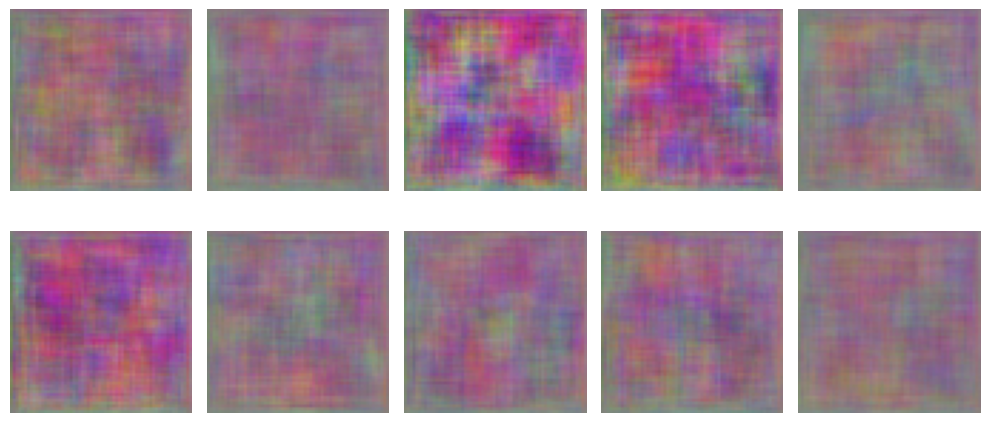

In [ ]:
# Rescale pixel values to [0, 1]
generated_images = (generated_images + 1) / 2

# Visualize the generated images
fig, axs = plt.subplots(2, 5, figsize=(10, 5))
for i in range(2):
    for j in range(5):
        idx = i * 5 + j
        if idx < generated_images.shape[0]:
            image = generated_images[idx]
            axs[i, j].imshow(image)
            axs[i, j].axis('off')

plt.tight_layout()
plt.show()

In [ ]:
noise = np.random.normal(0, 1, (batch_size, 1024))
text_embedding = np.random.randn(batch_size, 100)

# Generate random low-resolution images (replace this with your actual images)
input_lr_images = np.random.random((batch_size, 64, 64, 3))

# Predict using both noise and text embeddings
generated_images, _ = generator_stage2.predict([noise, input_lr_images])

1/1 [==============================] - 11s 11s/step


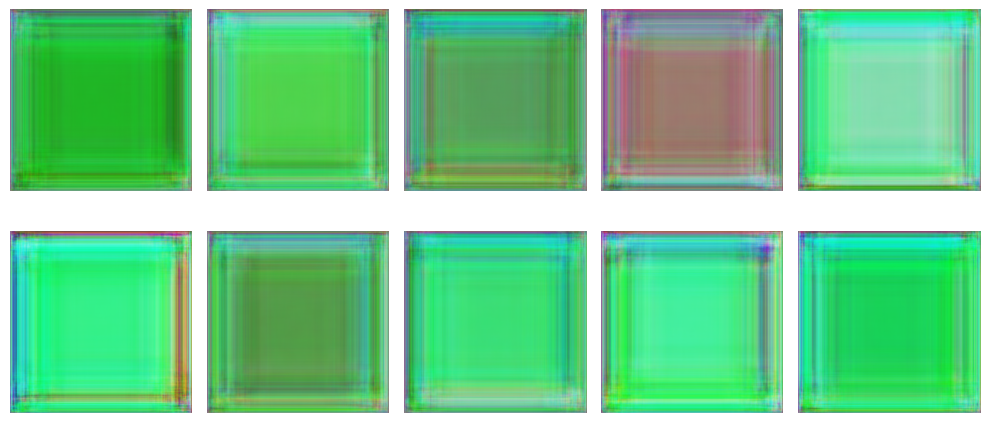

In [ ]:
# Rescale pixel values to [0, 1]
generated_images = (generated_images + 1) / 2

# Visualize the generated images
fig, axs = plt.subplots(2, 5, figsize=(10, 5))
for i in range(2):
    for j in range(5):
        idx = i * 5 + j
        if idx < generated_images.shape[0]:
            image = generated_images[idx]
            axs[i, j].imshow(image)
            axs[i, j].axis('off')

plt.tight_layout()
plt.show()

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.models import load_model

# Load saved generator and discriminator models
generator_epoch100 = load_model('/content/drive/MyDrive/krishna/Model_150/stage2_gen_model.h5')
generator_epoch150 = load_model('/content/drive/MyDrive/krishna/Model_150/stage1_gen_model.h5')
generator_epoch250 = load_model('/content/drive/MyDrive/krishna/Model/stage2_gen_model.h5')

discriminator_epoch100 = load_model('/content/drive/MyDrive/krishna/Model_bkp_100/stage2_dis_model.h5')
discriminator_epoch150 = load_model('/content/drive/MyDrive/krishna/Model_150/stage2_dis_model.h5')
discriminator_epoch250 = load_model('/content/drive/MyDrive/krishna/Model/stage2_dis_model.h5')

# Generate images using the generator at different epochs
num_samples = 25
latent_dim = 100
generated_images_epoch100 = generator_epoch100.predict(np.random.normal(0, 1, (num_samples, latent_dim)))
generated_images_epoch150 = generator_epoch150.predict(np.random.normal(0, 1, (num_samples, latent_dim)))
generated_images_epoch250 = generator_epoch250.predict(np.random.normal(0, 1, (num_samples, latent_dim)))



ValueError: ignored

In [ ]:

# Visualize generated images
def plot_generated_images(images, epoch):
    plt.figure(figsize=(5, 5))
    for i in range(images.shape[0]):
        plt.subplot(5, 5, i+1)
        plt.imshow(images[i])
        plt.axis('off')
    plt.suptitle(f'Generated Images (Epoch {epoch})')
    plt.show()

plot_generated_images(generated_images_epoch100, 100)
plot_generated_images(generated_images_epoch150, 150)
plot_generated_images(generated_images_epoch250, 250)

In [ ]:

# Evaluate discriminator outputs for generated images
def evaluate_discriminator(discriminator, images):
    discriminator_outputs = discriminator.predict(images)
    return discriminator_outputs.mean()

discriminator_output_epoch100 = evaluate_discriminator(discriminator_epoch100, generated_images_epoch100)
discriminator_output_epoch150 = evaluate_discriminator(discriminator_epoch150, generated_images_epoch150)
discriminator_output_epoch250 = evaluate_discriminator(discriminator_epoch250, generated_images_epoch250)

print(f"Discriminator Output (Epoch 100): {discriminator_output_epoch100}")
print(f"Discriminator Output (Epoch 150): {discriminator_output_epoch150}")
print(f"Discriminator Output (Epoch 250): {discriminator_output_epoch250}")